# Motivation

_What is the nature of this problem? Why is it paramount to solve this particular question?_

### Abstract Basis of Problem

_Currently, some sets exist which map some input towards some output. These sets represent function relationships. The question to answer is as follows: in regions where inputs are "similar" or "close" what is the approximate sameness of these functions' outputs? Do these relationships communicate similar outputs, or are these relationships rather fundamentally unique / distinct?
Why does this matter? Because we are talking about function relationships which exhibit drastically different levels of complexity. If a much simpler function can approximate a much more complex function in specific regions of interest, this suggests a highly advantageous compromise of a much lower degree of complexity in exchange for a statistically insignificant degree of compromise. This solution, if generalized beyond the scope of this initial research endeavor, offers potential applications in fields in which computational complexity is paramount and certain compromises in dataset size yield much more tangible or realistic results._

### Why does this matter?

_Currently, some sets exist which map some input towards some output. These sets represent function relationships. The question to answer is as follows: in regions where inputs are "similar" or "close" what is the approximate sameness of these functions' outputs? Do these relationships communicate similar outputs, or are these relationships rather fundamentally unique / distinct?_
_Why does this matter? Because we are talking about function relationships which exhibit drastically different levels of complexity. If a much simpler function can approximate a much more complex function in specific regions of interest, this suggests a highly advantageous compromise of a much lower degree of complexity in exchange for a statistically insignificant degree of compromise. This solution, if generalized beyond the scope of this initial research endeavor, offers potential applications in fields in which computational complexity is paramount and certain compromises in dataset size yield much more tangible or realistic results._


### Specific Problem in Question

_The Globe data set maps some geolocational position (lat, long) to a certain tree height. The ICESat-2 data product also maps a given geolocational position (lat, long) to a certain tree height.
We seek to better understand if there is an intrinsic, statistically significant difference between these two datasets. This is specifically interesting because the Globe dataset is intrinsically far less dense than the ICESat-2 dataset. Therefore, if this research does not demonstrate a demonstrable statistically significant difference between the two data products, the Globe dataset could, at least, offer a continual source of ground validation for the satellite data; and, at best, offer a much simpler way to calculate data products within a given region._

### Hypothesis

_There will be no statistically significant difference between the Globe tree height data and the ICESat-2 tree height data for Globe samples of a statistically significant size of n >= 30 within a given region. The region will be measured with four significant digits, up the hundreths placeholder, as a standard measure.
Although the Globe data is neither as comprehensive nor as complete as the ICESat-2 data, if the hypothesis is in fact true, this suggests that the Globe data set can serve as a strong source of ground validation for the satellite's measurements. In other words, it's not a question of "right" or "wrong," but rather to what degree can these datasets be understood to be in harmony?_

_Although the Globe data is neither as comprehensive nor as complete as the ICESat-2 data, if the hypothesis is in fact true, this suggests that the Globe data set can serve as a strong source of ground validation for the satellite's measurements. In other words, its not a question of "right" or "wrong," but rather to what degree can the datasets be understood to be in harmony?_

# General Methodology - Big Picture Focus

1. Load Globe Data
2. Visualize Globe Data
3. Modify Globe Data
4. Subset Globe Data into Data Structures
5. Load ICESat-2 Data by Globe Subset
6. Process ICESat-2 Data
7. Convert ICESat-2 Data into Data Structures
8. Calculate Error Product between corresponding Globe and ICESat-2 Data Structures
9. Extract key Error Metrics
10. Visualize Error Products
11. Analyze Results
12. Draw Conclusions
13. Discuss Conclusions and Procedures

# Import Modules

In [4]:
import pandas
from pandas import DataFrame
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import datetime
from datetime import datetime
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from icepyx import icesat2data as ipd
import os
import shutil
from pprint import pprint
%matplotlib inline
import h5py
import numpy as np
import os.path
import statistics
import math
from scipy import stats
from scipy.stats import pearsonr
import numpy as np
import matplotlib.pyplot as plt  # To visualize
import pandas as pd  # To read data
from sklearn.linear_model import LinearRegression
from scipy.stats import skew

ModuleNotFoundError: No module named 'pandas'

# Load Data

_Read a CSV file containing the Globe data and convert it into a Pandas dataframe._

_Below are instructions as to how to download Globe data without using the API. This comes for users who are not as familiar with the API format, so that the beginning of the process is not a formidable barrier to entry to following the remainder of the methodology._

In [430]:
print('1. Go to the following link:')
print('https://www.globe.gov/')
print('2. Under the Globe Data tab, choose Visualize Data')
print('https://www.globe.gov/globe-data/visualize-and-retrieve-data')
print('3. On the Visualization page, choose Enter the Visualization System')
print('https://vis.globe.gov/GLOBE/')
print('4. Go to the Protocol Layers Tab')
print('5. Select Biosphere')
print('6. Select Biometry - Tree Heights')
print('7. Select Tree Height')
print('8. Select All under Tree Heights Interval')
print('9. Click the three vertical dots to the right of Tree Height')
print('10. Select View Layer Table')
print('11. At the very bottom left, select Export CSV')
print('Save file - an example name for the file name is dv_tree_heights_07-30-2020.csv')

1. Go to the following link:
https://www.globe.gov/
2. Under the Globe Data tab, choose Visualize Data
https://www.globe.gov/globe-data/visualize-and-retrieve-data
3. On the Visualization page, choose Enter the Visualization System
https://vis.globe.gov/GLOBE/
4. Go to the Protocol Layers Tab
5. Select Biosphere
6. Select Biometry - Tree Heights
7. Select Tree Height
8. Select All under Tree Heights Interval
9. Click the three vertical dots to the right of Tree Height
10. Select View Layer Table
11. At the very bottom left, select Export CSV
Save file - an example name for the file name is dv_tree_heights_07-30-2020.csv


In [431]:
#the file name is the name of the file you just downloaded
def load():
    data = input('Please enter the file name: ')
    globe_data = pandas.read_csv(data) 
    return globe_data

In [432]:
globe_data = load()
#if you encounter an error at this stage, be sure you are accessing the proper directory 
#--> file will come from Downloads

Please enter the file name: dv_tree_heights_06-30-2020.csv


# Visualize Data

_Visualize Globe data on a 3-dimensional graph, using the (latitude, longitude) coordinate as the input and the measured height of the tree as the output. This should provide some insight into the relative distribution of tree heights as a function of geolocation._

In [434]:
def visualize(dataframe):
    lat = dataframe['Latitude'].values.tolist()
    long = dataframe['Longitude'].values.tolist()
    height = dataframe['Measured Value'].values.tolist()
    fig= plt.figure(figsize=(30,30))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(lat, long, height, c='r', marker='o')
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Longitude')
    ax.set_zlabel('Tree Height')
    return plt.show()

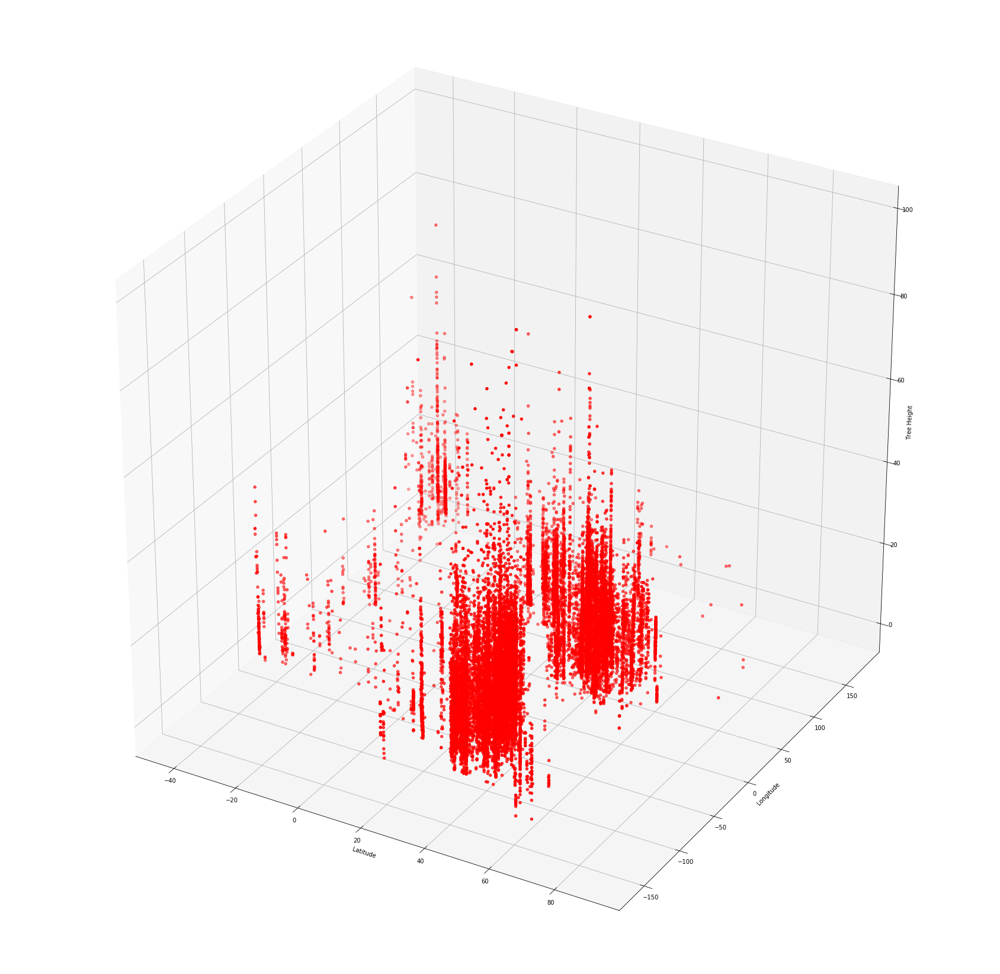

In [437]:
vis = visualize(globe_data)

# Modify Data

_The data needs to be modified in several key ways:_
1. Incorporate the element "Season" so as to avoid comparing points across seasons. Will yield much higher accuracy that reflects the true error product
2. Modify the latitude and longitude values in the dataframe so that the degree of precision of each measurement extends at most to the hundredths place. This was an experimentally determined decision based on attempting to balance accuracy while also considering computational limitations.

In [439]:
def add_season(dataframe):
    date = dataframe['Measured At'].values.tolist()
    date_l = []
    for obj in date:
        obj = obj[0:10]
        date_l.append(obj)
    rev_date_l = []
    for obj in date_l:
        my_date = datetime.strptime(obj, '%Y-%m-%d')
        rev_date_l.append(my_date)
    final_date_l = []
    for obj in rev_date_l:
        final_date_l.append(obj.month)
    season_l = []
    for obj in final_date_l:
        if obj == 12 or obj == 1 or obj == 2:
            season_l.append('Season 1')
        
        else:
            if obj == 3 or obj == 4 or obj == 5:
                season_l.append('Season 2')
            else:
                if obj == 6 or obj == 7 or obj == 8: 
                    season_l.append('Season 3')
                else:
                    if obj == 9 or obj == 10 or obj == 11:
                        season_l.append('Season 4')
    dataframe['Season'] = season_l
    return dataframe

In [446]:
def mod_lat_long(data):
    lat_list = list(data['Latitude'])
    long_list = list(data['Longitude'])
    lat = []
    for item in lat_list:
        lat.append(round(item, 2))
        #round all globe measurements to a whole number degree of precision
        #we can opt for more precision later on --> we are still in the testing phase
    long = []
    for item in long_list:
        long.append(round(item, 2))
    data['~Latitude'] = lat
    data['~Longitude'] = long
    data.sort_values(by = '~Latitude', ascending = False)
    return data

In [447]:
def mod_data(data):
    mod_season = add_season(data)
    mod_geo = mod_lat_long(mod_season)
    return mod_geo

In [448]:
mod_globe = mod_data(globe_data)

# Subset into Nested Dictionary

_Subset Globe Data by four seasons in order to isolate varying tree heights over the course of several seasons. This will also enable the dataset to be broken down into smaller chunks, which will be vital when it comes time to load the ICESat-2 data._
_Compartmentalize these distinct dataframes into four dictionaries. Each dictionary will map a specific geolocational tuple to a list of measured values. The tuple will comprise the input space, and the set of measured Globe values will comprise the output space._

_This will allow for a much higher degree of specificity in order to minimize error within the system (ie comparing tree heights from similar seasons which are very close in range in order to optimize accuracy of results and minimize error within the system)._

_A potential problem with regards to the mathematical treatment of this problem is that a function can only map one input to one output. Otherwise, it is not a function._
_A potential solution to this function describes statistical uncertainty between each input and the corresponding output. In other words, each input maps to some cloud of potential outputs, where each potential output is assigned a particular probability (which we will assume is uniformly distributed for now). The expected value of this distribution is the probability of finding each value multiplied by the actual value. The probability of finding any of the particular values is one. The probability of finding none of the values is zero. In other words, the output probability space can be described as being complete._


In [450]:
def season_constr(dataframe):
    dictionary = {}
    season_one = dataframe[dataframe['Season'] == 'Season 1']
    dictionary['Season 1'] = season_one
    season_two = dataframe[dataframe['Season'] == 'Season 2']
    dictionary['Season 2'] = season_two
    season_three = dataframe[dataframe['Season'] == 'Season 3']
    dictionary['Season 3'] = season_three
    season_four = dataframe[dataframe['Season'] == 'Season 4']
    dictionary['Season 4'] = season_four
    return dictionary

_Convert subsetted dataframes into dictionaries. The structure of dictionaries significantly lowers the algorithmic complexity of the search and sort algorithm._

In [451]:
def df_to_dict(df):
    lat = df['~Latitude'].tolist()
    long = df['~Longitude'].tolist()
    height = df['Measured Value'].tolist()
    loc = []
    for i in range(len(lat)):
        loc.append((lat[i], long[i]))
    #lets build a dummy dictionary
    dictionary = {}
    for item in loc:
        dictionary[item] = []
    for i in range(len(lat)):
        for key in dictionary:
            if key == loc[i]:
                val = dictionary.get(key)
                val.append(height[i])
    return dictionary

In [452]:
season = season_constr(mod_globe)

In [453]:
def nested_dict(dictionary):
    for key in dictionary:
        val = dictionary.get(key)
        inner_dict = df_to_dict(val)
        dictionary[key] = inner_dict
    return dictionary

In [454]:
nest_season = nested_dict(season)

_Need to break up the nested dictionary by season so we can evaluate error while controlling for season_

In [456]:
def divide_dictionary(nest_dict):
    season_one = nest_dict['Season 1']
    season_two = nest_dict['Season 2']
    season_three = nest_dict['Season 3']
    season_four = nest_dict['Season 4']
    return season_one, season_two, season_three, season_four

In [457]:
season_one, season_two, season_three, season_four = divide_dictionary(nest_season)

In [768]:
len(season_one)

852

In [769]:
len(season_two)

3139

In [770]:
len(season_three)

1423

In [771]:
len(season_four)

1128

# Subset Season Two

_From experimental observation, season two is simply too large to process individually. Needs to be broken up into 6 individual data structures in order to make processing more manageable._

In [806]:
data = mod_globe
data1 = data[data['Elevation'] < 25]

data2 = data[data['Elevation'] < 50]
data2 = data2[data2['Elevation'] > 25]

data3 = data[data['Elevation'] > 50]
data3 = data3[data3['Elevation'] < 150]

data4 = data[data['Elevation'] > 150]
data4 = data4[data4['Elevation'] < 200]

data5 = data[data['Elevation'] > 200]
data5 = data5[data5['Elevation'] < 400]

data6 = data[data['Elevation'] > 600]
data6 = data6[data6['Elevation'] < 6000]
data_list = [data1, data2, data3, data4, data5, data6]

In [807]:
season_list = []
for item in data_list:
    season = season_constr(item)
    season_list.append(season)
print(season_list)

[{'Season 1':                           School Name          Site Name  Latitude  Longitude  \
39     Abu baker alsedik basic school    SEKKET AL SOOQ1  26.11354   56.14561   
40     Abu baker alsedik basic school    SEKKET AL SOOQ1  26.11354   56.14561   
42     Abu baker alsedik basic school  al maziood farmer  23.11219   56.14270   
43     Abu baker alsedik basic school  al maziood farmer  23.11219   56.14270   
44     Abu baker alsedik basic school  al maziood farmer  23.11219   56.14270   
...                               ...                ...       ...        ...   
28601   West Visayas State University        51PVM059706  10.58841  122.13983   
29953        Yala Rajabhat University        47PNK967550   8.63852   99.87889   
29954        Yala Rajabhat University        47PNK967549   8.63762   99.87889   
29955        Yala Rajabhat University        47PNK967550   8.63852   99.87889   
29956        Yala Rajabhat University        47NQH532243   6.54746  101.28969   

       Elevat

In [808]:
season_two_list = []
for item in season_list:
    nest_season = nested_dict(item)
    season_one, season_two, season_three, season_four = divide_dictionary(nest_season)
    season_two_list.append(season_two)
print(season_two_list)
    

[{(26.11, 56.14): [17.74, 18.05, 9.73, 13.11, 11.99, 14.31, 16.36, 11.96, 11.85, 15.59, 12.88, 15.21, 12.37, 8.36, 7.09, 19.19, 18.12, 14.38, 16.15, 15.19, 13.12, 11.76], (26.11, 56.15): [12.95, 18.79, 13.83, 17.33, 12.21, 15.02, 6.57, 16.24, 13.1, 11.95, 8.52, 12.17, 14.16, 7.98, 11.23, 13.11, 10.79], (26.1, 56.15): [5.32, 5.4, 6.45, 7.07, 5.62, 6.39], (23.58, 57.05): [25.47, 20.46], (23.62, 58.49): [19.0, 21.47, 24.31, 19.03, 21.47, 23.96], (23.37, 58.29): [21.47, 24.27, 19.03], (-34.46, -58.86): [5.33, 5.29, 5.63, 7.33, 4.98, 5.15, 8.5, 6.53, 7.24, 6.32, 5.5, 6.71, 4.65, 5.08], (-34.26, -58.91): [6.97], (23.36, 58.29): [24.23], (-33.84, 151.17): [12.07, 12.99], (-38.27, 144.49): [17.29], (-38.28, 144.49): [17.6], (-33.69, 150.85): [33.65], (-33.86, 151.19): [12.21], (-34.4, 150.88): [17.34, 15.19], (-31.92, 115.86): [10.53, 9.42, 12.39, 18.8], (-31.94, 115.75): [11.64, 9.01], (-27.47, 153.1): [22.74, 13.65, 23.34, 10.08], (-27.48, 153.04): [31.99], (-33.69, 151.29): [7.4], (-32.42, 

In [809]:
for item in season_two_list:
    print(len(item))
#so the first 1000 have 3000 observations --> need to spread these out
#the first 2000 some observations are still in the first 200...

610
370
808
328
659
318


In [813]:
season_2a = season_two_list[0]
season_2b = season_two_list[1]  
season_2c = season_two_list[2]  
season_2d = season_two_list[3]  
season_2e = season_two_list[4]  
season_2f = season_two_list[5]  

# Load ICESat-2 Data

_Given a dictionary that maps a series of geolocational tuples to lists of values, we need to programmatically access granules of of ICESat-2 data one tuple at a time and build corresponding lists of tree heights from these granules. We will then compare the two lists of tree heights using two-sample T-distributions. We will classify the error as high or low based on the probability that the two data sets are similar, which is determined by the sample T-statistic._

_The generalized process is as follows:_
1. Employ check functions for each seasonal data structure to determine whether granules of ICESat-2 data exist for each respective key contained in the Globe dictionary.
2. Delete all keys from the Globe dictionary which do not contain corresponding granules of ICESat-2 data
3. Iterate through each dictionary and, for each key, download a granule of data which is a square with side length two epsilon encompassing the key. 
_This value epsilon needs to be small enough to minimize download time and obtain highly accurate measurements. However, it cannot be too small or many keys from the Globe dictionary will not return any granules of meaningful data. It was determined experimentally to make this epsilon value equal to .005 degrees, which is equal to approximately 555 meters._
4. Store these HDF5 files in a list of lists; each list of files corresponds to the files containing information for one particular key. Store a corresponding list of keys in order to map each list of files to a particular key.
5. Process ICESat-2 Data
6. Employ a series of functions to read a particular HDF5 file, and if its path exists within the computer, use a series of retrieval methods to extract tree heights from the hierarchical HDF5 structure. A note about path existence: the user may find it helpful to check the files are in the correct file or path prior to employing this function. Otherwise, the program may fail to read the files which the user just spent a painstaking amount of time downloading.
7. Convert ICESat-2 Data into Data Structures
8. Build a corresponding series of ICESat-2 dictionaries, one for each season, by mapping a given key to a list of ICESat-2 tree height measurements (the sane structure as the Globe dictionaries).

# Programmatically Access ICESat-2 Data

_The below functions accomplish the following goals:_
1. check whether, in a given time and geolocational range, granules of ICESat-2 data exist
2. If granules do not exist, an error is typically thrown
3. If granules do exist, granules are cleared for programmatic download 

## Season 1

In [482]:
def ice_check_one(key):
    lat = key[0]
    long = key[1]
    delta = 0.005
    #by experimental observation, you need a window of at least one in order to obtain enough granules for observation
    #need to make sure we do not exceed the lat, long bounds. Four edge cases to consider:
    #lat = +/- 90, long = +/- 180 
    #if any of the delta values pushes the sum out of bounds, reduce the value to just the lat or the long
    #we maintain the dimensions of 2 delta x 2 delta by readjusting during an edge case
    if (long - delta) < -180:
        entry_1 = long
        entry_3 = long + 2*delta
    else:
        if (long + delta) > 180:
            entry_1 = long - 2*delta
            entry_3 = long
        else:
            entry_1 = long - delta
            entry_3 = long + delta
    if (lat - delta) < -90:
        #boundary condtion
        entry_2 = lat
        entry_4 = lat + 2*delta
    else:
        if (lat + delta) > 90:
            entry_2 = lat - 2*delta
            entry_4 = lat
        else:
            entry_2 = lat - delta
            entry_4 = lat + delta
    if True:
        try:
            
            short_name = 'ATL08'   
            spatial_extent = [entry_1, entry_2, entry_3, entry_4]
            #entry 1, entry 3 are long values --> entry 2, 4 are lat values
            date_range = ['2018-12-01','2019-03-01']
            #we only want the data range to cover one specific season
            #from December 1st 2018 through March 1st 2019 = Season 1
            region_a = ipd.Icesat2Data(short_name, spatial_extent, date_range)
            if ids == True:
                ice_list = region_a.avail_granules(ids=True)
                ice_list = add_string(ice_list)
        except (AttributeError, AssertionError, UnboundLocalError):
            print('Oops! It appears the interval you gave is invalid. The key of the interval is' + '' + str(key))
            print('Try a different key!')
            ice_list = None
    return ice_list

In [520]:
def ice_download_one(key):
    lat = key[0]
    long = key[1]
    delta = 0.005
    #by experimental observation, you need a window of at least one in order to obtain enough granules for observation
    #need to make sure we do not exceed the lat, long bounds. Four edge cases to consider:
    #lat = +/- 90, long = +/- 180 
    #if any of the delta values pushes the sum out of bounds, reduce the value to just the lat or the long
    #we maintain the dimensions of 2 delta x 2 delta by readjusting during an edge case
    if (long - delta) < -180:
        entry_1 = long
        entry_3 = long + 2*delta
    else:
        if (long + delta) > 180:
            entry_1 = long - 2*delta
            entry_3 = long
        else:
            entry_1 = long - delta
            entry_3 = long + delta
    if (lat - delta) < -90:
        #boundary condtion
        entry_2 = lat
        entry_4 = lat + 2*delta
    else:
        if (lat + delta) > 90:
            entry_2 = lat - 2*delta
            entry_4 = lat
        else:
            entry_2 = lat - delta
            entry_4 = lat + delta
    if True:
        try: 
            short_name = 'ATL08'   
            spatial_extent = [entry_1, entry_2, entry_3, entry_4]
            #entry 1, entry 3 are long values --> entry 2, 4 are lat values
            date_range = ['2018-12-01','2019-03-01']
            region_a = ipd.Icesat2Data(short_name, spatial_extent, date_range)
            if ids == True:
                ice_list = region_a.avail_granules(ids=True)
                earthdata_uid = 'johnrobison23'
                email = 'johnrobisonnasa22@gmail.com'
                region_a.earthdata_login(earthdata_uid, email)
                path = 'Download'
                #region_a.subsetparams(Coverage=region_a.order_vars.wanted)
                #region_a.granules.orderIDs
                # without variable subsetting, or with variable subsetting if you have run region_a.order_granules(Coverage=region_a.order_vars.wanted)
                region_a.download_granules(path)
                ice_list = add_string(ice_list)
                print(ice_list)
        except (AssertionError, AttributeError, UnboundLocalError):
            print('Oops! It appears the interval you gave is invalid. The key of the interval is' + '' + str(key))
            print('Try a different key!')
    return ice_list

## Season 2

In [484]:
def ice_check_two(key):
    lat = key[0]
    long = key[1]
    delta = 0.005
    #by experimental observation, you need a window of at least one in order to obtain enough granules for observation
    #need to make sure we do not exceed the lat, long bounds. Four edge cases to consider:
    #lat = +/- 90, long = +/- 180 
    #if any of the delta values pushes the sum out of bounds, reduce the value to just the lat or the long
    #we maintain the dimensions of 2 delta x 2 delta by readjusting during an edge case
    if (long - delta) < -180:
        entry_1 = long
        entry_3 = long + 2*delta
    else:
        if (long + delta) > 180:
            entry_1 = long - 2*delta
            entry_3 = long
        else:
            entry_1 = long - delta
            entry_3 = long + delta
    if (lat - delta) < -90:
        #boundary condtion
        entry_2 = lat
        entry_4 = lat + 2*delta
    else:
        if (lat + delta) > 90:
            entry_2 = lat - 2*delta
            entry_4 = lat
        else:
            entry_2 = lat - delta
            entry_4 = lat + delta
    if True:
        try:
            short_name = 'ATL08'   
            spatial_extent = [entry_1, entry_2, entry_3, entry_4]
            #entry 1, entry 3 are long values --> entry 2, 4 are lat values
            date_range = ['2019-03-01','2019-06-01']
            #we only want the data range to cover one specific season
            #from March 1st 2019 through June 1st 2019 = Season 1
            region_a = ipd.Icesat2Data(short_name, spatial_extent, date_range)
            if ids == True:
                ice_list = region_a.avail_granules(ids=True)
                ice_list = add_string(ice_list)
        except (AttributeError, AssertionError):
            print('Oops! It appears the interval you gave is invalid. The key of the interval is' + '' + str(key))
            print('Try a different key!')
            ice_list = None
    return ice_list

In [ ]:
def ice_download_two(key):
    lat = key[0]
    long = key[1]
    delta = 0.005
    #by experimental observation, you need a window of at least one in order to obtain enough granules for observation
    #need to make sure we do not exceed the lat, long bounds. Four edge cases to consider:
    #lat = +/- 90, long = +/- 180 
    #if any of the delta values pushes the sum out of bounds, reduce the value to just the lat or the long
    #we maintain the dimensions of 2 delta x 2 delta by readjusting during an edge case
    if (long - delta) < -180:
        entry_1 = long
        entry_3 = long + 2*delta
    else:
        if (long + delta) > 180:
            entry_1 = long - 2*delta
            entry_3 = long
        else:
            entry_1 = long - delta
            entry_3 = long + delta
    if (lat - delta) < -90:
        #boundary condtion
        entry_2 = lat
        entry_4 = lat + 2*delta
    else:
        if (lat + delta) > 90:
            entry_2 = lat - 2*delta
            entry_4 = lat
        else:
            entry_2 = lat - delta
            entry_4 = lat + delta
      
    while True:
        try: 
            short_name = 'ATL08'   
            spatial_extent = [entry_1, entry_2, entry_3, entry_4]
            #entry 1, entry 3 are long values --> entry 2, 4 are lat values
            date_range = ['2019-03-01','2019-06-01']
            region_a = ipd.Icesat2Data(short_name, spatial_extent, date_range)
            if ids == True:
                ice_list = region_a.avail_granules(ids=True)  
                earthdata_uid = 'johnrobison23'
                email = 'johnrobisonnasa22@gmail.com'
                region_a.earthdata_login(earthdata_uid, email)
                path = 'Download'
                #region_a.subsetparams(Coverage=region_a.order_vars.wanted)
                #region_a.granules.orderIDs
                # without variable subsetting, or with variable subsetting if you have run region_a.order_granules(Coverage=region_a.order_vars.wanted)
                region_a.download_granules(path)
                ice_list = add_string(ice_list)
                print(ice_list)
        except (AssertionError, AttributeError, UnboundLocalError):
            print('Oops! It appears the interval you gave is invalid. The key of the interval is' + '' + str(key))
            print('Try a different key!')
    return ice_list

## Season 3

In [486]:
def ice_check_three(key):
    lat = key[0]
    long = key[1]
    delta = 0.005
    #by experimental observation, you need a window of at least one in order to obtain enough granules for observation
    #need to make sure we do not exceed the lat, long bounds. Four edge cases to consider:
    #lat = +/- 90, long = +/- 180 
    #if any of the delta values pushes the sum out of bounds, reduce the value to just the lat or the long
    #we maintain the dimensions of 2 delta x 2 delta by readjusting during an edge case
    if (long - delta) < -180:
        entry_1 = long
        entry_3 = long + 2*delta
    else:
        if (long + delta) > 180:
            entry_1 = long - 2*delta
            entry_3 = long
        else:
            entry_1 = long - delta
            entry_3 = long + delta
    if (lat - delta) < -90:
        #boundary condtion
        entry_2 = lat
        entry_4 = lat + 2*delta
    else:
        if (lat + delta) > 90:
            entry_2 = lat - 2*delta
            entry_4 = lat
        else:
            entry_2 = lat - delta
            entry_4 = lat + delta
    if True:
        try:
            short_name = 'ATL08'   
            spatial_extent = [entry_1, entry_2, entry_3, entry_4]
            #entry 1, entry 3 are long values --> entry 2, 4 are lat values
            date_range = ['2019-06-01','2019-09-01']
            #we only want the data range to cover one specific season
            #from June 1st 2019 through September 1st 2019 = Season 1
            region_a = ipd.Icesat2Data(short_name, spatial_extent, date_range)
            if ids == True:
                ice_list = region_a.avail_granules(ids=True)
                ice_list = add_string(ice_list)
        except (AttributeError, AssertionError):
            print('Oops! It appears the interval you gave is invalid. The key of the interval is' + '' + str(key))
            print('Try a different key!')
            ice_list = None
    return ice_list

In [ ]:
def ice_download_three(key):
    lat = key[0]
    long = key[1]
    delta = 0.005
    #by experimental observation, you need a window of at least one in order to obtain enough granules for observation
    #need to make sure we do not exceed the lat, long bounds. Four edge cases to consider:
    #lat = +/- 90, long = +/- 180 
    #if any of the delta values pushes the sum out of bounds, reduce the value to just the lat or the long
    #we maintain the dimensions of 2 delta x 2 delta by readjusting during an edge case
    if (long - delta) < -180:
        entry_1 = long
        entry_3 = long + 2*delta
    else:
        if (long + delta) > 180:
            entry_1 = long - 2*delta
            entry_3 = long
        else:
            entry_1 = long - delta
            entry_3 = long + delta
    if (lat - delta) < -90:
        #boundary condtion
        entry_2 = lat
        entry_4 = lat + 2*delta
    else:
        if (lat + delta) > 90:
            entry_2 = lat - 2*delta
            entry_4 = lat
        else:
            entry_2 = lat - delta
            entry_4 = lat + delta
    if True:
        try: 
            short_name = 'ATL08'   
            spatial_extent = [entry_1, entry_2, entry_3, entry_4]
            #entry 1, entry 3 are long values --> entry 2, 4 are lat values
            date_range = ['2019-06-01','2019-09-01']
            region_a = ipd.Icesat2Data(short_name, spatial_extent, date_range)
            if ids == True:
                ice_list = region_a.avail_granules(ids=True)  
                earthdata_uid = 'johnrobison23'
                email = 'johnrobisonnasa22@gmail.com'
                region_a.earthdata_login(earthdata_uid, email)
                path = 'Download'
                #region_a.subsetparams(Coverage=region_a.order_vars.wanted)
                #region_a.granules.orderIDs
                # without variable subsetting, or with variable subsetting if you have run region_a.order_granules(Coverage=region_a.order_vars.wanted)
                region_a.download_granules(path)
                ice_list = add_string(ice_list)
                print(ice_list)
        except (AssertionError, AttributeError, UnboundLocalError):
            print('Oops! It appears the interval you gave is invalid. The key of the interval is' + '' + str(key))
            print('Try a different key!')
    return ice_list

## Season 4

In [500]:
def ice_check_four(key):
    lat = key[0]
    long = key[1]
    delta = 0.005
    #by experimental observation, you need a window of at least one in order to obtain enough granules for observation
    #need to make sure we do not exceed the lat, long bounds. Four edge cases to consider:
    #lat = +/- 90, long = +/- 180 
    #if any of the delta values pushes the sum out of bounds, reduce the value to just the lat or the long
    #we maintain the dimensions of 2 delta x 2 delta by readjusting during an edge case
    if (long - delta) < -180:
        entry_1 = long
        entry_3 = long + 2*delta
    else:
        if (long + delta) > 180:
            entry_1 = long - 2*delta
            entry_3 = long
        else:
            entry_1 = long - delta
            entry_3 = long + delta
    if (lat - delta) < -90:
        #boundary condtion
        entry_2 = lat
        entry_4 = lat + 2*delta
    else:
        if (lat + delta) > 90:
            entry_2 = lat - 2*delta
            entry_4 = lat
        else:
            entry_2 = lat - delta
            entry_4 = lat + delta
    if True:
        try:
            short_name = 'ATL08'   
            spatial_extent = [entry_1, entry_2, entry_3, entry_4]
            #entry 1, entry 3 are long values --> entry 2, 4 are lat values
            date_range = ['2019-09-01','2019-12-01']
            #we only want the data range to cover one specific season
            #from June 1st 2019 through September 1st 2019 = Season 1
            region_a = ipd.Icesat2Data(short_name, spatial_extent, date_range)
            if ids == True:
                ice_list = region_a.avail_granules(ids=True)
                ice_list = add_string(ice_list)
        except (AttributeError, AssertionError, UnboundLocalError, KeyError):
            print('Oops! It appears the interval you gave is invalid. The key of the interval is' + '' + str(key))
            print('Try a different key!')
            ice_list = None
    return ice_list

In [501]:
def ice_download_four(key):
    lat = key[0]
    long = key[1]
    delta = 0.005
    #by experimental observation, you need a window of at least one in order to obtain enough granules for observation
    #need to make sure we do not exceed the lat, long bounds. Four edge cases to consider:
    #lat = +/- 90, long = +/- 180 
    #if any of the delta values pushes the sum out of bounds, reduce the value to just the lat or the long
    #we maintain the dimensions of 2 delta x 2 delta by readjusting during an edge case
    if (long - delta) < -180:
        entry_1 = long
        entry_3 = long + 2*delta
    else:
        if (long + delta) > 180:
            entry_1 = long - 2*delta
            entry_3 = long
        else:
            entry_1 = long - delta
            entry_3 = long + delta
    if (lat - delta) < -90:
        #boundary condtion
        entry_2 = lat
        entry_4 = lat + 2*delta
    else:
        if (lat + delta) > 90:
            entry_2 = lat - 2*delta
            entry_4 = lat
        else:
            entry_2 = lat - delta
            entry_4 = lat + delta
      
    if True:
        try: 
            short_name = 'ATL08'   
            spatial_extent = [entry_1, entry_2, entry_3, entry_4]
            #entry 1, entry 3 are long values --> entry 2, 4 are lat values
            date_range = ['2019-09-01','2019-12-01']
            region_a = ipd.Icesat2Data(short_name, spatial_extent, date_range)
            if ids == True:
                ice_list = region_a.avail_granules(ids=True)  
                earthdata_uid = 'johnrobison23'
                email = 'johnrobisonnasa22@gmail.com'
                region_a.earthdata_login(earthdata_uid, email)
                path = 'Download'
                #region_a.subsetparams(Coverage=region_a.order_vars.wanted)
                #region_a.granules.orderIDs
                # without variable subsetting, or with variable subsetting if you have run region_a.order_granules(Coverage=region_a.order_vars.wanted)
                region_a.download_granules(path)
                ice_list = add_string(ice_list)
                print(ice_list)
       
        except (AssertionError, AttributeError, UnboundLocalError, KeyError):
            print('Oops! It appears the interval you gave is invalid. The key of the interval is' + '' + str(key))
            print('Try a different key!')
    return ice_list

In [495]:
def del_key(dictionary, bad_key):
    for key in dictionary:
        if key in bad_key:
            del dictionary[key]
    return dictionary

In [ ]:
def check_keys(dictionary):
    bad_key = []
    for key in dictionary:
        if ice_check(key) is None:
            bad_key.append(key)
            print(key)
        else:
            print('ok')
    return bad_key

In [ ]:
check1 = check_keys(season_one)

In [ ]:
season_one = del_key(season_one, check1)

In [ ]:
check2 = check_keys(season_two)

In [ ]:
season_two = del_key(season_two, check2)

In [ ]:
check3 = check_keys(season_three)

In [ ]:
season_three = del_key(season_three, check3)

In [ ]:
check4 = check_keys(season_four)

In [ ]:
season_four = del_key(season_four, check4)

# Download Data

__These download and check functions require a series of built in error catching mechanisms, as huge downloads are prone to an inconsistent flow of errors and bugs. Each download takes approximately 8-10 hours using a standard Mac and a Google Chrome browser, so one bug can throw a wrench into an entire day worth of downloading. These bugs are something to be very wary of, should this procedure be repeated.__

In [522]:
def download(dictionary):
    key_list = []
    file_list = []
    for key in dictionary:
        file = ice_download(key)
        if file is not None:
            file_list.append(file)
            key_list.append(key)
    return file_list, key_list

_The download time is the most intensive part of this research study. Each dictionary takes several days to process, and the computer must remain active at all times or risk aborting the connection._

In [523]:
file_one, key_one = download(season_one)
    

Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739008
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178335023:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367333:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT26.347S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739008 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191010064005_02040507_003_01.h5', '

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178179381:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178335023:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367333:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT9.127S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739036 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190928185922_00290501_003_01.h5', 'processed_ATL08_20191010064005_02040507_003_01.h5', 'processed_ATL08_20191027173525_04710501_003_01.h5', 'processed_ATL08_20191108051608_06460507_003_01.h5']
Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739038
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please 

Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178333520:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178220997:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179126474:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT10.706S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739057 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191003143638_01020509_003_01.h5', 'processed_ATL08_20191023014748_03990513_003_01.h5', 'processed_ATL08_20191101131239_05440509_003_01.h5', 'processed_ATL08_20191121002349_08410513_003_01.h5', 'processed_ATL08_20191130114841_09860509_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is subm

Data request 5000000739079 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904015154_10380409_003_01.h5', 'processed_ATL08_20190927125447_00090513_003_01.h5', 'processed_ATL08_20191026113051_04510513_003_01.h5', 'processed_ATL08_20191104225544_05960509_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739082
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178321563:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT10.926S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739082 of  1  order(

Data request 5000000739111 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919131124_12740413_003_01.h5', 'processed_ATL08_20190929003620_00320509_003_01.h5', 'processed_ATL08_20191018114729_03290513_003_01.h5', 'processed_ATL08_20191027231224_04740509_003_01.h5', 'processed_ATL08_20191116102334_07710513_003_01.h5', 'processed_ATL08_20191129214005_09770509_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739114
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323192:NoMatchingDa

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739135
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178321563:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179139704:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT14.066S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739135 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904015154_10380409_003_01.h5', 'processed_ATL08_20190927125447_00090513_003_01.h5', 'processed_ATL08_20191026113051_04510513_003_01.h5'

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178321563:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179139704:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT23.057S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739156 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904015154_10380409_003_01.h5', 'processed_ATL08_20190927125447_00090513_003_01.h5', 'processed_ATL08_20191026113051_04510513_003_01.h5', 'processed_ATL08_20191104225544_05960509_003_01.h5', 'processed_ATL08_20191124100653_08930513_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739160
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments

order ID:  5000000739185
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178321563:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179139704:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT11.462S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739185 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904015154_10380409_003_01.h5', 'processed_ATL08_20190927125447_00090513_003_01.h5', 'processed_ATL08_20191026113051_04510513_003_01.h5', 'processed_ATL08_20191104225544_05960509_003_01.h5', 'processed_ATL08_20191124100653_08930513_003_01.h5']


Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739269
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178007686:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178323204:NoM

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739290
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316922:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305927:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179127802:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT28.556S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739290 of  1  or

Data request 5000000739304 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902040326_10090407_003_01.h5', 'processed_ATL08_20191103010714_05670507_003_01.h5', 'processed_ATL08_20191103130132_05750501_003_01.h5', 'processed_ATL08_20191201234316_10090507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739307
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316922:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305927:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179127802:NoMatchingData - No data found tha

Data request 5000000739326 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902040326_10090407_003_01.h5', 'processed_ATL08_20191103010714_05670507_003_01.h5', 'processed_ATL08_20191103130132_05750501_003_01.h5', 'processed_ATL08_20191201234316_10090507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739330
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178179933:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316839:NoMatchingData - No data f

Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178178870:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311434:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332339:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303710:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105611:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT28.318S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739349 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901224735_10060402_003_01.h5', 'processed_

Data request 5000000739367 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901224735_10060402_003_01.h5', 'processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20190930212340_00610502_003_01.h5', 'processed_ATL08_20191019085752_03430506_003_01.h5', 'processed_ATL08_20191102195122_05640502_003_01.h5', 'processed_ATL08_20191117073355_07850506_003_01.h5', 'processed_ATL08_20191201182724_10060502_003_01.h5']
Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739371
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178178870:NoMatchingData - No data found that matched subset constrai

Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178369018:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179125176:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT29.726S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739390 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913141102_11830413_003_01.h5', 'processed_ATL08_20191026000343_04440509_003_01.h5', 'processed_ATL08_20191114111452_07410513_003_01.h5', 'processed_ATL08_20191123223944_08860509_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739394
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. P

Data request 5000000739407 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191003042349_00960502_003_01.h5', 'processed_ATL08_20191030151542_05150506_003_01.h5', 'processed_ATL08_20191101025951_05380502_003_01.h5', 'processed_ATL08_20191128135143_09570506_003_01.h5', 'processed_ATL08_20191130013553_09800502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739408
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178910135:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178909951:NoMatchingData - No data found that matched subset constraints. '
 'Exit cod

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197461:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179126989:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT26.582S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739414 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190927065744_00060502_003_01.h5', 'processed_ATL08_20191026053348_04480502_003_01.h5', 'processed_ATL08_20191101173257_05470506_003_01.h5', 'processed_ATL08_20191130160859_09890506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739415
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please conti

Data request 5000000739420 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL08_20190925191334_13700406_003_01.h5', 'processed_ATL08_20191024174938_04250506_003_01.h5', 'processed_ATL08_20191026053348_04480502_003_01.h5', 'processed_ATL08_20191124040950_08900502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739421
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178332551:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949709:NoMatchingData - No data found that matched subset constraints. '
 'Exit cod

order ID:  5000000739427
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311998:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT44.716S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739427 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190921192153_13090406_003_01.h5'

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184237:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949709:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT16.775S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739434 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919071421_12710402_003_01.h5', 'processed_ATL08_20190925191334_13700406_003_01.h5', 'processed_ATL08_20191022054208_03870502_003_01.h5', 'processed_ATL08_20191120041810_08290502_003_01.h5', 'processed_ATL08_20191126161720_09280506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739435
Initial status of your order request at NSIDC is:  pending
Your o

Data request 5000000739440 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923165617_13380406_003_01.h5', 'processed_ATL08_20191003042349_00960502_003_01.h5', 'processed_ATL08_20191101025951_05380502_003_01.h5', 'processed_ATL08_20191124140004_08960506_003_01.h5', 'processed_ATL08_20191130013553_09800502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739441
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178006879:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332784:NoMatchingData - No data found that matched subset constraints. '
 'Ex

Data request 5000000739449 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190908104645_11050406_003_01.h5', 'processed_ATL08_20190926213200_13870402_003_01.h5', 'processed_ATL08_20191007092251_01600506_003_01.h5', 'processed_ATL08_20191025200804_04420502_003_01.h5', 'processed_ATL08_20191109075033_06630506_003_01.h5', 'processed_ATL08_20191123184406_08840502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739450
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178316663:NoMatchingData - No data foun

Data request 5000000739456 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190924033150_13450402_003_01.h5', 'processed_ATL08_20191023020754_04000502_003_01.h5', 'processed_ATL08_20191029140704_04990506_003_01.h5', 'processed_ATL08_20191127124305_09410506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739457
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Y

order ID:  5000000739463
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178325342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332339:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305022:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117056:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT19.872S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739463 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913222236_11890402_003_01.h5', 'processed_ATL08_20191

Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184553:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303558:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368062:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179109312:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT26.364S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739470 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902180332_10180406_003_01.h5', 'processed_ATL08_20190929043208_00350502_003_01.h5', 'processed_ATL08_20191001163938_00730506_003_01.h5', 'processed_ATL08_20191101025951_05380502_003_01.h5', 'processed_ATL08_20191103150721_05760506_003_01.h5

order ID:  5000000739477
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178179745:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178335785:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178323535:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179125568:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT28.588S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(8.94, 11.35)
Try a different key!
Total numb

Data request 5000000739482 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923212310_13410403_003_01.h5', 'processed_ATL08_20190929093404_00380505_003_01.h5', 'processed_ATL08_20191026195055_04570503_003_01.h5', 'processed_ATL08_20191028081008_04800505_003_01.h5', 'processed_ATL08_20191124182657_08990503_003_01.h5', 'processed_ATL08_20191126064610_09220505_003_01.h5', 'processed_ATL08_20191130063749_09830505_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739483
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. P

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739488
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334571:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197573:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368564:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107392:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT13.615S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739488 of  1  orde

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739494
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178337939:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT38.615S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739494 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915181541_12170401_00

Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334751:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303710:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368318:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT35.360S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739502 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901224735_10060402_003_01.h5', 'processed_ATL08_20190908104645_11050406_003_01.h5', 'processed_ATL08_20190930212340_00610502_003_01.h5', 'processed_ATL08_20191007092251_01600506_003_01.h5', 'processed_ATL08_20191102195122_05640502_003_01.h5', 'processed_ATL08_20191109075033_06630506_003_01.h5', 'processed_ATL08_20191201182724_1006050

Data request 5000000739509 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903064621_10260407_003_01.h5', 'processed_ATL08_20191027160108_04700501_003_01.h5', 'processed_ATL08_20191104035010_05840507_003_01.h5']
Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739510
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323656:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT10.583S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739510 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903064621_10260407_003_01.h5', 'processed_ATL08_20191027160108_04700501_003_01.h5', 'processed

Data request 5000000739519 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903064621_10260407_003_01.h5', 'processed_ATL08_20191027160108_04700501_003_01.h5', 'processed_ATL08_20191104035010_05840507_003_01.h5']
Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739520
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323656:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT18.298S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739520 of  1  order(s) is downloaded.
Download complete
['processed_ATL08

Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178197510:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117682:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105723:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT23.153S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739531 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190927034910_00040502_003_01.h5', 'processed_ATL08_20191024144104_04230506_003_01.h5', 'processed_ATL08_20191026022513_04460502_003_01.h5', 'processed_ATL08_20191122131705_08650506_003_01.h5', 'processed_ATL08_20191128005255_0949050

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739539
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311491:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330512:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197275:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117068:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT17.320S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739539 of  1  orde

Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178306806:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330538:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178304682:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367168:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT26.602S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739545 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190914233114_12050402_003_01.h5', 'processed_ATL08_20191013220719_02600502_003_01.h5', 'processed_ATL08_20191016101449_02980506_003_01.h5', 'processed_ATL08_20191111204322_07020502_003_01.h5', 'processed_ATL08_20191114085053_07400506_003_01.h5

Data request 5000000739551 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913114703_11820406_003_01.h5', 'processed_ATL08_20190914233114_12050402_003_01.h5', 'processed_ATL08_20191013220719_02600502_003_01.h5', 'processed_ATL08_20191114085053_07400506_003_01.h5', 'processed_ATL08_20191115203504_07630502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739552
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178197478:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117685:NoMatchingData - No data found that matched subset constraints. '
 'Exit cod

Data request 5000000739558 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915062123_12090407_003_01.h5', 'processed_ATL08_20191018044908_03250507_003_01.h5', 'processed_ATL08_20191022163508_03940501_003_01.h5', 'processed_ATL08_20191116032513_07670507_003_01.h5', 'processed_ATL08_20191120151110_08360501_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739559
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178306902:NoMatchingData - No data found that matched subset constraints. '

Data request 5000000739567 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191007195823_01670502_003_01.h5', 'processed_ATL08_20191027070655_04640506_003_01.h5', 'processed_ATL08_20191105183425_06090502_003_01.h5', 'processed_ATL08_20191125054258_09060506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739568
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178311575:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184779:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330556:NoMatchingData - No data found that matched subs

Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178330680:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108949:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT34.824S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739574 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916023839_12220406_003_01.h5', 'processed_ATL08_20190925140612_13670402_003_01.h5', 'processed_ATL08_20191019010624_03380506_003_01.h5', 'processed_ATL08_20191116234229_07800506_003_01.h5', 'processed_ATL08_20191126110958

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739581
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178178863:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332520:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949707:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT24.352S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739581 of  1 

Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178336000:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324860:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941139:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT33.902S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739587 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911062942_11480407_003_01.h5', 'processed_ATL08_20191014045728_02640507_003_01.h5', 'processed_ATL08_20191031155247_05310501_003_01.h5', 'processed_ATL08_20191112033332_07060507_003_01.h5', 'processed_ATL08_20191129142849_0973050

Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180539:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334780:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197064:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT27.823S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739593 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907111224_10900406_003_01.h5', 'processed_ATL08_20190912224814_11740402_003_01.h5', 'processed_ATL08_20191010094010_02060506_003_01.h5', 'processed_ATL08_20191015211600_02900502_003_01.h5', 'processed_ATL08_20191108081613_0648050

Data request 5000000739599 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190908170354_11090406_003_01.h5', 'processed_ATL08_20190910044804_11320402_003_01.h5', 'processed_ATL08_20191007154000_01640506_003_01.h5', 'processed_ATL08_20191009032410_01870502_003_01.h5', 'processed_ATL08_20191105141603_06060506_003_01.h5', 'processed_ATL08_20191111015153_06900502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739600
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178303718:NoMatchingDa

Data request 5000000739605 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190927103919_00080507_003_01.h5', 'processed_ATL08_20190927223336_00160501_003_01.h5', 'processed_ATL08_20191026091523_04500507_003_01.h5', 'processed_ATL08_20191128193721_09610501_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739606
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317406:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178337914:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179125924:NoMatchingData - No data found tha

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739614
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180654:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334536:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368282:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT14.340S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739614 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906045623_10710402_003_01.h5', 'processe

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739622
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317007:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178323030:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367266:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941439:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT27.165S',
 'ICESAT2']
Your order is: c

Data request 5000000739629 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906035506_10700407_003_01.h5', 'processed_ATL08_20190923145029_13370401_003_01.h5', 'processed_ATL08_20191005023113_01250507_003_01.h5', 'processed_ATL08_20191124115415_08950501_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739630
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178910135:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941377:NoMatchingData - No data f

Data request 5000000739636 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904001737_10370409_003_01.h5', 'processed_ATL08_20190927112030_00080513_003_01.h5', 'processed_ATL08_20191002225344_00920509_003_01.h5', 'processed_ATL08_20191031212946_05340509_003_01.h5', 'processed_ATL08_20191128082415_09530513_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739637
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323158:NoMatchingData - No data found that matched subset constraints. '
 '

Data request 5000000739642 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919213128_12800403_003_01.h5', 'processed_ATL08_20190929093404_00380505_003_01.h5', 'processed_ATL08_20191018200733_03350503_003_01.h5', 'processed_ATL08_20191028081008_04800505_003_01.h5', 'processed_ATL08_20191120183517_08380503_003_01.h5', 'processed_ATL08_20191126064610_09220505_003_01.h5', 'processed_ATL08_20191130063749_09830505_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739643
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317334:NoMatchingData - No data found that matched subset constrai

Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178179941:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178335246:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT30.720S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739649 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190908212217_11120402_003_01.h5', 'processed_ATL08_20190928083052_00220506_003_01.h5', 'processed_ATL08_20191007195823_01670502_003_01.h5', 'processed_ATL08_20191031065835_05250506_003_01.h5', 'processed_ATL08_20191129053437_09670506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739650
Initial status of your order request at NSIDC is:  pen

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739655
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178325342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332339:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117056:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT25.864S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739655 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916103006_12270406_003_01.h5', 'processe

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739662
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180812:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325254:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334899:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368318:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT12.583S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739662 of  1  order(s) i

order ID:  5000000739668
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311434:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117056:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT40.967S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739668 of 

Data request 5000000739676 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913222236_11890402_003_01.h5', 'processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20191012205841_02440502_003_01.h5', 'processed_ATL08_20191019085752_03430506_003_01.h5', 'processed_ATL08_20191114192625_07470502_003_01.h5', 'processed_ATL08_20191117073355_07850506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739677
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178325342:NoMatchingData 

Data request 5000000739683 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190921220558_13110402_003_01.h5', 'processed_ATL08_20190924101329_13490406_003_01.h5', 'processed_ATL08_20191020204203_03660502_003_01.h5', 'processed_ATL08_20191027084113_04650506_003_01.h5', 'processed_ATL08_20191118191805_08080502_003_01.h5', 'processed_ATL08_20191125071715_09070506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739684
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178325382:NoMatchingDa

Data request 5000000739690 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913222236_11890402_003_01.h5', 'processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20191012205841_02440502_003_01.h5', 'processed_ATL08_20191110193443_06860502_003_01.h5', 'processed_ATL08_20191117073355_07850506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739691
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178306883:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303957:NoMatchingData - No data found that matched subset constraints. '
 'Exit cod

Data request 5000000739698 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923162446_13380401_003_01.h5', 'processed_ATL08_20191018031451_03240507_003_01.h5', 'processed_ATL08_20191116015056_07660507_003_01.h5', 'processed_ATL08_20191124132832_08960501_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739699
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178336240:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179125575:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941376:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT9.702S',
 'ICESAT2']
Your order is: complete_with_err

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739706
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180392:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178336184:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178323642:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367384:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT14.451S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739706 of  1  orde

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311255:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184780:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107532:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT19.364S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739713 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190908104645_11050406_003_01.h5', 'processed_ATL08_20190926213200_13870402_003_01.h5', 'processed_ATL08_20191025200804_04420502_003_01.h5', 'processed_ATL08_20191109075033_06630506_003_01.h5', 'processed_ATL08_20191123184406_08840502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739714
Initial status of your order request at NSIDC is:  pending
Your o

Data request 5000000739723 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190917160537_12460403_003_01.h5', 'processed_ATL08_20190921155718_13070403_003_01.h5', 'processed_ATL08_20190925045932_13610405_003_01.h5', 'processed_ATL08_20190929045112_00350505_003_01.h5', 'processed_ATL08_20191016144141_03010503_003_01.h5', 'processed_ATL08_20191020143323_03620503_003_01.h5', 'processed_ATL08_20191024033537_04160505_003_01.h5', 'processed_ATL08_20191024142504_04230503_003_01.h5', 'processed_ATL08_20191028032716_04770505_003_01.h5', 'processed_ATL08_20191101031855_05380505_003_01.h5', 'processed_ATL08_20191118130926_08040503_003_01.h5', 'processed_ATL08_20191122130106_08650503_003_01.h5', 'processed_ATL08_20191126020318_09190505_003_01.h5', 'processed_ATL08_20191130015457_09800505_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739726
Initial status of your order request at NSIDC is

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739734
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178179707:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324496:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941236:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.154S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739734 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190928031628_00190501_003_01.h5', 'processed_ATL08_20191001151351_00720507_003_01.h5', 'processed_ATL08_20191027015232_04610501_003_01.h5', 'pro

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323170:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178008051:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178217610:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179138738:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179125122:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.587S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739742 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190922040301_13140413_003_01.h5', 'processed_ATL08_20190923154435_13370409_003_01.h5', 'processed_ATL08_20191021023906_03690513_003_01.h5', 'processed_ATL08_20191022142039_03920509_003_01.h5', 'processed_ATL08_20191119011508_08110513_003_01.h5', 'processe

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739756
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178334880:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325481:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368396:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303790:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.943S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(39.79, -89.66)
Try a different key!
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NS

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739767
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178179322:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179127132:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108569:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.288S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739767 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901070441_09960402_003_01.h5', 'processed_ATL08_20190928175636_00280506_003_01.h5', 'processed_ATL08_20190930054046_00510502_003_01.h5', 'pro

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739776
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334827:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368310:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '177731370:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.305S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739776 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL0

Data request 5000000739783 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191001051507_00660502_003_01.h5', 'processed_ATL08_20191003172238_01040506_003_01.h5', 'processed_ATL08_20191030035111_05080502_003_01.h5', 'processed_ATL08_20191101155839_05460506_003_01.h5', 'processed_ATL08_20191128022712_09500502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739784
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312097:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179118960:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.900S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped out

Data request 5000000739793 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902190618_10190401_003_01.h5', 'processed_ATL08_20191013052308_02490507_003_01.h5', 'processed_ATL08_20191103161007_05770501_003_01.h5', 'processed_ATL08_20191111035910_06910507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739794
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178336164:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305919:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367403:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.747S',
 'ICESAT2']
Your order is: complete_wi

Data request 5000000739802 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190922231436_13270402_003_01.h5', 'processed_ATL08_20191020100630_03590506_003_01.h5', 'processed_ATL08_20191025214221_04430502_003_01.h5', 'processed_ATL08_20191118084233_08010506_003_01.h5', 'processed_ATL08_20191123201823_08850502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739803
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178184418:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316753:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332729:

Download complete
['processed_ATL08_20190911042225_11470402_003_01.h5', 'processed_ATL08_20191010025830_02020502_003_01.h5', 'processed_ATL08_20191016145741_03010506_003_01.h5', 'processed_ATL08_20191112012614_07050502_003_01.h5', 'processed_ATL08_20191114133345_07430506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739811
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '177731370:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.637S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739811 of  1  order(s) is downl

order ID:  5000000739822
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is invalid. The key of the interval is(24.11, 120.63)
Try a different key!
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739823
Initial status of your order request at NSIDC is:  failed
Oops! It appears the interval you gave is invalid. The key of the interval is(34.15, -118.13)
Try a different key!
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739824
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178180427:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316725:NoMatchingData 

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739837
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178323398:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178335728:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941126:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT29.964S',
 'ICESAT2']
Your order is: comp

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317254:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941126:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT10.189S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739844 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915044706_12080407_003_01.h5', 'processed_ATL08_20190915164123_12160401_003_01.h5', 'processed_ATL08_20191014032311_02630507_003_01.h5', 'processed_ATL08_20191116134513_07740501_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739845
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error m

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739854
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178336240:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178323398:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179125575:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.589S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739854 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191018031451_03240507_003_01.h5', 'processed_ATL08_20191018150908_03320501_003_01.h5', 'processed_ATL08_20191116015056_07660507_003_01.h5', 'pro

Data request 5000000739864 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923162446_13380401_003_01.h5', 'processed_ATL08_20191018031451_03240507_003_01.h5', 'processed_ATL08_20191022150051_03930501_003_01.h5', 'processed_ATL08_20191116015056_07660507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739865
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is: complete
Beginning download of zipped output...
Data request 5000000739865 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190927042209_00040507_003_01.h5', 'processed_ATL08_20190927161627_00120501_003_01.h5', 'processed_ATL08_20191026145230_04540501_003_01.h5', 'processed_ATL08_20191128012554_09490507_003_01.h5']
Total number of data order requests is  1  for  4  granule

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739875
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311460:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330538:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197521:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367168:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105634:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.134S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739875 of  1  order(s) is down

Data request 5000000739883 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191003085939_00990501_003_01.h5', 'processed_ATL08_20191010204842_02130507_003_01.h5', 'processed_ATL08_20191101073541_05410501_003_01.h5', 'processed_ATL08_20191108192445_06550507_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739884
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311430:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303528:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.444S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739884 of  1  order(s) is 

order ID:  5000000739894
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178945313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.309S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739894 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190917193011_12480406_003_01.h5', 'processed_ATL08_20191022054208_03870502_003_01.h5', 'processed_ATL08_20191118163400_08060506_003_01.h5', 'processed_ATL08_20191120041810_08290502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739895
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is in

Data request 5000000739903 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901182912_10030406_003_01.h5', 'processed_ATL08_20190915054823_12090402_003_01.h5', 'processed_ATL08_20191102153300_05610506_003_01.h5', 'processed_ATL08_20191116025213_07670502_003_01.h5', 'processed_ATL08_20191201140901_10030506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739904
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178909839:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184552:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334647:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739913
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183408:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178317190:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178322192:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178336226:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.619S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739913 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190908101513_11050401_003_01.h5', 'processed_ATL0

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739922
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316084:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184553:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303558:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179109312:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.346S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739922 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902180332_10180406_003_01.h5', 'processed_ATL0

order ID:  5000000739932
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is invalid. The key of the interval is(39.46, -78.04)
Try a different key!
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739933
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178330472:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367165:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105722:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.807S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739933 of

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316154:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334536:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303703:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.308S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000739945 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904171213_10480406_003_01.h5', 'processed_ATL08_20191003154820_01030506_003_01.h5', 'processed_ATL08_20191005033230_01260502_003_01.h5', 'processed_ATL08_20191103020832_05680502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000739946
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please 

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740030
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178325477:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178331049:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303951:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367143:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.902S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(42.62, -113.67)
Try a different key!
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to N

order ID:  5000000740039
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183976:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178317412:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178322256:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179125945:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.266S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740039 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906172341_10790401_003_01.h5', 'processed_ATL08_20190927042209_00040507_003_01.h5', 'processed_ATL08_20191005155947_01340501_003_01.h5', 'processed_ATL08_

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178197061:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.013S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740046 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911172114_11550406_003_01.h5', 'processed_ATL08_20191016033309_02940502_003_01.h5', 'processed_ATL08_20191112142503_07130506_003_01.h5', 'processed_ATL08_20191114020914_07360502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740047
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307313:NoMatchingData - No data found that matched subset cons

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334827:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368310:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '177731370:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.117S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740064 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_20191017030730_03090502_003_01.h5', 'processed_ATL08_20191109140743_06670506_003_01.h5', 'processed_ATL08_20191115014335_07510502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NS

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740072
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311998:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197461:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105662:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.475S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740072 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190921192153_13090406_003_01.h5', 'processed_ATL0

order ID:  5000000740079
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311998:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197461:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.200S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740079 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190921192153_13090406_003_01.h5', 'processed_ATL08_20191020175758_03640506_003_01.h5', 'processed_ATL08_20191026053348_04480502_003_01.h5', 'processed_ATL08_20191124040950_08900502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740080
Initial status of you

Data request 5000000740086 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904171213_10480406_003_01.h5', 'processed_ATL08_20190906045623_10710402_003_01.h5', 'processed_ATL08_20191003154820_01030506_003_01.h5', 'processed_ATL08_20191105141603_06060506_003_01.h5', 'processed_ATL08_20191107020013_06290502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740087
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311998:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197461:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105662:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740094
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334827:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368310:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.432S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740094 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_20191017030730_03090502_003_01.h5', 'pro

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740102
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316801:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324296:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949707:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105723:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.833S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740102 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190929155639_00420506_003_01.h5', 'processed_ATL0

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740109
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311250:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178307313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334827:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368310:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '177731370:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.247S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740109 of  1  order(s) is down

Data request 5000000740116 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_20191017030730_03090502_003_01.h5', 'processed_ATL08_20191109140743_06670506_003_01.h5', 'processed_ATL08_20191115014335_07510502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740117
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180630:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334668:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303720:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740124
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178178833:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316770:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325329:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117782:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.207S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740124 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903074739_10270402_003_01.h5', 'processed_ATL0

Data request 5000000740131 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_20191017030730_03090502_003_01.h5', 'processed_ATL08_20191109140743_06670506_003_01.h5', 'processed_ATL08_20191115014335_07510502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740132
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316770:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325329:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117782:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740143
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311430:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196911:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117076:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945465:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.774S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740143 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916164715_12310406_003_01.h5', 'processed_ATL0

order ID:  5000000740151
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311343:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196911:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366900:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945439:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.491S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740151 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190912165534_11700406_003_01.h5', 'processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740161
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184412:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197480:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945465:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.777S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740161 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916164715_12310406_003_01.h5', 'processed_ATL08_20190926041449_13760402_003_01.h5', 'processed_ATL08_20191025025053_04310502_003_01.h5', 'pro

Data request 5000000740169 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190924064024_13470402_003_01.h5', 'processed_ATL08_20190926184755_13850406_003_01.h5', 'processed_ATL08_20191023051629_04020502_003_01.h5', 'processed_ATL08_20191025172359_04400506_003_01.h5', 'processed_ATL08_20191121035231_08440502_003_01.h5', 'processed_ATL08_20191127155140_09430506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740170
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184428:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316770:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197367:NoMatchingData - No data fou

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740177
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311343:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178307313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197025:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368310:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.004S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740177 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190912165534_11700406_003_01.h5', 'processed_ATL0

Data request 5000000740184 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916164715_12310406_003_01.h5', 'processed_ATL08_20190922042307_13150402_003_01.h5', 'processed_ATL08_20191025025053_04310502_003_01.h5', 'processed_ATL08_20191117135105_07890506_003_01.h5', 'processed_ATL08_20191123012654_08730502_003_01.h5']
Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740185
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178315662:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325654:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368303:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

order ID:  5000000740192
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311430:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330550:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366900:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945465:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.428S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740192 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916164715_12310406_003_01.h5', 'processed_ATL08_20190922042307_13150402_003_01.h5', 'processed_ATL08_20191015152320_02860506_003_01.h5', 'processed_ATL08_

Your order is:  failed
NSIDC provided these error messages:
['178180051:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311359:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325428:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330934:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303865:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.864S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(44.68, -72.18)
Try a different key!
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740202
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your orde

order ID:  5000000740210
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178197510:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117682:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107522:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.284S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740210 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923035729_13300402_003_01.h5', 'processed_ATL08_20191024144104_04230506_003_01.h5', 'processed_ATL08_20191026022513_04460502_003_01.h5', 'processed_ATL08_20191122131705_08650506_003_01.h5', 'processed_ATL08_20191124010115_08880502_003_01.h5']
Total 

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740219
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311998:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332551:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197461:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.007S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740219 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190921192153_13090406_003_01.h5', 'processed_ATL0

Data request 5000000740226 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907172933_10940406_003_01.h5', 'processed_ATL08_20191006160540_01490506_003_01.h5', 'processed_ATL08_20191008034950_01720502_003_01.h5', 'processed_ATL08_20191104144142_05910506_003_01.h5', 'processed_ATL08_20191106022552_06140502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740227
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311458:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178307000:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366757:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

order ID:  5000000740234
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180630:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332478:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303528:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179118787:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.726S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740234 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905052202_10560402_003_01.h5', 'processed_ATL08_20191004035810_01110502_003_01.h5', 'processed_ATL08_20191023150643_04080506_003_01.h5', 'processed_ATL08_

Data request 5000000740241 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906045623_10710402_003_01.h5', 'processed_ATL08_20191003154820_01030506_003_01.h5', 'processed_ATL08_20191005033230_01260502_003_01.h5', 'processed_ATL08_20191101142422_05450506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740242
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311458:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366757:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178944602:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.432S',
 'ICESAT2']
Your order is: complete_wi

Data request 5000000740250 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901182912_10030406_003_01.h5', 'processed_ATL08_20190924050607_13460402_003_01.h5', 'processed_ATL08_20190930170517_00580506_003_01.h5', 'processed_ATL08_20191027033351_04620502_003_01.h5', 'processed_ATL08_20191029154121_05000506_003_01.h5', 'processed_ATL08_20191125020953_09040502_003_01.h5', 'processed_ATL08_20191201140901_10030506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740251
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311998:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184772:NoMatchingData - No data found that matched subset constraints. '
 'Ex

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740258
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334827:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368310:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.500S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740258 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_20191017030730_03090502_003_01.h5', 'pro

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740266
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316734:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332689:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105632:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.372S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740266 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190928045747_00200502_003_01.h5', 'processed_ATL08_20190930170517_00580506_003_01.h5', 'processed_ATL08_20191029154121_05000506_003_01.h5', 'pro

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740274
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180096:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.932S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740274 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909051344_11170402_003_01.h5', 'processed_ATL08_20191008034950_01720502_003_01.h5', 'processed_ATL08_20191010155719_02100506_003_01.h5', 'pro

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312874:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178310730:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197764:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330884:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178199293:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178199450:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368118:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117476:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.178S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740281 of  1  order(s) is downloaded.
Download

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740289
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184418:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316753:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.741S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740289 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL0

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740297
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178306883:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316625:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305022:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949633:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.986S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740297 of  1  order(s) is down

NameError: name 'file_one' is not defined

In [ ]:
file_2a, key_2a = download(season_2a)

Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750568
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178335023:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367333:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.726S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750568 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191010064005_02040507_003_01.h5', 'processed_ATL08_20191027173525_04710501_003_01.h5', 'processed_ATL08_20191108051608_06460507_003_01.h5']
Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting 

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750579
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178321563:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179139704:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.338S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750579 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904015154_10380409_003_01.h5', 'processed_ATL08_20190927125447_00090513_003_01.h5', 'processed_ATL08_20191026113051_04510513_003_01.h5', 'processed_ATL08_20191104225544_05960509_003_01.h5', 'processed_ATL08_20191124100653_08930513_003_0

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750588
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178008389:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178338492:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178369030:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.157S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750588 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911132803_11520413_003_01.h5', 'processed_ATL08_20190929003620_00320509_003_01.h5', 'processed_ATL08_20191027231224_04740509_003_01.h5', 'pro

Data request 5000000750598 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904015154_10380409_003_01.h5', 'processed_ATL08_20190927125447_00090513_003_01.h5', 'processed_ATL08_20191026113051_04510513_003_01.h5', 'processed_ATL08_20191104225544_05960509_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750599
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178008389:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178338492:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178369030:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.909S',
 'ICESAT2']
Your order is: complete_wi

Data request 5000000750608 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913053824_11780407_003_01.h5', 'processed_ATL08_20191004162527_01190501_003_01.h5', 'processed_ATL08_20191102150128_05610501_003_01.h5', 'processed_ATL08_20191114024214_07360507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750609
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317097:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305952:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT7.066S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750609 of  1  order(s) is 

Data request 5000000750617 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191011004429_02150514_003_01.h5', 'processed_ATL08_20191015123018_02840508_003_01.h5', 'processed_ATL08_20191108232032_06570514_003_01.h5', 'processed_ATL08_20191113110622_07260508_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750618
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178321858:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178333175:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311553:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.503S',
 'ICESAT2']
Your order is: complete_wi

Data request 5000000750628 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904202048_10500406_003_01.h5', 'processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL08_20191003185655_01050506_003_01.h5', 'processed_ATL08_20191105172437_06080506_003_01.h5', 'processed_ATL08_20191124040950_08900502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750629
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178910135:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178909951:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178335169:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184418:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316753:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197461:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.444S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750637 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL08_20190929190514_00440506_003_01.h5', 'processed_ATL08_20191026053348_04480502_003_01.h5', 'processed_ATL08_20191124040950_08900502_003_01.h5', 'processed_ATL08_20191130160859_09890506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750638
Initial status of your order request at NSIDC is:  processing
Your

order ID:  5000000750648
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184418:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316753:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197461:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.215S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750648 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL08_20190929190514_00440506_003_01.h5', 'processed_ATL08_20191026053348_04480502_003_01.h5', 'processed_ATL08_20191124040950_08900502_003_01.h5', 'processed_ATL08_20191130160859_09890506_003_01.h5']
Total 

Data request 5000000750658 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL08_20190929190514_00440506_003_01.h5', 'processed_ATL08_20191026053348_04480502_003_01.h5', 'processed_ATL08_20191124040950_08900502_003_01.h5', 'processed_ATL08_20191130160859_09890506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750659
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180812:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311255:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.415S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped out

Data request 5000000750665 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913222236_11890402_003_01.h5', 'processed_ATL08_20191012205841_02440502_003_01.h5', 'processed_ATL08_20191019085752_03430506_003_01.h5', 'processed_ATL08_20191114192625_07470502_003_01.h5', 'processed_ATL08_20191117073355_07850506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750666
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178325342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332339:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305022:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312658:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197946:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305441:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178306430:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368118:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.230S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750675 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911214807_11580403_003_01.h5', 'processed_ATL08_20190913100721_11810405_003_01.h5', 'processed_ATL08_20191010202412_02130503_003_01.h5', 'processed_ATL08_20191012084327_02360505_003_01.h5', 'processed_ATL08_20191110071929_06780505_003_01.h5', 'processe

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750684
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334780:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196888:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945469:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.691S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750684 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911110404_11510406_003_01.h5', 'processed_ATL08_20190921220558_13110402_003_01.h5', 'processed_ATL08_20191010094010_02060506_003_01.h5', 'processed

Data request 5000000750692 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906221335_10820402_003_01.h5', 'processed_ATL08_20191008085711_01750506_003_01.h5', 'processed_ATL08_20191106073314_06170506_003_01.h5', 'processed_ATL08_20191107191724_06400502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750693
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334723:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368421:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303115:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.372S',
 'ICESAT2']
Your order is: complete_wi

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750700
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178006835:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178338087:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.478S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750700 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916192419_12330401_003_01.h5', 'processed_ATL08_20190928070505_00210507_003_01.h5', 'processed_ATL08_20191027054108_04630507_003_01.h5', 'processed_ATL08_20191117162808_07910501_003_01.h5']
Total number of data order requests is  1  for

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750709
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316688:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332520:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197664:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949707:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.014S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750709 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190925160459_13680406_003_01.h5', 'processed_ATL0

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178322172:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324860:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179124465:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.553S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750718 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191002171645_00890501_003_01.h5', 'processed_ATL08_20191031035830_05230507_003_01.h5', 'processed_ATL08_20191031155247_05310501_003_01.h5', 'processed_ATL08_20191129023432_09650507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750719
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please 

order ID:  5000000750727
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184193:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178317389:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178322526:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178336510:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128672:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.526S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000750727 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913173241_11860401_003_01.h5', 'processed_ATL08_20190925051

order ID:  5000000750737
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178316688:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184774:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332520:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197510:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107522:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.047S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(40.01, -75.04)
Try a different key!
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:

Data request 5000000750744 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919104725_12730406_003_01.h5', 'processed_ATL08_20190920223137_12960402_003_01.h5', 'processed_ATL08_20191018092330_03280506_003_01.h5', 'processed_ATL08_20191019210742_03510502_003_01.h5', 'processed_ATL08_20191120075114_08310506_003_01.h5', 'processed_ATL08_20191121193524_08540502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000750745
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is invalid. The key of the interval is(45.49, 13.22)
Try a different key!


In [ ]:
time.sleep(20)

In [ ]:
file_2b, key_2b = download(season_2b)

In [ ]:
time.sleep(20)

In [ ]:
file_2c, key_2c = download(season_2c)

In [ ]:
time.sleep(20)

In [ ]:
file_2d, key_2d = download(season_2d)

In [ ]:
time.sleep(20)

In [ ]:
file_2e, key_2e = download(season_2e)

In [ ]:
time.sleep(20)

In [ ]:
file_2f, key_2f = download(season_2f)

In [ ]:
file_two = []
file_two = file_two + file_2a
file_two = file_two + file_2b
file_two = file_two + file_2c
file_two = file_two + file_2d
file_two = file_two + file_2e
file_two = file_two + file_2f

key_two = []
key_two = key_two + key_2a
key_two = key_two + key_2b
key_two = key_two + key_2c
key_two = key_two + key_2d
key_two = key_two + key_2e
key_two = key_two + key_2f

In [599]:
file_three, key_three = download(season_three)

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742294
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311942:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184354:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332519:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945451:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117682:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.824S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742294 of  1  order(s) is down

order ID:  5000000742301
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316633:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324975:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332609:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179126818:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.882S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742301 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190928083052_00220506_003_01.h5', 'processed_ATL08_20191007195823_01670502_003_01.h5', 'processed_ATL08_20191027070655_04640506_003_01.h5', 'processed_ATL08_

Data request 5000000742308 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911132803_11520413_003_01.h5', 'processed_ATL08_20190929003620_00320509_003_01.h5', 'processed_ATL08_20191027231224_04740509_003_01.h5', 'processed_ATL08_20191112103152_07100513_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742309
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178333051:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178369130:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311917:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179140388:NoMatchingData - No data found that mat

Data request 5000000742316 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915030418_12070406_003_01.h5', 'processed_ATL08_20190916144828_12300402_003_01.h5', 'processed_ATL08_20191014014023_02620506_003_01.h5', 'processed_ATL08_20191019131614_03460502_003_01.h5', 'processed_ATL08_20191112001627_07040506_003_01.h5', 'processed_ATL08_20191117115218_07880502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742317
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312091:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.769S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742317 of  1  o

Data request 5000000742323 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190929023744_00330513_003_01.h5', 'processed_ATL08_20191016134558_03000509_003_01.h5', 'processed_ATL08_20191114122202_07420509_003_01.h5', 'processed_ATL08_20191129234129_09780513_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742324
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178316801:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324296:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332796:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197664:NoMatchingData - No data found that matched subset co

Data request 5000000742331 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902102738_10130408_003_01.h5', 'processed_ATL08_20191001090343_00680508_003_01.h5', 'processed_ATL08_20191008205256_01820514_003_01.h5', 'processed_ATL08_20191106192859_06240514_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742332
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316471:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180096:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368342:NoMatchingData - No data found that mat

Data request 5000000742339 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913031100_11760413_003_01.h5', 'processed_ATL08_20191012014706_02310513_003_01.h5', 'processed_ATL08_20191029125521_04980509_003_01.h5', 'processed_ATL08_20191127113123_09400509_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742341
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178321512:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178007335:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178957875:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179138657:NoMatchingData - No data found that mat

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742348
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178324312:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334743:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197715:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368309:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105718:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.616S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742348 of  1  order(s) is down

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742357
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312091:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184553:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330909:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179116928:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108999:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.674S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742357 of  1  order(s) is down

order ID:  5000000742364
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178306827:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325336:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332423:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '177731370:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117076:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.194S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(43.96, -79.24)
Try a different key!
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742371
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311271:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178327971:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197638:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366711:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.853S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742371 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909163815_11240406_003_01.h5', 'processed_ATL0

Data request 5000000742377 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190908201229_11110406_003_01.h5', 'processed_ATL08_20190919071421_12710402_003_01.h5', 'processed_ATL08_20191007184835_01660506_003_01.h5', 'processed_ATL08_20191018055026_03260502_003_01.h5', 'processed_ATL08_20191105172437_06080506_003_01.h5', 'processed_ATL08_20191120041810_08290502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742378
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178178831:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178327971:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334761:NoMatchingData - No data fou

Your order is:  failed
NSIDC provided these error messages:
['178306827:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332423:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '177731370:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117076:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.136S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(43.96, -79.25)
Try a different key!
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742385
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311947:NoMatchingData - N

order ID:  5000000742393
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178007502:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178333099:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178369341:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.659S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742393 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906044219_10700414_003_01.h5', 'processed_ATL08_20190927152913_00110508_003_01.h5', 'processed_ATL08_20191026140517_04530508_003_01.h5', 'processed_ATL08_20191107014608_06280514_003_01.h5']
Total number of data order requests is  1  for  5  granules

Data request 5000000742400 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915090528_12110403_003_01.h5', 'processed_ATL08_20190924210806_13560405_003_01.h5', 'processed_ATL08_20190928205946_00300505_003_01.h5', 'processed_ATL08_20191014074134_02660503_003_01.h5', 'processed_ATL08_20191027193549_04720505_003_01.h5', 'processed_ATL08_20191112061737_07080503_003_01.h5', 'processed_ATL08_20191116060918_07690503_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742401
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184921:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178315041:NoMatchingData - No data found that matched subset constraints. '
 'Ex

Data request 5000000742406 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919071421_12710402_003_01.h5', 'processed_ATL08_20190925191334_13700406_003_01.h5', 'processed_ATL08_20191022054208_03870502_003_01.h5', 'processed_ATL08_20191120041810_08290502_003_01.h5', 'processed_ATL08_20191126161720_09280506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742407
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184237:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742414
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949709:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.397S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742414 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190925191334_13700406_003_01.h5', 'processed_ATL08_20191022054208_03870502_003_01.h5', 'processed_ATL08_20191120041810_08290502_003_01.h5', 'pro

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742422
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316663:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197023:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332665:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178944602:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949719:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.458S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742422 of  1  order(s) is down

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742429
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178315920:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334426:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197477:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334905:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108998:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.152S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742429 of  1  order(s) is down

Data request 5000000742435 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902193750_10190406_003_01.h5', 'processed_ATL08_20190925061445_13620402_003_01.h5', 'processed_ATL08_20191001181356_00740506_003_01.h5', 'processed_ATL08_20191024045050_04170502_003_01.h5', 'processed_ATL08_20191030164959_05160506_003_01.h5', 'processed_ATL08_20191126031831_09200502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742436
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180806:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311378:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303582:NoMatchingData - No data fou

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312097:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332429:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178304295:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179118960:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.542S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742443 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190912070521_11640402_003_01.h5', 'processed_ATL08_20190918190432_12630406_003_01.h5', 'processed_ATL08_20191021173219_03790506_003_01.h5', 'processed_ATL08_20191113040910_07220502_003_01.h5', 'processed_ATL08_20191119160821_08210506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NS

order ID:  5000000742452
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183562:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178336481:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178306185:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.435S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742452 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190910044103_11320401_003_01.h5', 'processed_ATL08_20191008152251_01790507_003_01.h5', 'processed_ATL08_20191106135854_06210507_003_01.h5', 'processed_ATL08_20191111014451_06900501_003_01.h5']
Total number of data order requests is  1  for  4  granules

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742460
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334751:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367965:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.923S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742460 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190922214019_13260402_003_01.h5', 'processed_ATL08_20191007092251_01600506_003_01.h5', 'processed_ATL08_20191105075853_06020506_003_01.h5', 'processed_ATL08_20191123184406_08840502_003_01.h5']
Total number of data order requests is  1  for

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180476:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332339:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117056:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.135S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742467 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909223055_11280402_003_01.h5', 'processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20191012205841_02440502_003_01.h5', 'processed_ATL08_20191019085752_03430506_003_01.h5', 'processed_ATL08_20191110193443_06860502_003_01.h5', 'processed_ATL08_20191117073355_07850506_003_01.h5']
Total number of data order requests is  1  for  4  

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307056:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197035:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332606:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305022:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179126804:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.400S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742474 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190917221417_12500402_003_01.h5', 'processed_ATL08_20190928100509_00230506_003_01.h5', 'processed_ATL08_20191016205021_03050502_003_01.h5', 'processed_ATL08_20191027084113_04650506_003_01.h5', 'processed_ATL08_20191114192625_07470502_003_01.h5', 'processe

order ID:  5000000742480
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184298:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316752:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196836:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945318:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179126994:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.805S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742480 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923053146_13310402_003_01.h5', 'processed_ATL08_20190929173

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742487
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311942:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197275:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332519:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117068:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945451:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.243S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742487 of  1  order(s) is down

Data request 5000000742493 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913222236_11890402_003_01.h5', 'processed_ATL08_20191012205841_02440502_003_01.h5', 'processed_ATL08_20191019085752_03430506_003_01.h5', 'processed_ATL08_20191114192625_07470502_003_01.h5', 'processed_ATL08_20191117073355_07850506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742495
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178325342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332339:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305022:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Data request 5000000742502 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190908212217_11120402_003_01.h5', 'processed_ATL08_20190928083052_00220506_003_01.h5', 'processed_ATL08_20191007195823_01670502_003_01.h5', 'processed_ATL08_20191027070655_04640506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742503
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178007405:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178224617:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178959723:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.515S',
 'ICESAT2']
Your order is: complete_wi

Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742509
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180027:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334636:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303645:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128327:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.927S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742509 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901103745_09980406_003_01.h5', 'processed_ATL0

Data request 5000000742515 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907215626_10970403_003_01.h5', 'processed_ATL08_20190911214807_11580403_003_01.h5', 'processed_ATL08_20190913100721_11810405_003_01.h5', 'processed_ATL08_20191010202412_02130503_003_01.h5', 'processed_ATL08_20191016083506_02970505_003_01.h5', 'processed_ATL08_20191108190015_06550503_003_01.h5', 'processed_ATL08_20191114071111_07390505_003_01.h5']
Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742516
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178184984:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311213:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 

Data request 5000000742522 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906113803_10750406_003_01.h5', 'processed_ATL08_20191002220640_00920502_003_01.h5', 'processed_ATL08_20191005101410_01300506_003_01.h5', 'processed_ATL08_20191031204242_05340502_003_01.h5', 'processed_ATL08_20191103085011_05720506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742523
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311460:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325433:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330538:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742530
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311288:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184382:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334755:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368405:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108917:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.715S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742530 of  1  order(s) is down

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742537
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316676:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325376:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178304728:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949660:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.504S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742537 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190912224814_11740402_003_01.h5', 'processed_ATL0

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742544
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184460:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '177731369:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.077S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742544 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918214838_12650402_003_01.h5', 'processed_ATL08_20191003093111_00990506_003_01.h5', 'processed_ATL08_20191017202441_03200502_003_01.h5', 'processed_ATL08_20191115190046_07620502_003_01.h5']
Total number of data order requests is  1  for

Data request 5000000742551 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906045623_10710402_003_01.h5', 'processed_ATL08_20191003154820_01030506_003_01.h5', 'processed_ATL08_20191005033230_01260502_003_01.h5', 'processed_ATL08_20191101142422_05450506_003_01.h5', 'processed_ATL08_20191103020832_05680502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742552
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180466:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334742:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325336:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178315691:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334636:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325263:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368287:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303690:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128327:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.093S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742559 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901103745_09980406_003_01.h5', 'processed_ATL08_20190902222155_10210402_003_01.h5', 'processed_ATL08_20191004090532_01140506_003_01.h5', 'processed_ATL08_201

Data request 5000000742566 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919025559_12680406_003_01.h5', 'processed_ATL08_20191018013203_03230506_003_01.h5', 'processed_ATL08_20191023130756_04070502_003_01.h5', 'processed_ATL08_20191121114357_08490502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742567
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334536:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179127004:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.499S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742567 of  1  order(s) is 

Data request 5000000742574 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909051344_11170402_003_01.h5', 'processed_ATL08_20190911172114_11550406_003_01.h5', 'processed_ATL08_20191008034950_01720502_003_01.h5', 'processed_ATL08_20191010155719_02100506_003_01.h5', 'processed_ATL08_20191110021732_06750502_003_01.h5', 'processed_ATL08_20191112142503_07130506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742575
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184317:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368291:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945283:NoMatchingData - No data fou

order ID:  5000000742582
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178179403:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316068:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334542:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324907:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367990:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108572:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.290S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742582 of  1  order(s) is downloaded.
Downl

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316471:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324907:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303720:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT8.430S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742589 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905052202_10560402_003_01.h5', 'processed_ATL08_20190907172933_10940406_003_01.h5', 'processed_ATL08_20191004035810_01110502_003_01.h5', 'processed_ATL08_20191006160540_01490506_003_01.h5', 'processed_ATL08_20191106022552_06140502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742590
Initial status of your order request at NSIDC is:  processing
Your

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742597
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311649:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332495:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197478:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT8.455S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742597 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190925112207_13650406_003_01.h5', 'processed_ATL08_20191024095811_04200506_003_01.h5', 'processed_ATL08_20191025214221_04430502_003_01.h5', 'processed

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742604
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180439:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT10.296S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742604 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190910172224_11400402_003_01.h5', 'processed_ATL08_20190922044737_13150406_003_01.h5', 'processed_ATL08_20191009155829_01950502_003_01.h5', 'processed_ATL08_20191107143432_06370502_003_01.h5', 'processed_ATL08_20191123015124_08730506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is

Data request 5000000742612 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911183102_11560402_003_01.h5', 'processed_ATL08_20191001053936_00660506_003_01.h5', 'processed_ATL08_20191030041540_05080506_003_01.h5', 'processed_ATL08_20191112153451_07140502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742613
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184278:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178336000:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367377:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.360S',
 'ICESAT2']
Your order is: complete_wi

Data request 5000000742621 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190920054725_12850407_003_01.h5', 'processed_ATL08_20191011163426_02260501_003_01.h5', 'processed_ATL08_20191109151029_06680501_003_01.h5', 'processed_ATL08_20191121025113_08430507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742622
Initial status of your order request at NSIDC is:  pending
Your order status is still  pending  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317081:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178322220:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178306014:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT7.411S',
 'ICESAT2']
Your order is: complete_with_err

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742630
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['179128618:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941243:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.888S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742630 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190927175044_00130501_003_01.h5', 'processed_ATL08_20191030042410_05080507_003_01.h5', 'processed_ATL08_20191128030012_09500507_003_01.h5', 'processed_ATL08_20191128145429_09580501_003_01.h5']
Total number of data order requests is  1  for

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742638
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183785:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196944:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945346:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.044S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742638 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190922055725_13160402_003_01.h5', 'processed_ATL08_20190924180456_13540406_003_01.h5', 'processed_ATL08_20191021043330_03710502_003_01.h5', 'pro

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742646
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180574:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334551:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178335246:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.744S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742646 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190912211357_11730402_003_01.h5', 'processed_ATL08_20191002082232_00830506_003_01.h5', 'processed_ATL08_20191011195003_02280502_003_01.h5', 'pro

Data request 5000000742653 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923211440_13410402_003_01.h5', 'processed_ATL08_20191004090532_01140506_003_01.h5', 'processed_ATL08_20191022195045_03960502_003_01.h5', 'processed_ATL08_20191102074133_05560506_003_01.h5', 'processed_ATL08_20191120182646_08380502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742654
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334636:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368287:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742661
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311295:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325176:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178304064:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366760:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.359S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742661 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909051344_11170402_003_01.h5', 'processed_ATL0

Data request 5000000742668 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190925191334_13700406_003_01.h5', 'processed_ATL08_20190927065744_00060502_003_01.h5', 'processed_ATL08_20191024174938_04250506_003_01.h5', 'processed_ATL08_20191030052528_05090502_003_01.h5', 'processed_ATL08_20191122162540_08670506_003_01.h5', 'processed_ATL08_20191128040129_09510502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742669
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316645:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334628:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197396:NoMatchingData - No data fou

Total number of data order requests is  1  for  8  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742676
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311468:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367169:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117030:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945448:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107399:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.752S',
 'ICESAT2']
Your order is: complete_with_e

Your order is:  failed
NSIDC provided these error messages:
['178311369:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178331023:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197378:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366890:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945448:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.096S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(54.9, 23.89)
Try a different key!
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742683
Initial status of your order request at NSIDC is:  processing
Your order status is s

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742690
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178311369:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184288:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178331023:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197378:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366890:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945448:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.343S',
 'ICESAT2']
Request failed.
Oops! It appears the interva

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742698
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178321778:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.302S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742698 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190908075342_11030408_003_01.h5', 'processed_ATL08_20190915194256_12170414_003_01.h5', 'processed_ATL08_20191014181901_02720514_003_01.h5', 'processed_ATL08_20191109045731_06610508_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742699
Initial 

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184774:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316801:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949707:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105723:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.804S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742706 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190927034910_00040502_003_01.h5', 'processed_ATL08_20190929155639_00420506_003_01.h5', 'processed_ATL08_20191028143242_04840506_003_01.h5', 'processed_ATL08_20191126130845_09260506_003_01.h5', 'processed_ATL08_20191128005255_09490502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NS

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742714
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178368259:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105633:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128321:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.396S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742714 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901165454_10020406_003_01.h5', 'processed_ATL08_20190928032330_00190502_003_01.h5', 'processed_ATL08_20191102135842_05600506_003_01.h5', 'pro

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742722
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178180063:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311944:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325262:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332369:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303689:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117029:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.129S',
 'ICESAT2']
Request failed.
Oops! It appears the interva

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311368:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332187:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197521:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366869:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107877:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.336S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742729 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913114703_11820406_003_01.h5', 'processed_ATL08_20190927224038_00160502_003_01.h5', 'processed_ATL08_20191012102309_02370506_003_01.h5', 'processed_ATL08_20191026211642_04580502_003_01.h5', 'processed_ATL08_20191110085911_06790506_003_01.h5', 'processe

order ID:  5000000742736
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178306183:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.185S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742736 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190910154104_11390401_003_01.h5', 'processed_ATL08_20190922032150_13140407_003_01.h5', 'processed_ATL08_20191021015755_03690507_003_01.h5', 'processed_ATL08_20191111124453_06970501_003_01.h5', 'processed_ATL08_20191123002537_08720507_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742737
Initial status of your order request at NSIDC is:  processing
Y

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742744
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178180063:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311944:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325262:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332369:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303689:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117029:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.622S',
 'ICESAT2']
Request failed.
Oops! It appears the interva

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742752
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178310331:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184752:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332187:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197521:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366869:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107877:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.978S',
 'ICESAT2']
Request failed.
Oops! It appears the interva

Data request 5000000742758 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913114703_11820406_003_01.h5', 'processed_ATL08_20190927224038_00160502_003_01.h5', 'processed_ATL08_20191016101449_02980506_003_01.h5', 'processed_ATL08_20191026211642_04580502_003_01.h5', 'processed_ATL08_20191114085053_07400506_003_01.h5', 'processed_ATL08_20191128194423_09610502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742759
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183505:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178322545:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.790S',
 'ICESAT2']
Your order is: 

Download complete
['processed_ATL08_20190909115523_11210406_003_01.h5', 'processed_ATL08_20190923224858_13420402_003_01.h5', 'processed_ATL08_20191012102309_02370506_003_01.h5', 'processed_ATL08_20191026211642_04580502_003_01.h5', 'processed_ATL08_20191110085911_06790506_003_01.h5', 'processed_ATL08_20191124195244_09000502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742768
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180096:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303720:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'P

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742775
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311422:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184557:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330960:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197588:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367107:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.934S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742775 of  1  order(s) is down

Data request 5000000742782 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191002174817_00890506_003_01.h5', 'processed_ATL08_20191008052407_01730502_003_01.h5', 'processed_ATL08_20191031162419_05310506_003_01.h5', 'processed_ATL08_20191106040010_06150502_003_01.h5', 'processed_ATL08_20191129150021_09730506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742783
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178338319:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179138726:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.581S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped out

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178909933:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324887:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303715:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.150S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742792 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904054742_10410402_003_01.h5', 'processed_ATL08_20190910174653_11400406_003_01.h5', 'processed_ATL08_20191003042349_00960502_003_01.h5', 'processed_ATL08_20191009162258_01950506_003_01.h5', 'processed_ATL08_20191105025131_05990502_003_01.h5', 'processed_ATL08_20191111145042_06980506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742793
Initial statu

Data request 5000000742798 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190912224814_11740402_003_01.h5', 'processed_ATL08_20190919104725_12730406_003_01.h5', 'processed_ATL08_20191011212420_02290502_003_01.h5', 'processed_ATL08_20191109200023_06710502_003_01.h5', 'processed_ATL08_20191120075114_08310506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742799
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is invalid. The key of the interval is(47.09, 9.45)
Try a different key!
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742800
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSI

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742808
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178325342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332339:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117056:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.849S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742808 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20191012205841_02440502_003_01.h5', 'processed_ATL08_20191019085752_03430506_003_01.h5', 'pro

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742815
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334548:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197501:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368291:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105668:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.093S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742815 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190926213200_13870402_003_01.h5', 'processed_ATL0

Data request 5000000742824 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909223055_11280402_003_01.h5', 'processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20191008210701_01830502_003_01.h5', 'processed_ATL08_20191015090611_02820506_003_01.h5', 'processed_ATL08_20191117073355_07850506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742825
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311434:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117056:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.189S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped out

Your order is:  failed
NSIDC provided these error messages:
['178006837:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178322220:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178338100:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305905:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.823S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(6.76, 80.02)
Try a different key!
Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742833
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178307862:NoMatchingData - No data found tha

Data request 5000000742840 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190928035630_00190507_003_01.h5', 'processed_ATL08_20190928155047_00270501_003_01.h5', 'processed_ATL08_20191027142651_04690501_003_01.h5', 'processed_ATL08_20191129010015_09640507_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742841
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178332424:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303702:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.801S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742841 of  1  order(s) is 

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742949
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311646:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325603:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332733:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '177731369:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949716:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.246S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742949 of  1  order(s) is down

Data request 5000000742955 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20190930212340_00610502_003_01.h5', 'processed_ATL08_20191015090611_02820506_003_01.h5', 'processed_ATL08_20191029195944_05030502_003_01.h5', 'processed_ATL08_20191117073355_07850506_003_01.h5', 'processed_ATL08_20191127183545_09450502_003_01.h5']
Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742956
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311255:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184460:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197277:NoMatchingData - No data fou

Data request 5000000742962 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906221335_10820402_003_01.h5', 'processed_ATL08_20190925094750_13640406_003_01.h5', 'processed_ATL08_20191009204121_01980502_003_01.h5', 'processed_ATL08_20191024082354_04190506_003_01.h5', 'processed_ATL08_20191107191724_06400502_003_01.h5', 'processed_ATL08_20191122065955_08610506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742963
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311633:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179109013:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.317S',
 'ICESAT2']
Your order is: 

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742970
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316180:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178306617:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.283S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742970 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905195508_10650406_003_01.h5', 'processed_ATL08_20190915072241_12100402_003_01.h5', 'processed_ATL08_20191004183116_01200506_003_01.h5', 'processed_ATL08_20191014055846_02650502_003_01.h5', 'processed_ATL08_20191112043449_07070502_003_0

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742977
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184288:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178944653:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117716:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.337S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000742977 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919212258_12800402_003_01.h5', 'processed_ATL08_20190922093029_13180406_003_01.h5', 'processed_ATL08_20191018195903_03350502_003_01.h5', 'pro

Total number of data order requests is  1  for  8  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742984
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178311026:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178307772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197790:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330161:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178199596:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334395:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366623:NoMatchingData - No data found that matched subset constr

Data request 5000000742995 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918041120_12530413_003_01.h5', 'processed_ATL08_20190919155252_12760409_003_01.h5', 'processed_ATL08_20191021023906_03690513_003_01.h5', 'processed_ATL08_20191022142039_03920509_003_01.h5', 'processed_ATL08_20191119011508_08110513_003_01.h5', 'processed_ATL08_20191120125641_08340509_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000742996
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312091:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108999:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.947S',
 'ICESAT2']
Your order is: 

Data request 5000000743007 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906045623_10710402_003_01.h5', 'processed_ATL08_20191003154820_01030506_003_01.h5', 'processed_ATL08_20191005033230_01260502_003_01.h5', 'processed_ATL08_20191101142422_05450506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743008
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184242:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366702:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.716S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743008 of  1  order(s) is 

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743024
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184460:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196736:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368291:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.885S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743024 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918214838_12650402_003_01.h5', 'processed_ATL08_20191003093111_00990506_003_01.h5', 'processed_ATL08_20191021201624_03810502_003_01.h5', 'pro

Data request 5000000743034 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191017201037_03190514_003_01.h5', 'processed_ATL08_20191104070547_05860508_003_01.h5', 'processed_ATL08_20191115184642_07610514_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743035
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178006992:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178216239:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.266S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743035 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178315989:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334537:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178335236:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.364S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743043 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903191210_10340406_003_01.h5', 'processed_ATL08_20190909064801_11180402_003_01.h5', 'processed_ATL08_20191002174817_00890506_003_01.h5', 'processed_ATL08_20191031162419_05310506_003_01.h5', 'processed_ATL08_20191110035150_06760502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743044
Initial status of your order request at NSIDC is:  processing
Your

Data request 5000000743051 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907183219_10950401_003_01.h5', 'processed_ATL08_20190928053047_00200507_003_01.h5', 'processed_ATL08_20191006170825_01500501_003_01.h5', 'processed_ATL08_20191129023432_09650507_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743052
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184420:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945427:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.373S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743052 of  1  order(s) is 

Data request 5000000743059 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190924101329_13490406_003_01.h5', 'processed_ATL08_20190930212340_00610502_003_01.h5', 'processed_ATL08_20191023084934_04040506_003_01.h5', 'processed_ATL08_20191029195944_05030502_003_01.h5', 'processed_ATL08_20191121072535_08460506_003_01.h5', 'processed_ATL08_20191127183545_09450502_003_01.h5']
Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743061
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178199091:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178199152:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178365871:NoMatchingData - No data fou

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743073
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180539:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178312017:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197064:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332261:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949660:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.320S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743073 of  1  order(s) is down

Total number of data order requests is  2  for  14  granules.
Data request  1  of  2  is submitting to NSIDC
order ID:  5000000743084
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180564:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184898:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178312658:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311369:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330237:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325545:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178198993:NoMatchingData - No data found that matche

Data request 5000000743092 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191018031451_03240507_003_01.h5', 'processed_ATL08_20191018150908_03320501_003_01.h5', 'processed_ATL08_20191116015056_07660507_003_01.h5', 'processed_ATL08_20191116134513_07740501_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743093
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941126:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.844S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743093 of  1  order(s) is 

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743102
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323398:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941126:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.568S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743102 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919043846_12690407_003_01.h5', 'processed_ATL08_20191018150908_03320501_003_01.h5', 'processed_ATL08_20191116134513_07740501_003_01.h5', 'processed_ATL08_20191120014235_08270507_003_01.h5']
Total number of data order requests is  1  for

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178336240:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179125575:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941376:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.465S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743112 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923162446_13380401_003_01.h5', 'processed_ATL08_20191018031451_03240507_003_01.h5', 'processed_ATL08_20191116015056_07660507_003_01.h5', 'processed_ATL08_20191124132832_08960501_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743113
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please 

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323398:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.573S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743120 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919043846_12690407_003_01.h5', 'processed_ATL08_20191018031451_03240507_003_01.h5', 'processed_ATL08_20191018150908_03320501_003_01.h5', 'processed_ATL08_20191116134513_07740501_003_01.h5', 'processed_ATL08_20191120014235_08270507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743121
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183306:No

Data request 5000000743129 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919163303_12770401_003_01.h5', 'processed_ATL08_20190923043028_13300407_003_01.h5', 'processed_ATL08_20191022030633_03850507_003_01.h5', 'processed_ATL08_20191120133652_08350501_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743130
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323398:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.774S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743130 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919043846_12690407_003_01.h5', 'processed_

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180009:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178335728:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128273:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.928S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743140 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919163303_12770401_003_01.h5', 'processed_ATL08_20191018150908_03320501_003_01.h5', 'processed_ATL08_20191022030633_03850507_003_01.h5', 'processed_ATL08_20191120014235_08270507_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743141
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please 

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743149
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178323398:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.840S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743149 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919043846_12690407_003_01.h5', 'processed_ATL08_20191018150908_03320501_003_01.h5', 'processed_ATL08_20191116134513_07740501_003_01.h5', 'processed_ATL08_20191120014235_08270507_003_01.h5']
Total number of data order requests is  1  for

order ID:  5000000743157
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316723:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316729:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332826:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197680:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949684:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179109350:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.173S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743157 of  1  order(s) is downloaded.
Downl

Data request 5000000743167 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907020914_10840409_003_01.h5', 'processed_ATL08_20191004130348_01160513_003_01.h5', 'processed_ATL08_20191006004520_01390509_003_01.h5', 'processed_ATL08_20191102113949_05580513_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743168
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316219:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334590:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325280:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368254:NoMatchingData - No data found that mat

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743176
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['179125907:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941354:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.690S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743176 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190924155907_13530401_003_01.h5', 'processed_ATL08_20191027023234_04610507_003_01.h5', 'processed_ATL08_20191125010836_09030507_003_01.h5', 'processed_ATL08_20191125130253_09110501_003_01.h5']
Total number of data order requests is  1  for

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197504:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368421:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.440S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743184 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905102924_10590406_003_01.h5', 'processed_ATL08_20190923211440_13410402_003_01.h5', 'processed_ATL08_20191026194224_04570502_003_01.h5', 'processed_ATL08_20191106073314_06170506_003_01.h5', 'processed_ATL08_20191124181826_08990502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743185
Initial status of your order request at NSIDC is:  processing
Your

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743193
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is invalid. The key of the interval is(52.21, -0.92)
Try a different key!
Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743194
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178316252:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311337:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178306806:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334749:NoMatchingData - No data

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743203
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311649:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325433:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332495:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303863:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949708:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.677S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743203 of  1  order(s) is down

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743212
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311368:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332187:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197521:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366869:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105634:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.631S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743212 of  1  order(s) is down

Data request 5000000743218 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902235612_10220402_003_01.h5', 'processed_ATL08_20190917113844_12430406_003_01.h5', 'processed_ATL08_20191001223218_00770502_003_01.h5', 'processed_ATL08_20191016101449_02980506_003_01.h5', 'processed_ATL08_20191030210822_05190502_003_01.h5', 'processed_ATL08_20191118084233_08010506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743219
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184752:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197689:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105634:NoMatchingData - No data fou

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743228
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311972:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197061:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330909:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179116928:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178944598:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.085S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743228 of  1  order(s) is down

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743239
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316701:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197698:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949709:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.699S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743239 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190925191334_13700406_003_01.h5', 'processed_ATL08_20191030052528_05090502_003_01.h5', 'processed_ATL08_20191126161720_09280506_003_01.h5', 'pro

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743248
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184237:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316753:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332729:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.645S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743248 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919071421_12710402_003_01.h5', 'processed_ATL0

Data request 5000000743260 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905052202_10560402_003_01.h5', 'processed_ATL08_20190907172933_10940406_003_01.h5', 'processed_ATL08_20191006160540_01490506_003_01.h5', 'processed_ATL08_20191106022552_06140502_003_01.h5', 'processed_ATL08_20191108143322_06520506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743262
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is invalid. The key of the interval is(33.82, -118.38)
Try a different key!
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743263
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors


Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743270
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311388:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184298:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330472:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.227S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743270 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913180413_11860406_003_01.h5', 'processed_ATL08_20190923053146_13310402_003_01.h5', 'processed_ATL08_20191016163158_03020506_003_01.h5', 'pro

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178324283:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334738:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.596S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743278 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191001064924_00670502_003_01.h5', 'processed_ATL08_20191007184835_01660506_003_01.h5', 'processed_ATL08_20191030052528_05090502_003_01.h5', 'processed_ATL08_20191105172437_06080506_003_01.h5', 'processed_ATL08_20191128040129_09510502_003_01.h5']
Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743279
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few mo

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743287
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is invalid. The key of the interval is(44.98, -92.76)
Try a different key!
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743288
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184329:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316717:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197371:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945368:NoMatchin

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743298
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311430:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945465:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.739S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743298 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916164715_12310406_003_01.h5', 'processed_ATL08_20190922042307_13150402_003_01.h5', 'processed_ATL08_20191015152320_02860506_003_01.h5', 'processed_ATL08_20191123012654_08730502_003_01.h5']
Total number of data order requests is  1  for

Data request 5000000743306 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913162955_11850406_003_01.h5', 'processed_ATL08_20190915041406_12080402_003_01.h5', 'processed_ATL08_20191014025011_02630502_003_01.h5', 'processed_ATL08_20191016145741_03010506_003_01.h5', 'processed_ATL08_20191112012614_07050502_003_01.h5', 'processed_ATL08_20191114133345_07430506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743307
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178325481:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334936:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128593:NoMatchingData - No data fou

order ID:  5000000743316
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311491:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330512:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197275:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367111:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.666S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743316 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915041406_12080402_003_01.h5', 'processed_ATL08_20190917162137_12460406_003_01.h5', 'processed_ATL08_20191016145741_03010506_003_01.h5', 'processed_ATL08_

Data request 5000000743323 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915041406_12080402_003_01.h5', 'processed_ATL08_20190917162137_12460406_003_01.h5', 'processed_ATL08_20191016145741_03010506_003_01.h5', 'processed_ATL08_20191018024151_03240502_003_01.h5', 'processed_ATL08_20191114133345_07430506_003_01.h5', 'processed_ATL08_20191116011756_07660502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743324
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307006:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197061:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178944598:NoMatchingData - No data fou

Data request 5000000743331 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905052202_10560402_003_01.h5', 'processed_ATL08_20190907172933_10940406_003_01.h5', 'processed_ATL08_20191006160540_01490506_003_01.h5', 'processed_ATL08_20191106022552_06140502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743332
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178184418:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316753:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332729:NoMatchingData - No data found that matched subset co

Data request 5000000743339 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901053023_09950402_003_01.h5', 'processed_ATL08_20190920163856_12920406_003_01.h5', 'processed_ATL08_20190930040628_00500502_003_01.h5', 'processed_ATL08_20191019151501_03470506_003_01.h5', 'processed_ATL08_20191029024232_04920502_003_01.h5', 'processed_ATL08_20191117135105_07890506_003_01.h5', 'processed_ATL08_20191201011013_09950502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743340
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178303853:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128613:NoMatchingData - No data found that matched subset constraints. '
 'Ex

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316180:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.956S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743347 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905195508_10650406_003_01.h5', 'processed_ATL08_20191004183116_01200506_003_01.h5', 'processed_ATL08_20191108044308_06460502_003_01.h5']
Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743348
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is invalid. The key of the interval is(37.58, -118.79)
Try a different key!
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743349
Initial status of your order request at NS

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743359
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184242:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196836:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366702:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.879S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743359 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909181233_11250406_003_01.h5', 'processed_ATL08_20190919054004_12700402_003_01.h5', 'processed_ATL08_20191022040751_03860502_003_01.h5', 'pro

Data request 5000000743366 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_20191017030730_03090502_003_01.h5', 'processed_ATL08_20191109140743_06670506_003_01.h5', 'processed_ATL08_20191115014335_07510502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743367
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184237:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.011S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped out

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743375
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316084:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180019:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325145:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368062:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303715:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.891S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743375 of  1  order(s) is down

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184553:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334430:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334936:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128593:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.886S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743383 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190929043208_00350502_003_01.h5', 'processed_ATL08_20191001163938_00730506_003_01.h5', 'processed_ATL08_20191028030811_04770502_003_01.h5', 'processed_ATL08_20191030151542_05150506_003_01.h5', 'processed_ATL08_20191128135143_09570506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NS

Data request 5000000743390 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923035729_13300402_003_01.h5', 'processed_ATL08_20191024144104_04230506_003_01.h5', 'processed_ATL08_20191122131705_08650506_003_01.h5', 'processed_ATL08_20191124010115_08880502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743391
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178303787:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.631S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743391 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903043904_10250402_003_01.h5', 'processed_

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184777:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330920:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197512:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367165:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.835S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743398 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913180413_11860406_003_01.h5', 'processed_ATL08_20190927052327_00050502_003_01.h5', 'processed_ATL08_20191012164019_02410506_003_01.h5', 'processed_ATL08_20191026035931_04470502_003_01.h5', 'processed_ATL08_20191114150803_07440506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NS

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743406
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180466:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.218S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743406 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904171213_10480406_003_01.h5', 'processed_ATL08_20190910044804_11320402_003_01.h5', 'processed_ATL08_20191003154820_01030506_003_01.h5', 'processed_ATL08_20191009032410_01870502_003_01.h5', 'processed_ATL08_20191105141603_06060506_003_01.h5', 'processed_ATL08_20191107020013_06290502_003_01.h5']
Total number of data order requests

Data request 5000000743415 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190927164758_00120506_003_01.h5', 'processed_ATL08_20190929043208_00350502_003_01.h5', 'processed_ATL08_20191028030811_04770502_003_01.h5', 'processed_ATL08_20191030151542_05150506_003_01.h5', 'processed_ATL08_20191126014414_09190502_003_01.h5', 'processed_ATL08_20191128135143_09570506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743416
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178197473:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332585:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108999:NoMatchingData - No data fou

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743428
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180427:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316725:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334900:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.652S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743428 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907073919_10880402_003_01.h5', 'processed_ATL08_20190930183934_00590506_003_01.h5', 'processed_ATL08_20191029171539_05010506_003_01.h5', 'pro

Data request 5000000743435 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190910174653_11400406_003_01.h5', 'processed_ATL08_20191015035849_02790502_003_01.h5', 'processed_ATL08_20191111145042_06980506_003_01.h5', 'processed_ATL08_20191113023453_07210502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743436
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['179117682:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107522:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.311S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743436 of  1  order(s) is 

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743446
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178316084:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334430:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303558:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368062:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179109312:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.326S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(42.32, -88.15)
Try a different key!
Total num

Data request 5000000743455 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904171213_10480406_003_01.h5', 'processed_ATL08_20190910044804_11320402_003_01.h5', 'processed_ATL08_20191007154000_01640506_003_01.h5', 'processed_ATL08_20191009032410_01870502_003_01.h5', 'processed_ATL08_20191105141603_06060506_003_01.h5', 'processed_ATL08_20191107020013_06290502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743456
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180017:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128590:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.221S',
 'ICESAT2']
Your order is: 

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316531:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325145:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.519S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743465 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906175512_10790406_003_01.h5', 'processed_ATL08_20191005163119_01340506_003_01.h5', 'processed_ATL08_20191007041529_01570502_003_01.h5', 'processed_ATL08_20191105025131_05990502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743466
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC pro

Your order is:  failed
NSIDC provided these error messages:
['178316154:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180654:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334536:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303750:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.375S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(38.83, -77.06)
Try a different key!
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743475
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311388:NoMatchingData - N

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743483
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311458:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178307000:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330502:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366757:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.174S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743483 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915184712_12170406_003_01.h5', 'processed_ATL0

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178945313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.282S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743491 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190917193011_12480406_003_01.h5', 'processed_ATL08_20191022054208_03870502_003_01.h5', 'processed_ATL08_20191118163400_08060506_003_01.h5', 'processed_ATL08_20191120041810_08290502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743492
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184418:NoMatchingData - No data found that matched subset cons

Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743500
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316180:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.202S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743500 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905195508_10650406_003_01.h5', 'processed_ATL08_20190911073100_11490402_003_01.h5', 'processed_ATL08_20191106165858_06230506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743501
Initial status of your order request at NSIDC is:  processing

Data request 5000000743510 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL08_20190929190514_00440506_003_01.h5', 'processed_ATL08_20191022054208_03870502_003_01.h5', 'processed_ATL08_20191101173257_05470506_003_01.h5', 'processed_ATL08_20191120041810_08290502_003_01.h5', 'processed_ATL08_20191130160859_09890506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743512
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311998:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197461:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105662:NoMatchingData - No data fou

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743523
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180493:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325582:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332440:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117776:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.435S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743523 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911073100_11490402_003_01.h5', 'processed_ATL0

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316701:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332551:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197698:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949709:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.618S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743532 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190925191334_13700406_003_01.h5', 'processed_ATL08_20191024174938_04250506_003_01.h5', 'processed_ATL08_20191030052528_05090502_003_01.h5', 'processed_ATL08_20191126161720_09280506_003_01.h5', 'processed_ATL08_20191128040129_09510502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NS

Data request 5000000743540 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190927065744_00060502_003_01.h5', 'processed_ATL08_20190929190514_00440506_003_01.h5', 'processed_ATL08_20191026053348_04480502_003_01.h5', 'processed_ATL08_20191101173257_05470506_003_01.h5', 'processed_ATL08_20191128040129_09510502_003_01.h5', 'processed_ATL08_20191130160859_09890506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743541
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178303787:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.398S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743541 of  1  o

Data request 5000000743548 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL08_20190925191334_13700406_003_01.h5', 'processed_ATL08_20191022054208_03870502_003_01.h5', 'processed_ATL08_20191024174938_04250506_003_01.h5', 'processed_ATL08_20191124040950_08900502_003_01.h5', 'processed_ATL08_20191126161720_09280506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743549
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180466:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334742:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303750:NoMatchingData - No data fou

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743556
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316128:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368281:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107494:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.024S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743556 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904202048_10500406_003_01.h5', 'processed_ATL08_20191003185655_01050506_003_01.h5', 'processed_ATL08_20191026053348_04480502_003_01.h5', 'pro

Data request 5000000743563 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191001064924_00670502_003_01.h5', 'processed_ATL08_20191007184835_01660506_003_01.h5', 'processed_ATL08_20191030052528_05090502_003_01.h5', 'processed_ATL08_20191105172437_06080506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743564
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183441:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.023S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743564 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909050642_11170401_003_01.h5', 'processed_

Data request 5000000743574 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190927065744_00060502_003_01.h5', 'processed_ATL08_20191003185655_01050506_003_01.h5', 'processed_ATL08_20191101173257_05470506_003_01.h5', 'processed_ATL08_20191128040129_09510502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743575
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184237:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316701:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332551:NoMatchingData - No data found that mat

Data request 5000000743582 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902180332_10180406_003_01.h5', 'processed_ATL08_20190904054742_10410402_003_01.h5', 'processed_ATL08_20191003042349_00960502_003_01.h5', 'processed_ATL08_20191005163119_01340506_003_01.h5', 'processed_ATL08_20191101025951_05380502_003_01.h5', 'processed_ATL08_20191103150721_05760506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743583
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312091:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184420:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197585:NoMatchingData - No data fou

Data request 5000000743589 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919071421_12710402_003_01.h5', 'processed_ATL08_20190929190514_00440506_003_01.h5', 'processed_ATL08_20191022054208_03870502_003_01.h5', 'processed_ATL08_20191028174117_04860506_003_01.h5', 'processed_ATL08_20191120041810_08290502_003_01.h5', 'processed_ATL08_20191130160859_09890506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743590
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307180:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178312035:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179119108:NoMatchingData - No data fou

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178306617:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945433:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.868S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743597 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909194650_11260406_003_01.h5', 'processed_ATL08_20190915072241_12100402_003_01.h5', 'processed_ATL08_20191014055846_02650502_003_01.h5', 'processed_ATL08_20191110165038_06840506_003_01.h5', 'processed_ATL08_20191116042631_07680502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743598
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few mo

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743605
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['179108999:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.839S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743605 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923165617_13380406_003_01.h5', 'processed_ATL08_20190925044028_13610402_003_01.h5', 'processed_ATL08_20191022153222_03930506_003_01.h5', 'processed_ATL08_20191124140004_08960506_003_01.h5', 'processed_ATL08_20191126014414_09190502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is 

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180251:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311491:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325564:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178304666:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117068:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.879S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743613 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911042225_11470402_003_01.h5', 'processed_ATL08_20190917162137_12460406_003_01.h5', 'processed_ATL08_20191014025011_02630502_003_01.h5', 'processed_ATL08_20191016145741_03010506_003_01.h5', 'processed_ATL08_20191112012614_07050502_003_01.h5', 'processe

order ID:  5000000743623
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184420:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332265:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179118775:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.834S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743623 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190925044028_13610402_003_01.h5', 'processed_ATL08_20191022153222_03930506_003_01.h5', 'processed_ATL08_20191024031632_04160502_003_01.h5', 'processed_ATL08_20191120140824_08350506_003_01.h5']
Total number of data order requests is  1  for  4  granules

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743631
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316180:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325582:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.056S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743631 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905195508_10650406_003_01.h5', 'processed_ATL08_20191004183116_01200506_003_01.h5', 'processed_ATL08_20191014055846_02650502_003_01.h5', 'processed_ATL08_20191112043449_07070502_003_01.h5']
Total number of data order requests is  1  for

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743639
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316701:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332551:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197698:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.834S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743639 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190925191334_13700406_003_01.h5', 'processed_ATL0

Data request 5000000743645 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907043044_10860402_003_01.h5', 'processed_ATL08_20191006030651_01410502_003_01.h5', 'processed_ATL08_20191008151421_01790506_003_01.h5', 'processed_ATL08_20191104014253_05830502_003_01.h5', 'processed_ATL08_20191106135023_06210506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743646
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180051:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334761:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303787:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743653
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180051:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311271:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334761:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303787:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368409:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.748S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743653 of  1  order(s) is down

Data request 5000000743660 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907043044_10860402_003_01.h5', 'processed_ATL08_20191006030651_01410502_003_01.h5', 'processed_ATL08_20191008151421_01790506_003_01.h5', 'processed_ATL08_20191104014253_05830502_003_01.h5', 'processed_ATL08_20191106135023_06210506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743661
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180051:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311271:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334761:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Data request 5000000743667 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190921192153_13090406_003_01.h5', 'processed_ATL08_20190927065744_00060502_003_01.h5', 'processed_ATL08_20191020175758_03640506_003_01.h5', 'processed_ATL08_20191026053348_04480502_003_01.h5', 'processed_ATL08_20191122162540_08670506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743668
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311489:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197273:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179119301:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743676
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312062:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324955:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303684:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117782:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.643S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743676 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903074739_10270402_003_01.h5', 'processed_ATL0

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743683
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180051:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311271:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334761:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368409:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.607S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743683 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907043044_10860402_003_01.h5', 'processed_ATL0

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743693
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316734:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178944657:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128318:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.331S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743693 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901182912_10030406_003_01.h5', 'processed_ATL08_20190915054823_12090402_003_01.h5', 'processed_ATL08_20190930170517_00580506_003_01.h5', 'pro

Data request 5000000743701 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190921192153_13090406_003_01.h5', 'processed_ATL08_20190927065744_00060502_003_01.h5', 'processed_ATL08_20191020175758_03640506_003_01.h5', 'processed_ATL08_20191026053348_04480502_003_01.h5', 'processed_ATL08_20191122162540_08670506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743702
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311998:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107494:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.441S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped out

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180051:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311271:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334761:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303787:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368409:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.528S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743709 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907043044_10860402_003_01.h5', 'processed_ATL08_20190909163815_11240406_003_01.h5', 'processed_ATL08_20191006030651_01410502_003_01.h5', 'processed_ATL08_20191008151421_01790506_003_01.h5', 'processed_ATL08_20191104014253_05830502_003_01.h5', 'processe

Data request 5000000743717 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907043044_10860402_003_01.h5', 'processed_ATL08_20190909163815_11240406_003_01.h5', 'processed_ATL08_20191006030651_01410502_003_01.h5', 'processed_ATL08_20191008151421_01790506_003_01.h5', 'processed_ATL08_20191104014253_05830502_003_01.h5', 'processed_ATL08_20191106135023_06210506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743718
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316471:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180096:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334772:NoMatchingData - No data fou

order ID:  5000000743725
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178332423:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197553:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.722S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743725 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190920163856_12920406_003_01.h5', 'processed_ATL08_20191019151501_03470506_003_01.h5', 'processed_ATL08_20191029024232_04920502_003_01.h5', 'processed_ATL08_20191121134244_08500506_003_01.h5', 'processed_ATL08_20191127011834_09340502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to

Data request 5000000743732 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190912165534_11700406_003_01.h5', 'processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_20191017030730_03090502_003_01.h5', 'processed_ATL08_20191109140743_06670506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743733
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180051:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311271:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334761:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743740
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178332440:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107494:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.919S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743740 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190917193011_12480406_003_01.h5', 'processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL08_20191020175758_03640506_003_01.h5', 'pro

Data request 5000000743747 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190908170354_11090406_003_01.h5', 'processed_ATL08_20190914043945_11930402_003_01.h5', 'processed_ATL08_20191007154000_01640506_003_01.h5', 'processed_ATL08_20191017030730_03090502_003_01.h5', 'processed_ATL08_20191109140743_06670506_003_01.h5', 'processed_ATL08_20191115014335_07510502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743748
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334668:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197061:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367990:NoMatchingData - No data fou

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743756
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180654:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334536:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368282:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303703:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.308S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743756 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906045623_10710402_003_01.h5', 'processed_ATL0

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743765
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178306801:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325564:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330512:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367111:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178944708:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.898S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743765 of  1  order(s) is down

order ID:  5000000743772
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334827:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '177731370:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.009S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743772 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190908170354_11090406_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_20191017030730_03090502_003_01.h5', 'processed_ATL08_20191109140743_06670506_003_01.h5', 'processed_ATL08_20191115014335_07510502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to

Data request 5000000743779 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916164715_12310406_003_01.h5', 'processed_ATL08_20190922042307_13150402_003_01.h5', 'processed_ATL08_20191117135105_07890506_003_01.h5', 'processed_ATL08_20191123012654_08730502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743780
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311974:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332423:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179118787:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.967S',
 'ICESAT2']
Your order is: complete_wi

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311633:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196911:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332478:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179118787:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945465:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.145S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743787 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190922042307_13150402_003_01.h5', 'processed_ATL08_20190924163038_13530406_003_01.h5', 'processed_ATL08_20191021025912_03700502_003_01.h5', 'processed_ATL08_20191023150643_04080506_003_01.h5', 'processed_ATL08_20191121134244_08500506_003_01.h5', 'processe

Data request 5000000743794 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915041406_12080402_003_01.h5', 'processed_ATL08_20190917162137_12460406_003_01.h5', 'processed_ATL08_20191014025011_02630502_003_01.h5', 'processed_ATL08_20191112012614_07050502_003_01.h5', 'processed_ATL08_20191118132525_08040506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743795
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180051:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334761:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303787:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Data request 5000000743802 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190920163856_12920406_003_01.h5', 'processed_ATL08_20190922042307_13150402_003_01.h5', 'processed_ATL08_20191019151501_03470506_003_01.h5', 'processed_ATL08_20191021025912_03700502_003_01.h5', 'processed_ATL08_20191121134244_08500506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743803
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178178852:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325301:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334744:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316471:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180096:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.675S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743810 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907172933_10940406_003_01.h5', 'processed_ATL08_20190909051344_11170402_003_01.h5', 'processed_ATL08_20191008034950_01720502_003_01.h5', 'processed_ATL08_20191010155719_02100506_003_01.h5', 'processed_ATL08_20191108143322_06520506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NS

Data request 5000000743817 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190927034910_00040502_003_01.h5', 'processed_ATL08_20190929155639_00420506_003_01.h5', 'processed_ATL08_20191026022513_04460502_003_01.h5', 'processed_ATL08_20191128005255_09490502_003_01.h5', 'processed_ATL08_20191130130024_09870506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743818
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180654:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325567:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.898S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped out

Your order is:  failed
NSIDC provided these error messages:
['178316084:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184553:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334430:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334936:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303558:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179109312:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.619S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(42.05, -87.94)
Try a different key!
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743826
Initial status of your order request at NSIDC is:  processing
Your order status is

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743833
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316154:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180654:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334536:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368282:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.795S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743833 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904171213_10480406_003_01.h5', 'processed_ATL0

Data request 5000000743841 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904072159_10420402_003_01.h5', 'processed_ATL08_20190906192930_10800406_003_01.h5', 'processed_ATL08_20191003055806_00970502_003_01.h5', 'processed_ATL08_20191005180537_01350506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743842
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178334573:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197278:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368303:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178944657:NoMatchingData - No data found that matched subset co

Data request 5000000743850 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190928175636_00280506_003_01.h5', 'processed_ATL08_20190930054046_00510502_003_01.h5', 'processed_ATL08_20191027163240_04700506_003_01.h5', 'processed_ATL08_20191029041650_04930502_003_01.h5', 'processed_ATL08_20191127025252_09350502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743851
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178180427:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316725:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334900:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303853:

Data request 5000000743859 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190924032448_13450401_003_01.h5', 'processed_ATL08_20190927152211_00110507_003_01.h5', 'processed_ATL08_20191125002834_09030501_003_01.h5', 'processed_ATL08_20191128122556_09560507_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743860
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197461:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105662:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179126989:NoMatchingData - No data found that mat

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743867
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178179397:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178323671:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367512:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.176S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743867 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190912170405_11700407_003_01.h5', 'processed_ATL08_20190930035926_00500501_003_01.h5', 'processed_ATL08_20191011154010_02250507_003_01.h5', 'pro

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743874
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316162:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334636:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325545:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368287:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178304345:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.465S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743874 of  1  order(s) is down

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743880
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178185064:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311173:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197713:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305132:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305263:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.292S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000743880 of  1  order(s) is down

Data request 5000000743886 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919170435_12770406_003_01.h5', 'processed_ATL08_20191022153222_03930506_003_01.h5', 'processed_ATL08_20191024031632_04160502_003_01.h5', 'processed_ATL08_20191120140824_08350506_003_01.h5', 'processed_ATL08_20191122015234_08580502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743887
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180096:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Data request 5000000743894 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903021734_10230409_003_01.h5', 'processed_ATL08_20190930131206_00550513_003_01.h5', 'processed_ATL08_20191002005340_00780509_003_01.h5', 'processed_ATL08_20191029114810_04970513_003_01.h5', 'processed_ATL08_20191103232122_05810509_003_01.h5', 'processed_ATL08_20191127102412_09390513_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743895
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178330529:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197473:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366760:NoMatchingData - No data fou

Your order is:  failed
NSIDC provided these error messages:
['178197035:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332486:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305022:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179118752:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.230S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(45.42, 14.68)
Try a different key!
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000743903
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178311338:NoMatchingData - No data found th

In [597]:
file_four, key_four = download(season_four)

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740637
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311468:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945283:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.974S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740637 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190917100427_12420406_003_01.h5', 'processed_ATL08_20190918214838_12650402_003_01.h5', 'processed_ATL08_20191016084031_02970506_003_01.h5', 'processed_ATL08_20191119185226_08230502_003_01.h5']
Total number of data order requests is  1  for

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740645
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178949722:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108999:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.342S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740645 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190925044028_13610402_003_01.h5', 'processed_ATL08_20191026152402_04540506_003_01.h5', 'processed_ATL08_20191124140004_08960506_003_01.h5', 'processed_ATL08_20191126014414_09190502_003_01.h5']
Total number of data order requests is  1  for

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740652
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178184297:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197275:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332519:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117068:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.464S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(41.68, -73.8)
Try a different key!
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSI

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740660
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178008389:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178338492:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178369030:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.964S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740660 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911132803_11520413_003_01.h5', 'processed_ATL08_20190929003620_00320509_003_01.h5', 'processed_ATL08_20191027231224_04740509_003_01.h5', 'pro

Data request 5000000740667 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_20191017030730_03090502_003_01.h5', 'processed_ATL08_20191109140743_06670506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740668
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317097:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305952:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.973S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740668 of  1  order(s) is 

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740676
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178178775:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303656:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.607S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740676 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903233033_10370402_003_01.h5', 'processed_ATL08_20190918111305_12580406_003_01.h5', 'processed_ATL08_20191017094909_03130506_003_01.h5', 'processed_ATL08_20191104203422_05950502_003_01.h5', 'processed_ATL08_20191119081654_08160506_003_0

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178006925:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178321846:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178333168:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178344415:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179141258:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.743S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740684 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190908013632_10990408_003_01.h5', 'processed_ATL08_20190919131726_12740414_003_01.h5', 'processed_ATL08_20191011000418_02150508_003_01.h5', 'processed_ATL08_20191018115331_03290514_003_01.h5', 'processed_ATL08_20191108224021_06570508_003_01.h5', 'processe

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740693
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184000:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305990:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.464S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740693 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904040623_10400401_003_01.h5', 'processed_ATL08_20190928145631_00260507_003_01.h5', 'processed_ATL08_20191003024230_00950501_003_01.h5', 'processed_ATL08_20191101011832_05370501_003_01.h5', 'processed_ATL08_20191129120016_09710507_003_0

order ID:  5000000740701
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178322311:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305990:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.497S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740701 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190928145631_00260507_003_01.h5', 'processed_ATL08_20191003024230_00950501_003_01.h5', 'processed_ATL08_20191101011832_05370501_003_01.h5', 'processed_ATL08_20191129120016_09710507_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740702
Initial status of you

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740709
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307056:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316625:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332606:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305022:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179126804:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.764S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740709 of  1  order(s) is down

Data request 5000000740715 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906162055_10780406_003_01.h5', 'processed_ATL08_20191003024932_00950502_003_01.h5', 'processed_ATL08_20191009144841_01940506_003_01.h5', 'processed_ATL08_20191101012534_05370502_003_01.h5', 'processed_ATL08_20191107132444_06360506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740716
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311633:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196911:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332478:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Data request 5000000740722 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906221335_10820402_003_01.h5', 'processed_ATL08_20190921095608_13030406_003_01.h5', 'processed_ATL08_20191005204942_01370502_003_01.h5', 'processed_ATL08_20191020083213_03580506_003_01.h5', 'processed_ATL08_20191107191724_06400502_003_01.h5', 'processed_ATL08_20191118070816_08000506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740723
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311947:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325263:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303115:NoMatchingData - No data fou

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311947:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325263:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303115:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117030:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.511S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740729 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906221335_10820402_003_01.h5', 'processed_ATL08_20190921095608_13030406_003_01.h5', 'processed_ATL08_20191005204942_01370502_003_01.h5', 'processed_ATL08_20191020083213_03580506_003_01.h5', 'processed_ATL08_20191107191724_06400502_003_01.h5', 'processed_ATL08_20191118070816_08000506_003_01.h5']
Total number of data order requests is  1  for  6  

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740736
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311947:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325263:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303115:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117030:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.142S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740736 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906221335_10820402_003_01.h5', 'processed_ATL0

Data request 5000000740742 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906221335_10820402_003_01.h5', 'processed_ATL08_20190921095608_13030406_003_01.h5', 'processed_ATL08_20191005204942_01370502_003_01.h5', 'processed_ATL08_20191020083213_03580506_003_01.h5', 'processed_ATL08_20191107191724_06400502_003_01.h5', 'processed_ATL08_20191118070816_08000506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740743
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311947:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325263:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303115:NoMatchingData - No data fou

Data request 5000000740749 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906035506_10700407_003_01.h5', 'processed_ATL08_20190906154923_10780401_003_01.h5', 'processed_ATL08_20191005023113_01250507_003_01.h5', 'processed_ATL08_20191005142530_01330501_003_01.h5', 'processed_ATL08_20191107005855_06280507_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740750
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311944:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184381:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117685:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740758
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183539:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178335766:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.846S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740758 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190910061520_11330401_003_01.h5', 'processed_ATL08_20191009045125_01880501_003_01.h5', 'processed_ATL08_20191016164028_03020507_003_01.h5', 'processed_ATL08_20191114151633_07440507_003_01.h5']
Total number of data order requests is  1  for

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740766
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184418:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949709:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.089S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740766 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL0

Data request 5000000740773 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907060502_10870402_003_01.h5', 'processed_ATL08_20190909181233_11250406_003_01.h5', 'processed_ATL08_20191006044108_01420502_003_01.h5', 'processed_ATL08_20191012164019_02410506_003_01.h5', 'processed_ATL08_20191110151621_06830506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740774
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184206:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197239:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332689:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740781
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178332551:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949709:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.067S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740781 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919071421_12710402_003_01.h5', 'processed_ATL08_20190925191334_13700406_003_01.h5', 'processed_ATL08_20191024174938_04250506_003_01.h5', 'pro

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740789
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311947:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303115:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117030:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.040S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740789 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906221335_10820402_003_01.h5', 'processed_ATL08_20190921095608_13030406_003_01.h5', 'processed_ATL08_20191020083213_03580506_003_01.h5', 'pro

Data request 5000000740797 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909223055_11280402_003_01.h5', 'processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20191012205841_02440502_003_01.h5', 'processed_ATL08_20191019085752_03430506_003_01.h5', 'processed_ATL08_20191110193443_06860502_003_01.h5', 'processed_ATL08_20191117073355_07850506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740798
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180476:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311434:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303755:NoMatchingData - No data fou

order ID:  5000000740805
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316471:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303720:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.173S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740805 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905052202_10560402_003_01.h5', 'processed_ATL08_20190907172933_10940406_003_01.h5', 'processed_ATL08_20191006160540_01490506_003_01.h5', 'processed_ATL08_20191106022552_06140502_003_01.h5', 'processed_ATL08_20191108143322_06520506_003_01.h5']
Total 

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740812
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334646:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368062:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.047S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740812 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191005163119_01340506_003_01.h5', 'processed_ATL08_20191011040709_02180502_003_01.h5', 'processed_ATL08_20191103150721_05760506_003_01.h5', 'processed_ATL08_20191109024312_06600502_003_01.h5']
Total number of data order requests is  1  for

Data request 5000000740819 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901224735_10060402_003_01.h5', 'processed_ATL08_20190930212340_00610502_003_01.h5', 'processed_ATL08_20191003093111_00990506_003_01.h5', 'processed_ATL08_20191029195944_05030502_003_01.h5', 'processed_ATL08_20191101080713_05410506_003_01.h5', 'processed_ATL08_20191201182724_10060502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740820
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178325342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332339:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305022:NoMatchingData - No data fou

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312087:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324672:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179109350:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.363S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740828 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919091308_12720406_003_01.h5', 'processed_ATL08_20191002203222_00910502_003_01.h5', 'processed_ATL08_20191018074913_03270506_003_01.h5', 'processed_ATL08_20191031190824_05330502_003_01.h5', 'processed_ATL08_20191129174426_09750502_003_01.h5']
Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740829
Initial status of your order request at NSIDC is:  processing
Your

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740839
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178321784:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.339S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740839 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190910215111_11420414_003_01.h5', 'processed_ATL08_20190928084624_00220508_003_01.h5', 'processed_ATL08_20191009202717_01970514_003_01.h5', 'processed_ATL08_20191129055009_09670508_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740840
Initial 

Data request 5000000740846 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902180332_10180406_003_01.h5', 'processed_ATL08_20191003042349_00960502_003_01.h5', 'processed_ATL08_20191101025951_05380502_003_01.h5', 'processed_ATL08_20191103150721_05760506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740847
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178909839:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334647:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368058:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.984S',
 'ICESAT2']
Your order is: complete_wi

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740854
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184382:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334755:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197417:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945458:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.795S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740854 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906113803_10750406_003_01.h5', 'processed_ATL0

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740861
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311303:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334780:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197551:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368346:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108554:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.630S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740861 of  1  order(s) is down

Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740868
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178185141:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334751:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303710:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368318:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.016S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740868 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901224735_10060402_003_01.h5', 'processed_ATL0

Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740876
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323656:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.586S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740876 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903064621_10260407_003_01.h5', 'processed_ATL08_20191027160108_04700501_003_01.h5', 'processed_ATL08_20191104035010_05840507_003_01.h5']
Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740877
Initial status of your order request at NSIDC is:  processing

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323656:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.593S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740887 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903064621_10260407_003_01.h5', 'processed_ATL08_20191027160108_04700501_003_01.h5', 'processed_ATL08_20191104035010_05840507_003_01.h5']
Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740889
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323656:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.575S',
 'ICESAT2']


Data request 5000000740897 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905102924_10590406_003_01.h5', 'processed_ATL08_20190906221335_10820402_003_01.h5', 'processed_ATL08_20191005204942_01370502_003_01.h5', 'processed_ATL08_20191008085711_01750506_003_01.h5', 'processed_ATL08_20191106073314_06170506_003_01.h5', 'processed_ATL08_20191107191724_06400502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740898
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178178840:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334636:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325263:NoMatchingData - No data fou

Data request 5000000740905 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913222236_11890402_003_01.h5', 'processed_ATL08_20190928100509_00230506_003_01.h5', 'processed_ATL08_20191012205841_02440502_003_01.h5', 'processed_ATL08_20191027084113_04650506_003_01.h5', 'processed_ATL08_20191114192625_07470502_003_01.h5', 'processed_ATL08_20191125071715_09070506_003_01.h5']
Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740906
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178330555:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332642:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945458:NoMatchingData - No data fou

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740915
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312094:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197402:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.986S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740915 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919025559_12680406_003_01.h5', 'processed_ATL08_20191018013203_03230506_003_01.h5', 'processed_ATL08_20191023130756_04070502_003_01.h5', 'processed_ATL08_20191121114357_08490502_003_01.h5']
Total number of data order requests is  1  for

order ID:  5000000740923
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334546:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334678:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303710:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303755:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.395S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740923 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905223913_10670402_003_01.h5', 'processed_ATL08_20191002095650_00840506_003_01.h5', 'processed_ATL08_20191004211521_01220502_003_01.h5', 'processed_ATL08_

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740931
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184354:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316688:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197510:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117682:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107522:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.813S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740931 of  1  order(s) is down

order ID:  5000000740938
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183783:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197228:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179116948:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.092S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740938 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915030418_12070406_003_01.h5', 'processed_ATL08_20190920144009_12910402_003_01.h5', 'processed_ATL08_20191014014023_02620506_003_01.h5', 'processed_ATL08_20191019131614_03460502_003_01.h5', 'processed_ATL08_20191116000808_07650506_003_01.h5']
Total 

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740949
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311649:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197478:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117685:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107528:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.239S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740949 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190922231436_13270402_003_01.h5', 'processed_ATL0

Data request 5000000740958 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909223055_11280402_003_01.h5', 'processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20191008210701_01830502_003_01.h5', 'processed_ATL08_20191015090611_02820506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740959
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184780:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330507:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366927:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107532:NoMatchingData - No data found that mat

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740967
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is invalid. The key of the interval is(27.92, 78.07)
Try a different key!
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740968
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is invalid. The key of the interval is(26.02, 79.17)
Try a different key!
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740969
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error

order ID:  5000000740978
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317279:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178322252:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.918S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740978 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190914064702_11940407_003_01.h5', 'processed_ATL08_20191005173405_01350501_003_01.h5', 'processed_ATL08_20191013052308_02490507_003_01.h5', 'processed_ATL08_20191103161007_05770501_003_01.h5', 'processed_ATL08_20191115035052_07520507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184278:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178336000:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367377:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.950S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740988 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915181541_12170401_003_01.h5', 'processed_ATL08_20191014045728_02640507_003_01.h5', 'processed_ATL08_20191014165146_02720501_003_01.h5', 'processed_ATL08_20191112033332_07060507_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740990
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please 

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178336481:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367366:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '177731420:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.430S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000740997 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20191008152251_01790507_003_01.h5', 'processed_ATL08_20191017030028_03090501_003_01.h5', 'processed_ATL08_20191106135854_06210507_003_01.h5', 'processed_ATL08_20191115013633_07510501_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000740998
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please 

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741006
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311335:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330556:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197478:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366924:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105667:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.943S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741006 of  1  order(s) is down

Data request 5000000741012 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190921220558_13110402_003_01.h5', 'processed_ATL08_20190928100509_00230506_003_01.h5', 'processed_ATL08_20191020204203_03660502_003_01.h5', 'processed_ATL08_20191027084113_04650506_003_01.h5', 'processed_ATL08_20191122190945_08690502_003_01.h5', 'processed_ATL08_20191129070854_09680506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741013
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180574:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334551:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178335246:NoMatchingData - No data fou

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741022
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316162:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334636:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368287:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945448:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.830S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741022 of  1  order(s) is down

Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741030
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178307680:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178313147:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178199091:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330073:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179114980:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117476:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179116442:NoMatchingData - No data found that matched subset constr

Data request 5000000741039 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903220446_10360403_003_01.h5', 'processed_ATL08_20190913100721_11810405_003_01.h5', 'processed_ATL08_20190917095902_12420405_003_01.h5', 'processed_ATL08_20191002204052_00910503_003_01.h5', 'processed_ATL08_20191016083506_02970505_003_01.h5', 'processed_ATL08_20191031191654_05330503_003_01.h5', 'processed_ATL08_20191104190835_05940503_003_01.h5', 'processed_ATL08_20191114071111_07390505_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741040
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311388:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184298:NoMatchingData - 

Data request 5000000741045 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909102106_11200406_003_01.h5', 'processed_ATL08_20190911213937_11580402_003_01.h5', 'processed_ATL08_20190915213117_12190402_003_01.h5', 'processed_ATL08_20191012084852_02360506_003_01.h5', 'processed_ATL08_20191014200723_02740502_003_01.h5', 'processed_ATL08_20191110072454_06780506_003_01.h5', 'processed_ATL08_20191112184326_07160502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741046
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311270:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178306617:NoMatchingData - No data found that matched subset constraints. '
 'Ex

Data request 5000000741054 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902222155_10210402_003_01.h5', 'processed_ATL08_20190925094750_13640406_003_01.h5', 'processed_ATL08_20191005204942_01370502_003_01.h5', 'processed_ATL08_20191028081533_04800506_003_01.h5', 'processed_ATL08_20191103192544_05790502_003_01.h5', 'processed_ATL08_20191126065135_09220506_003_01.h5']
Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741055
Initial status of your order request at NSIDC is:  complete_with_errors
Oops! It appears the interval you gave is invalid. The key of the interval is(57.79, -152.4)
Try a different key!
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741056
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take 

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184580:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184921:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178198681:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330403:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178333426:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.845S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741065 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911091348_11500403_003_01.h5', 'processed_ATL08_20190915090528_12110403_003_01.h5', 'processed_ATL08_20190924210806_13560405_003_01.h5', 'processed_ATL08_20191014074134_02660503_003_01.h5', 'processed_ATL08_20191023194410_04110505_003_01.h5', 'processe

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741072
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178323103:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178216760:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.845S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741072 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190924011019_13430409_003_01.h5', 'processed_ATL08_20190926132027_13810413_003_01.h5', 'processed_ATL08_20191025115631_04360513_003_01.h5', 'processed_ATL08_20191123103232_08780513_003_01.h5', 'processed_ATL08_20191124221405_09010509_003_0

Data request 5000000741078 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902222155_10210402_003_01.h5', 'processed_ATL08_20190917100427_12420406_003_01.h5', 'processed_ATL08_20191001205801_00760502_003_01.h5', 'processed_ATL08_20191016084031_02970506_003_01.h5', 'processed_ATL08_20191103192544_05790502_003_01.h5', 'processed_ATL08_20191114071636_07390506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741079
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178909919:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325263:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332373:NoMatchingData - No data fou

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741086
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178179710:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178317401:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178337894:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.432S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741086 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190924032448_13450401_003_01.h5', 'processed_ATL08_20190927152211_00110507_003_01.h5', 'processed_ATL08_20191023020052_04000501_003_01.h5', 'pro

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317421:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178179721:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941373:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.735S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741093 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919061304_12700407_003_01.h5', 'processed_ATL08_20190923175903_13390401_003_01.h5', 'processed_ATL08_20191120031652_08280507_003_01.h5', 'processed_ATL08_20191124150250_08970501_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741094
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please 

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741101
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178321535:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.969S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741101 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903021734_10230409_003_01.h5', 'processed_ATL08_20190930131206_00550513_003_01.h5', 'processed_ATL08_20191029114810_04970513_003_01.h5', 'processed_ATL08_20191103232122_05810509_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741102
Initial 

Data request 5000000741109 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190914060700_11940401_003_01.h5', 'processed_ATL08_20190925174747_13690407_003_01.h5', 'processed_ATL08_20191013044306_02490501_003_01.h5', 'processed_ATL08_20191024162351_04240507_003_01.h5', 'processed_ATL08_20191111031908_06910501_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741110
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184774:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316801:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949707:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Data request 5000000741116 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919071421_12710402_003_01.h5', 'processed_ATL08_20190929190514_00440506_003_01.h5', 'processed_ATL08_20191018055026_03260502_003_01.h5', 'processed_ATL08_20191028174117_04860506_003_01.h5', 'processed_ATL08_20191120041810_08290502_003_01.h5', 'processed_ATL08_20191126161720_09280506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741117
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180019:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311405:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178331713:NoMatchingData - No data fou

Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741124
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312658:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197946:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305441:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178306430:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368118:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.392S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741124 of  1  order(s) is down

Data request 5000000741131 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903191210_10340406_003_01.h5', 'processed_ATL08_20190909064801_11180402_003_01.h5', 'processed_ATL08_20191002174817_00890506_003_01.h5', 'processed_ATL08_20191031162419_05310506_003_01.h5', 'processed_ATL08_20191110035150_06760502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741132
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178909847:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178183982:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197414:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Data request 5000000741140 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190910154104_11390401_003_01.h5', 'processed_ATL08_20190922032150_13140407_003_01.h5', 'processed_ATL08_20191111124453_06970501_003_01.h5', 'processed_ATL08_20191123002537_08720507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741141
Initial status of your order request at NSIDC is:  failed
Oops! It appears the interval you gave is invalid. The key of the interval is(13.7, 100.6)
Try a different key!
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741142
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178317342:NoMatchingData - No d

Data request 5000000741150 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909051344_11170402_003_01.h5', 'processed_ATL08_20191008034950_01720502_003_01.h5', 'processed_ATL08_20191010155719_02100506_003_01.h5', 'processed_ATL08_20191108143322_06520506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741151
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311640:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325396:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.694S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741151 of  1  order(s) is 

order ID:  5000000741173
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178180771:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334430:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334936:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178304317:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128593:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.833S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(30.41, -89.1)
Try a different key!
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID: 

order ID:  5000000741196
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180096:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303720:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.836S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741196 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907172933_10940406_003_01.h5', 'processed_ATL08_20190909051344_11170402_003_01.h5', 'processed_ATL08_20191008034950_01720502_003_01.h5', 'processed_ATL08_20191010155719_02100506_003_01.h5', 'processed_ATL08_20191106022552_06140502_003_01.h5', 'proce

Data request 5000000741217 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905223913_10670402_003_01.h5', 'processed_ATL08_20190912103825_11660406_003_01.h5', 'processed_ATL08_20191004211521_01220502_003_01.h5', 'processed_ATL08_20191113074215_07240506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741220
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180812:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325382:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330507:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303755:NoMatchingData - No data found that mat

order ID:  5000000741240
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178334548:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197662:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367965:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105668:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.045S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(45.1, 18.11)
Try a different key!
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741243
Initial status of your order request at NSIDC is:  processing
Your order status i

order ID:  5000000741252
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180812:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325254:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334899:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368318:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.546S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741252 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905223913_10670402_003_01.h5', 'processed_ATL08_20191008210701_01830502_003_01.h5', 'processed_ATL08_20191011091431_02210506_003_01.h5', 'processed_ATL08_

Data request 5000000741259 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909223055_11280402_003_01.h5', 'processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20191012205841_02440502_003_01.h5', 'processed_ATL08_20191019085752_03430506_003_01.h5', 'processed_ATL08_20191110193443_06860502_003_01.h5', 'processed_ATL08_20191117073355_07850506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741260
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311434:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117056:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.171S',
 'ICESAT2']
Your order is: 

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180476:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311434:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303755:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.114S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741267 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909223055_11280402_003_01.h5', 'processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20191008210701_01830502_003_01.h5', 'processed_ATL08_20191015090611_02820506_003_01.h5', 'processed_ATL08_20191106194304_06250502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741268
Initial status of your order request at NSIDC is:  processing
Your

Data request 5000000741275 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901103220_09980405_003_01.h5', 'processed_ATL08_20190928204911_00300503_003_01.h5', 'processed_ATL08_20191004090007_01140505_003_01.h5', 'processed_ATL08_20191027192515_04720503_003_01.h5', 'processed_ATL08_20191031191654_05330503_003_01.h5', 'processed_ATL08_20191102073608_05560505_003_01.h5', 'processed_ATL08_20191129175256_09750503_003_01.h5', 'processed_ATL08_20191201061210_09980505_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741276
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178312091:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330909:NoMatchingData - No data found 

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741283
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312018:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332265:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179118775:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108999:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.318S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741283 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923165617_13380406_003_01.h5', 'processed_ATL0

Data request 5000000741290 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901103220_09980405_003_01.h5', 'processed_ATL08_20190905102359_10590405_003_01.h5', 'processed_ATL08_20190928204911_00300503_003_01.h5', 'processed_ATL08_20191004090007_01140505_003_01.h5', 'processed_ATL08_20191027192515_04720503_003_01.h5', 'processed_ATL08_20191102073608_05560505_003_01.h5', 'processed_ATL08_20191129175256_09750503_003_01.h5', 'processed_ATL08_20191201061210_09980505_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741291
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311362:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180590:NoMatchingData - 

Data request 5000000741297 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913101246_11810406_003_01.h5', 'processed_ATL08_20190927210621_00150502_003_01.h5', 'processed_ATL08_20191012084852_02360506_003_01.h5', 'processed_ATL08_20191026194224_04570502_003_01.h5', 'processed_ATL08_20191110072454_06780506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741298
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180590:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178312038:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.836S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped out

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741305
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184460:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334548:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196736:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368291:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.898S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741305 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918214838_12650402_003_01.h5', 'processed_ATL0

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312018:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332585:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949722:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108999:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.223S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741312 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923165617_13380406_003_01.h5', 'processed_ATL08_20190925044028_13610402_003_01.h5', 'processed_ATL08_20191026152402_04540506_003_01.h5', 'processed_ATL08_20191124140004_08960506_003_01.h5', 'processed_ATL08_20191126014414_09190502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NS

Data request 5000000741319 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190921221428_13110403_003_01.h5', 'processed_ATL08_20190927102524_00080505_003_01.h5', 'processed_ATL08_20191001101703_00690505_003_01.h5', 'processed_ATL08_20191020205033_03660503_003_01.h5', 'processed_ATL08_20191030085307_05110505_003_01.h5', 'processed_ATL08_20191122191815_08690503_003_01.h5', 'processed_ATL08_20191128072909_09530505_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741320
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311491:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325564:NoMatchingData - No data found that matched subset constraints. '
 'Ex

Data request 5000000741327 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916192419_12330401_003_01.h5', 'processed_ATL08_20190924071324_13470407_003_01.h5', 'processed_ATL08_20191015180024_02880501_003_01.h5', 'processed_ATL08_20191125041710_09050507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741328
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183441:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.367S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741328 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909050642_11170401_003_01.h5', 'processed_

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183441:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178336356:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.327S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741336 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909050642_11170401_003_01.h5', 'processed_ATL08_20190920164727_12920407_003_01.h5', 'processed_ATL08_20191008034248_01720501_003_01.h5', 'processed_ATL08_20191023151513_04080507_003_01.h5', 'processed_ATL08_20191121135114_08500507_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741337
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few mo

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741344
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178335072:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178306113:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367449:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.862S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741344 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904181459_10490401_003_01.h5', 'processed_ATL08_20191011044008_02180507_003_01.h5', 'processed_ATL08_20191105151848_06070501_003_01.h5', 'pro

Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741352
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312091:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.195S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741352 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190919170435_12770406_003_01.h5', 'processed_ATL08_20191018154040_03320506_003_01.h5', 'processed_ATL08_20191020032451_03550502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741353
Initial status of your order request at NSIDC is:  processing

Data request 5000000741360 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902180332_10180406_003_01.h5', 'processed_ATL08_20191003042349_00960502_003_01.h5', 'processed_ATL08_20191101025951_05380502_003_01.h5', 'processed_ATL08_20191103150721_05760506_003_01.h5', 'processed_ATL08_20191130013553_09800502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741361
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178316688:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184774:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332520:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197510:

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183562:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178336481:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178306185:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.958S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741369 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905165503_10630407_003_01.h5', 'processed_ATL08_20190910044103_11320401_003_01.h5', 'processed_ATL08_20191008152251_01790507_003_01.h5', 'processed_ATL08_20191106135854_06210507_003_01.h5', 'processed_ATL08_20191111014451_06900501_003_01.h5']
Total number of data order requests is  1  for  3  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741370
Initial status of your order request at NSIDC is:  processing
Your

Data request 5000000741376 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190929215749_00460503_003_01.h5', 'processed_ATL08_20191001101703_00690505_003_01.h5', 'processed_ATL08_20191028203353_04880503_003_01.h5', 'processed_ATL08_20191030085307_05110505_003_01.h5', 'processed_ATL08_20191128072909_09530505_003_01.h5', 'processed_ATL08_20191130190134_09910503_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741377
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178196736:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368291:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.240S',
 'ICESAT2']
Your order is: 

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178366623:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178306232:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178305465:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.516S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741385 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906094746_10740403_003_01.h5', 'processed_ATL08_20190907220700_10970405_003_01.h5', 'processed_ATL08_20191005082353_01290503_003_01.h5', 'processed_ATL08_20191006204307_01520505_003_01.h5', 'processed_ATL08_20191104191909_05940505_003_01.h5', 'processed_ATL08_20191107065135_06320503_003_01.h5', 'processed_ATL08_20191108191049_06550505_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submi

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180501:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325654:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330472:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT6.414S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741393 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190911055643_11480402_003_01.h5', 'processed_ATL08_20190913180413_11860406_003_01.h5', 'processed_ATL08_20191014042429_02640502_003_01.h5', 'processed_ATL08_20191016163158_03020506_003_01.h5', 'processed_ATL08_20191112030032_07060502_003_01.h5', 'processed_ATL08_20191114150803_07440506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741394
Initial statu

Data request 5000000741401 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905223913_10670402_003_01.h5', 'processed_ATL08_20190908104645_11050406_003_01.h5', 'processed_ATL08_20191004211521_01220502_003_01.h5', 'processed_ATL08_20191007092251_01600506_003_01.h5', 'processed_ATL08_20191106194304_06250502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741402
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178196888:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332486:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945363:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Your order is:  failed
NSIDC provided these error messages:
['178316154:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180654:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334536:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303750:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.484S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(38.9, -77.04)
Try a different key!
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741410
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178197480:NoMatchingData - No

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741417
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316188:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178324025:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197633:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105632:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.293S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741417 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905182051_10640406_003_01.h5', 'processed_ATL0

Data request 5000000741423 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190912165534_11700406_003_01.h5', 'processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_20191109140743_06670506_003_01.h5', 'processed_ATL08_20191119013515_08120502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741425
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178185141:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334899:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197662:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368318:

Data request 5000000741432 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909223055_11280402_003_01.h5', 'processed_ATL08_20190916103006_12270406_003_01.h5', 'processed_ATL08_20191012205841_02440502_003_01.h5', 'processed_ATL08_20191019085752_03430506_003_01.h5', 'processed_ATL08_20191110193443_06860502_003_01.h5', 'processed_ATL08_20191117073355_07850506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741433
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180476:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325342:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332339:NoMatchingData - No data fou

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741440
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178180019:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311394:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325145:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178331713:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303790:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.360S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(45.0, -90.0)
Try a different key!
Total numbe

Data request 5000000741448 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904225751_10520401_003_01.h5', 'processed_ATL08_20191003213359_01070501_003_01.h5', 'processed_ATL08_20191101081543_05410507_003_01.h5', 'processed_ATL08_20191101201000_05490501_003_01.h5', 'processed_ATL08_20191130065145_09830507_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741449
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184121:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178941116:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.623S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped out

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741457
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178332440:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197391:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179119301:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107494:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.033S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741457 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL0

Total number of data order requests is  1  for  8  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741464
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307664:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178314754:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316002:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178199225:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179114965:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105782:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.833S',
 'ICESAT2']
Your order is: complete_with_e

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741472
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316145:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184336:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334724:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.678S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741472 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905120341_10600406_003_01.h5', 'processed_ATL08_20190923224858_13420402_003_01.h5', 'processed_ATL08_20191008103129_01760506_003_01.h5', 'pro

Data request 5000000741481 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903043904_10250402_003_01.h5', 'processed_ATL08_20190905164633_10630406_003_01.h5', 'processed_ATL08_20191002031510_00800502_003_01.h5', 'processed_ATL08_20191004152241_01180506_003_01.h5', 'processed_ATL08_20191104014253_05830502_003_01.h5', 'processed_ATL08_20191106135023_06210506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741482
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178325384:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334761:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.196S',
 'ICESAT2']
Your order is: 

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741491
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178315662:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316734:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332689:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107394:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128318:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.306S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741491 of  1  order(s) is down

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741499
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184053:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367512:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.960S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741499 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901052321_09950401_003_01.h5', 'processed_ATL08_20190912170405_11700407_003_01.h5', 'processed_ATL08_20190930035926_00500501_003_01.h5', 'processed_ATL08_20191113140754_07280507_003_01.h5', 'processed_ATL08_20191201010311_09950501_003_0

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741508
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178334715:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366702:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.210S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741508 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909181233_11250406_003_01.h5', 'processed_ATL08_20190919054004_12700402_003_01.h5', 'processed_ATL08_20191008164838_01800506_003_01.h5', 'processed_ATL08_20191110151621_06830506_003_01.h5', 'processed_ATL08_20191120024353_08280502_003_0

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741517
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184298:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330472:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945318:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.665S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741517 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190913180413_11860406_003_01.h5', 'processed_ATL08_20190923053146_13310402_003_01.h5', 'processed_ATL08_20191016163158_03020506_003_01.h5', 'pro

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741526
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180096:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178311295:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178304064:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366760:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.337S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741526 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909051344_11170402_003_01.h5', 'processed_ATL0

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741533
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316084:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184553:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334936:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303558:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179109312:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.267S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741533 of  1  order(s) is down

order ID:  5000000741540
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178179322:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197591:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178335236:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179108569:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.843S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741540 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901070441_09960402_003_01.h5', 'processed_ATL08_20190930054046_00510502_003_01.h5', 'processed_ATL08_20191029041650_04930502_003_01.h5', 'processed_ATL08_

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316770:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332528:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178944666:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128613:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.355S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741547 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190916065702_12250402_003_01.h5', 'processed_ATL08_20190926184755_13850406_003_01.h5', 'processed_ATL08_20191015053307_02800502_003_01.h5', 'processed_ATL08_20191025172359_04400506_003_01.h5', 'processed_ATL08_20191117040051_07830502_003_01.h5', 'processed_ATL08_20191127155140_09430506_003_01.h5']
Total number of data order requests is  1  for  4  

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741555
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178311942:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332519:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196838:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945451:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.073S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(40.68, -74.24)
Try a different key!
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NS

Data request 5000000741564 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190921161318_13070406_003_01.h5', 'processed_ATL08_20190923035729_13300402_003_01.h5', 'processed_ATL08_20191022023333_03850502_003_01.h5', 'processed_ATL08_20191122131705_08650506_003_01.h5', 'processed_ATL08_20191124010115_08880502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741565
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311942:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184354:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945451:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741574
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178311942:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332519:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196838:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945451:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.217S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(40.68, -74.21)
Try a different key!
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NS

Data request 5000000741582 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190921161318_13070406_003_01.h5', 'processed_ATL08_20190923035729_13300402_003_01.h5', 'processed_ATL08_20191020144923_03620506_003_01.h5', 'processed_ATL08_20191022023333_03850502_003_01.h5', 'processed_ATL08_20191120010935_08270502_003_01.h5', 'processed_ATL08_20191122131705_08650506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741583
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178324025:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332284:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197633:NoMatchingData - No data fou

order ID:  5000000741590
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178180654:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303703:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179127004:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.849S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741590 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190906045623_10710402_003_01.h5', 'processed_ATL08_20190929155639_00420506_003_01.h5', 'processed_ATL08_20191005033230_01260502_003_01.h5', 'processed_ATL08_20191103020832_05680502_003_01.h5', 'processed_ATL08_20191130130024_09870506_003_01.h5']
Total 

Data request 5000000741597 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923053146_13310402_003_01.h5', 'processed_ATL08_20191020162340_03630506_003_01.h5', 'processed_ATL08_20191022040751_03860502_003_01.h5', 'processed_ATL08_20191118145943_08050506_003_01.h5', 'processed_ATL08_20191124023533_08890502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741598
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178197275:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332519:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117068:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741606
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178184774:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316801:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197510:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332796:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.441S',
 'ICESAT2']
Request failed.
Oops! It appears the interval you gave is invalid. The key of the interval is(42.82, -75.54)
Try a different key!
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NS

order ID:  5000000741614
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316154:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180654:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334536:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303703:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.311S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741614 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904171213_10480406_003_01.h5', 'processed_ATL08_20190906045623_10710402_003_01.h5', 'processed_ATL08_20191003154820_01030506_003_01.h5', 'processed_ATL08_

Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741622
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178332445:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303702:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179118213:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.416S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741622 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902063901_10110402_003_01.h5', 'processed_ATL08_20191024161521_04240506_003_01.h5', 'processed_ATL08_20191103034249_05690502_003_01.h5', 'pro

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316084:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180771:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325587:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334936:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178304317:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.668S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741629 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902180332_10180406_003_01.h5', 'processed_ATL08_20190912053103_11630402_003_01.h5', 'processed_ATL08_20191001163938_00730506_003_01.h5', 'processed_ATL08_20191015035849_02790502_003_01.h5', 'processed_ATL08_20191030151542_05150506_003_01.h5', 'processe

Data request 5000000741637 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190918043126_12540402_003_01.h5', 'processed_ATL08_20191011153140_02250506_003_01.h5', 'processed_ATL08_20191017030730_03090502_003_01.h5', 'processed_ATL08_20191109140743_06670506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741638
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334827:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368310:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.680S',
 'ICESAT2']
Your order is: complete_wi

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741646
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316753:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197273:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332729:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945313:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949709:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.048S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741646 of  1  order(s) is down

order ID:  5000000741653
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178303701:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179126989:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.142S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741653 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902081319_10120402_003_01.h5', 'processed_ATL08_20190929190514_00440506_003_01.h5', 'processed_ATL08_20191103051707_05700502_003_01.h5', 'processed_ATL08_20191130160859_09890506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741655
Initial status of you

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178909933:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178312091:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.716S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741662 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904054742_10410402_003_01.h5', 'processed_ATL08_20190919170435_12770406_003_01.h5', 'processed_ATL08_20191003042349_00960502_003_01.h5', 'processed_ATL08_20191120140824_08350506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741664
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC pro

order ID:  5000000741672
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178316753:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949709:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.318S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741672 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190927065744_00060502_003_01.h5', 'processed_ATL08_20190929190514_00440506_003_01.h5', 'processed_ATL08_20191026053348_04480502_003_01.h5', 'processed_ATL08_20191028174117_04860506_003_01.h5', 'processed_ATL08_20191126161720_09280506_003_01.h5']
Total 

Data request 5000000741681 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909051344_11170402_003_01.h5', 'processed_ATL08_20191027145822_04690506_003_01.h5', 'processed_ATL08_20191110021732_06750502_003_01.h5', 'processed_ATL08_20191125133424_09110506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741682
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178315920:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.865S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741682 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902193750_10190406_003_01.h5', 'processed_

order ID:  5000000741690
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178183761:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330550:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196911:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945439:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.699S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741690 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190922042307_13150402_003_01.h5', 'processed_ATL08_20191015152320_02860506_003_01.h5', 'processed_ATL08_20191021025912_03700502_003_01.h5', 'processed_ATL08_

Data request 5000000741697 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190915184712_12170406_003_01.h5', 'processed_ATL08_20190917063123_12400402_003_01.h5', 'processed_ATL08_20191014172317_02720506_003_01.h5', 'processed_ATL08_20191016050727_02950502_003_01.h5', 'processed_ATL08_20191118033512_07980502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741698
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184298:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330920:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366702:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

order ID:  5000000741707
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178315662:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303599:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128318:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.744S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741707 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901182912_10030406_003_01.h5', 'processed_ATL08_20190903061322_10260402_003_01.h5', 'processed_ATL08_20190930170517_00580506_003_01.h5', 'processed_ATL08_20191104031710_05840502_003_01.h5', 'processed_ATL08_20191201140901_10030506_003_01.h5']
Total 

Data request 5000000741714 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909051344_11170402_003_01.h5', 'processed_ATL08_20191010155719_02100506_003_01.h5', 'processed_ATL08_20191012034130_02330502_003_01.h5', 'processed_ATL08_20191108143322_06520506_003_01.h5', 'processed_ATL08_20191110021732_06750502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741715
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184772:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107494:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.277S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped out

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316688:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197510:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117682:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107522:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT3.875S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741722 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190925160459_13680406_003_01.h5', 'processed_ATL08_20191024144104_04230506_003_01.h5', 'processed_ATL08_20191026022513_04460502_003_01.h5', 'processed_ATL08_20191122131705_08650506_003_01.h5', 'processed_ATL08_20191124010115_08880502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NS

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741730
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184298:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330920:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366702:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945318:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.349S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741730 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923053146_13310402_003_01.h5', 'processed_ATL0

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178325567:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.775S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741738 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190904171213_10480406_003_01.h5', 'processed_ATL08_20191009032410_01870502_003_01.h5', 'processed_ATL08_20191105141603_06060506_003_01.h5', 'processed_ATL08_20191107020013_06290502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741739
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178311998:NoMatchingData - No data found that matched subset cons

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741746
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184242:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196836:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366702:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.859S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741746 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909181233_11250406_003_01.h5', 'processed_ATL08_20190919054004_12700402_003_01.h5', 'processed_ATL08_20191022040751_03860502_003_01.h5', 'pro

Data request 5000000741753 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190909181233_11250406_003_01.h5', 'processed_ATL08_20191012164019_02410506_003_01.h5', 'processed_ATL08_20191022040751_03860502_003_01.h5', 'processed_ATL08_20191110151621_06830506_003_01.h5', 'processed_ATL08_20191120024353_08280502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741754
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178330920:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178196836:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366702:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741761
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316068:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180630:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334542:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178303528:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.248S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741761 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190903173753_10330406_003_01.h5', 'processed_ATL0

Data request 5000000741768 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190925160459_13680406_003_01.h5', 'processed_ATL08_20190927034910_00040502_003_01.h5', 'processed_ATL08_20191026022513_04460502_003_01.h5', 'processed_ATL08_20191126130845_09260506_003_01.h5', 'processed_ATL08_20191128005255_09490502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741769
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178312003:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184322:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332433:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179118170:

Data request 5000000741776 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923053146_13310402_003_01.h5', 'processed_ATL08_20191012164019_02410506_003_01.h5', 'processed_ATL08_20191022040751_03860502_003_01.h5', 'processed_ATL08_20191110151621_06830506_003_01.h5', 'processed_ATL08_20191120024353_08280502_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741777
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184329:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945368:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117814:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Data request 5000000741785 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190907060502_10870402_003_01.h5', 'processed_ATL08_20190930170517_00580506_003_01.h5', 'processed_ATL08_20191006044108_01420502_003_01.h5', 'processed_ATL08_20191029154121_05000506_003_01.h5']
Total number of data order requests is  1  for  5  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741786
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178307180:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325587:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178367105:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.198S',
 'ICESAT2']
Your order is: complete_wi

Data request 5000000741792 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923070604_13320402_003_01.h5', 'processed_ATL08_20190929190514_00440506_003_01.h5', 'processed_ATL08_20191028174117_04860506_003_01.h5', 'processed_ATL08_20191124040950_08900502_003_01.h5', 'processed_ATL08_20191130160859_09890506_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741793
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316154:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178180654:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334536:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.'

Data request 5000000741800 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190902180332_10180406_003_01.h5', 'processed_ATL08_20190929043208_00350502_003_01.h5', 'processed_ATL08_20191001163938_00730506_003_01.h5', 'processed_ATL08_20191028030811_04770502_003_01.h5', 'processed_ATL08_20191030151542_05150506_003_01.h5', 'processed_ATL08_20191130013553_09800502_003_01.h5']
Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741801
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  failed
NSIDC provided these error messages:
['178316084:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178184553:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334430:NoMatchingData - No data found that matche

order ID:  5000000741809
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178184428:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179107392:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179128563:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.284S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741809 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190901200329_10040406_003_01.h5', 'processed_ATL08_20190924064024_13470402_003_01.h5', 'processed_ATL08_20191102170717_05620506_003_01.h5', 'processed_ATL08_20191125034411_09050502_003_01.h5', 'processed_ATL08_20191201154319_10040506_003_01.h5']
Total 

Your order is:  complete_with_errors
NSIDC provided these error messages:
['178316162:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178334636:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178325545:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368287:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178304345:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.932S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741816 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190905102924_10590406_003_01.h5', 'processed_ATL08_20190911213937_11580402_003_01.h5', 'processed_ATL08_20191004090532_01140506_003_01.h5', 'processed_ATL08_20191014200723_02740502_003_01.h5', 'processed_ATL08_20191102074133_05560506_003_01.h5', 'processe

Total number of data order requests is  1  for  8  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741823
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178312874:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178198993:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330884:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178199091:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178368118:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179114980:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179117476:NoMatchingData - No data found that matched

Total number of data order requests is  1  for  6  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741832
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178197480:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178332601:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949683:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179109013:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.318S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741832 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190924163038_13530406_003_01.h5', 'processed_ATL0

order ID:  5000000741878
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178196899:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178945427:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT4.142S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741878 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190923165617_13380406_003_01.h5', 'processed_ATL08_20191020032451_03550502_003_01.h5', 'processed_ATL08_20191122015234_08580502_003_01.h5', 'processed_ATL08_20191124140004_08960506_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741880
Initial status of you

Data request 5000000741896 of  1  order(s) is downloaded.
Download complete
['processed_ATL08_20190926041449_13760402_003_01.h5', 'processed_ATL08_20191019151501_03470506_003_01.h5', 'processed_ATL08_20191117135105_07890506_003_01.h5', 'processed_ATL08_20191127011834_09340502_003_01.h5']
Total number of data order requests is  1  for  4  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741897
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178304064:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178949683:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.476S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741897 of  1  order(s) is 

Total number of data order requests is  1  for  7  granules.
Data request  1  of  1  is submitting to NSIDC
order ID:  5000000741904
Initial status of your order request at NSIDC is:  processing
Your order status is still  processing  at NSIDC. Please continue waiting... this may take a few moments.
Your order is:  complete_with_errors
NSIDC provided these error messages:
['178178870:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178330507:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178197662:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '178366927:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 '179105611:NoMatchingData - No data found that matched subset constraints. '
 'Exit code 3.',
 'PT5.663S',
 'ICESAT2']
Your order is: complete_with_errors
Beginning download of zipped output...
Data request 5000000741904 of  1  order(s) is down

_The function process tree heights converts a list of files and a corresponding list of keys into a dictionary mapping ICESat-2 key values to lists of tree heights._

In [600]:
def process_tree_heights(file_list, key_list):
    dictionary = {}
    for item in file_list:
        tree_list = []
        for file in item:
            if os.path.exists(file):
                tree = read_file(file)
                tree_list = tree_list + tree
        index = file_list.index(item)
        key = key_list[index]
        dictionary[key] = tree_list
    return dictionary
#return a dictionary mapping ice key values to lists of tree heights --> much better than the nonsense from before

_Reads through hierarchical HDF5 structure to retrieve and process key information._

In [601]:
def read_file(item):
   
    f = h5py.File(item, 'r')
    #read each file in the data set
    tree_list = []
    beam_list = ['gt1r', 'gt1l', 'gt2r', 'gt2l', 'gt3r', 'gt3l']
    for beam in beam_list:
        for comp in list(f.items()):
            for elem in comp:
                if elem == beam:
                    laser = f.get(beam)
                    if laser is not None:
                        land_segments = laser.get('land_segments')
                        if land_segments is not None:
                            canopy = land_segments.get('canopy')
                            if canopy is not None:
                                h_canopy = canopy.get('h_canopy')
                                if h_canopy is not None:
                                    canopy_data = h_canopy[()]
            #extracts values from canopy data
            #dataset[()]
                                    can_list = canopy_data.tolist()
                    #print(can_list)
                                    canopy_list = []
                                    for item in can_list:
                                        if item < 1000:
                                            canopy_list.append(item)
                    #print(canopy_list)
                    tree_list = tree_list + canopy_list                   
    return tree_list

# Calculate Error Products

_A novel algorithm was developed for the purpose of this problem. For the sake of this paper, I will title the algorithm “Statistical Cost Function for Nonlinear Distributions with Variable-Length Output Spaces.” Put simply, we seek to determine how dissimilar two nonlinear function output spaces are, given these output spaces are of significantly different dimensions. Specifically, the question we are motivated to answer is: what is the minimum length of some output space, p, necessary for it to be statistically similar enough to a much larger output space of size q, given that p and q contain similar elements. In this particular instance, both p and q are sets composed of trees measured by two different sources (ie two different function relationships)._

_Iterate through each ICESat-2 dictionary. For each key that corresponds to a key in a Globe dictionary, perform the following tests on their respective sets of tree height measurements.  The process is as follows:
1. Let there be k functions. In this instance, let k = 2. 
2. Let each function consist of an m-dimensional input space which maps to some n-dimensional output space. In this instance, let m = 2 represent a geolocational tuple which maps to some variable-length output space n, represented as a list of unique measurements. 
3. In order to find the difference between the two output spaces, we need to define S, p, q, and n in a more rigorous manner:
4. Let p, q be elements of the set S of positive real numbers of size n such that S extends from 0 to some finite bound, n. 
5. The set S is therefore an equal to the following expression:
6. ∃ S ∈ ℝ, ∀ p, q, n ∈ P ∴ 0 ≤  p, p  ≤  q,  q ≤  n, S = {0, …, p , …, q, …, n}
7. The set, S, describes the possible dimensions of the output spaces. The values contained in S may be uniform or variable. 
8. The same rationale applies to the two input spaces of maximal dimension m, for some set P, and some values i, j:
9. ∃ P ∈ ℝ, ∀ i, j, m ∈ P ∴ 0 ≤  i, i  ≤  j,  j ≤  m, P = {0, …, i , …, j, …, m}
10. So we can say that some i functions have some input space of size ∈ [0, i] and some output space of size ∈ [0, p]. Similarly, some k - i functions have input space of size ∈ [j, m] and output space of size ∈ [q, n]. With these conditions, we assume i is always significantly less than j and p is always significantly less than q.For this specific example, i = k - i = 1. 
11. In order to find the difference between the two output spaces and determine to what extent these two functions are statistically similar or dissimilar, iterate through the smaller input space of length i. For each entry of i which is equal to an entry of j, find the error product on their output spaces. These error products take two forms:
12. Perform a two-sample T-Test on the Globe data list of length p and the ICESat-2 data list of length q. 
13. The T-Test is a valuable statistical measure that can be used to determine the probability that two samples come from the same population set. A low probability value implies that we fail to reject the null hypothesis, because there is not significant statistical significance to indicate that the two samples are distinct entities. Conversely, a high probability value implies that we must reject the null hypothesis, because there is a statistically significant probability that the two samples are distinct enough to at least warrant further investigation. The T-Test is a useful metric to determine whether each function’s respective input space points to a probabilistically similar or dissimilar set of values from its corresponding partner function.
14. Perform a statistical cost function on each Globe data list of length p and its corresponding ICESat-2 list of length q. The statistical cost function’s procedure is as follows:
15. Sort both lists from low values to high values
16. Divide the longer list of length q into a series of p chunks. 
17. Find the mean of each chunk and store this into a new list of length p. We now have two lists of length p which go from high to low. The list of chunks is a list of arithmetic means, but it should closely resemble the pattern exhibited by the original list of length p if the two lists are relatively similar. As the length of original list p, it is expected that the values in this list will approach the arithmetic averages of the list of chunks. 
18. Find the squared difference between the Globe value and the ICESat-2 value, which will henceforth be referred to as the “local mean.”
19. Normalize this value by dividing the "local mean" by the variance of the chunk of ICESat-2 data. This is now the "normalized local mean."
20. Find the square root of this value.
21. As one iterates across the input space, these values should be summed together in a cumulative fashion until p elements compose one finite sum.
22. Divide this sum by p to obtain the average normalized distance between a given Globe output and its corresponding local mean.
23. Store this value in a list of error values, in which each error’s position in a list corresponds to a list of geolocation tuples (so error may be mapped to a specific geolocation).



Start up with discussing normalized products in detail

In [701]:
def cost_function(ice, globe):
    ice.sort()
    globe.sort()
    n = len(globe)
    k = len(ice)
    div = k // n
    mod = k % n
    #this is under the assumption that ice >> globe
    i = 0
    chunk_list = []
    while i in range(k - mod):
        chunk = ice[i:i + div]
        chunk_list.append(chunk)
        i = i + div
    print(chunk_list)
    J_theta = 0
    for item in chunk_list:
        mean = statistics.mean(item)
        print(mean)
        #find the mean of the chunk
        stdev = statistics.stdev(item)
        #find the deviation of the chunk
        var = stdev**2
        print(var)
        #find the variance of the chunk
        index = chunk_list.index(item)
        #find the index of the respective chunk in the chunk list
        val = globe[index]
        #the value is the corresponding index value of the globe list
        cost = (mean - val)**2
        if var != 0:
            cost = cost / var
            cost = math.sqrt(cost)
            cost = cost / len(globe)
        else:
            cost = math.sqrt(cost)
            cost = cost / len(globe)
        print(cost)
        J_theta = J_theta + cost
    return J_theta 

In [702]:
def t_test(list1 , list2):
    arr1 = np.array(list1)
    arr2 = np.array(list2)
    t = stats.ttest_ind(arr1, arr2)
    p = t[1]
    #t[0] gives the t test statistic, t[1] gives the p value
    return p

Once we have a dictionary of ice values and a dictionary of Globe values, the problem becomes relatively trivia. Need to search through each dictionary, find the average error and the t test value, and store these in lists to be processed. 

In [703]:
def error_function(globe_dict, ice_dict):
    key_list = []
    p_list = []
    err_list = []
    sample_list = []
    for key in ice_dict:
        if key in globe_dict:
            val_g = globe_dict.get(key)
            sample = len(val_g)
            val_i = ice_dict.get(key)
            if val_i != []:
                J = cost_function(val_i, val_g)
                p = t_test(val_g, val_i)
                p_list.append(p)
                key_list.append(key)
                err_list.append(J)
                sample_list.append(sample)
    return key_list, p_list, err_list, sample_list
            

In [704]:
ice_dict_one

{(26.11, 56.15): [],
 (23.11, 56.14): [],
 (25.53, 56.16): [],
 (22.84, 69.72): [],
 (22.85, 69.69): [],
 (23.0, 58.0): [],
 (22.43, 58.32): [],
 (33.95, 35.67): [2.013507843017578,
  2.0675811767578125,
  2.0786056518554688,
  2.1139183044433594,
  2.204456329345703,
  2.2382354736328125,
  2.244701385498047,
  2.3249893188476562,
  2.3569984436035156,
  2.38958740234375,
  2.472217559814453,
  2.5437698364257812,
  2.608867645263672,
  2.6426925659179688,
  2.6467628479003906,
  2.6865615844726562,
  2.726104736328125,
  2.7956161499023438,
  2.79583740234375,
  2.8185806274414062,
  2.8340911865234375,
  2.8356475830078125,
  2.9420928955078125,
  2.9738540649414062,
  2.9794464111328125,
  3.1161041259765625,
  3.343860626220703,
  3.43646240234375,
  3.4530868530273438,
  3.5951576232910156,
  3.6113815307617188,
  3.629444122314453,
  3.6511878967285156,
  3.735034942626953,
  3.7924537658691406,
  3.847339630126953,
  3.877910614013672,
  3.880237579345703,
  3.90997314453125,
 

In [ ]:
#ice_dict_two = process_tree_heights(file_two, key_two)

In [ ]:
ice_dict_three = process_tree_heights(file_three, key_three)

In [ ]:
ice_dict_four = process_tree_heights(file_four, key_four)

In [708]:
key_one, p_one, err_one, sample_one = error_function(season_one, ice_dict_one)

[[2.013507843017578, 2.0675811767578125, 2.0786056518554688, 2.1139183044433594, 2.204456329345703], [2.2382354736328125, 2.244701385498047, 2.3249893188476562, 2.3569984436035156, 2.38958740234375], [2.472217559814453, 2.5437698364257812, 2.608867645263672, 2.6426925659179688, 2.6467628479003906], [2.6865615844726562, 2.726104736328125, 2.7956161499023438, 2.79583740234375, 2.8185806274414062], [2.8340911865234375, 2.8356475830078125, 2.9420928955078125, 2.9738540649414062, 2.9794464111328125], [3.1161041259765625, 3.343860626220703, 3.43646240234375, 3.4530868530273438, 3.5951576232910156], [3.6113815307617188, 3.629444122314453, 3.6511878967285156, 3.735034942626953, 3.7924537658691406], [3.847339630126953, 3.877910614013672, 3.880237579345703, 3.90997314453125, 4.447383880615234], [4.471889495849609, 4.543891906738281, 4.761627197265625, 4.785144805908203, 4.87054443359375], [5.215751647949219, 5.292377471923828, 5.377635955810547, 5.418087005615234, 5.570838928222656]]
2.095613861

/Users/johnrobison/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3584: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/Users/johnrobison/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



275.8156785428685
0.114518516502232
[[2.5223388671875, 2.792236328125, 3.0745849609375, 3.082763671875, 3.14471435546875, 3.349578857421875, 3.4125823974609375, 3.41436767578125, 3.606231689453125, 3.7309951782226562, 4.078704833984375, 4.10235595703125, 4.144622802734375, 4.151031494140625, 4.206817626953125, 4.217691421508789, 4.3118896484375, 4.315406799316406, 4.336181640625, 4.3582763671875, 4.434661865234375, 4.824066162109375, 4.93658447265625, 4.9384765625, 5.0260009765625, 5.065826416015625, 5.1165008544921875, 5.19696044921875, 5.295562744140625, 5.30218505859375, 5.3316650390625, 5.474037170410156, 5.53338623046875, 5.577339172363281, 5.6402082443237305, 5.713844299316406, 5.72393798828125, 5.77197265625, 5.86566162109375, 5.907392501831055, 5.981132507324219, 6.126533508300781, 6.1399993896484375, 6.1553955078125, 6.225635528564453, 6.289617538452148, 6.30194091796875, 6.36328125, 6.40216064453125, 6.423408508300781, 6.43585205078125, 6.469841003417969, 6.647865295410156, 

9.806645670679709
0.5232894607681222
57.28106127287212
21.653507170791848
0.5171676108751129
[[3.014556884765625, 3.030181884765625, 3.9683685302734375, 4.04473876953125, 4.4583282470703125, 4.4820404052734375, 4.6705322265625, 4.9540863037109375, 5.13116455078125, 5.1873626708984375, 5.223907470703125], [5.2480926513671875, 5.2766265869140625, 5.3617706298828125, 5.62799072265625, 5.6785736083984375, 5.8112335205078125, 5.9647979736328125, 6.2474822998046875, 6.32421875, 6.437652587890625, 6.742919921875], [6.7776336669921875, 6.8807525634765625, 6.92431640625, 6.944610595703125, 6.9766387939453125, 7.0700531005859375, 7.075408935546875, 7.210174560546875, 7.2468719482421875, 7.39239501953125, 7.4522857666015625], [7.5043182373046875, 7.5677490234375, 7.9223175048828125, 8.043243408203125, 8.101165771484375, 8.205078125, 8.3673095703125, 8.371932983398438, 8.570693969726562, 8.581634521484375, 8.623458862304688], [8.6541748046875, 8.764617919921875, 8.856674194335938, 9.01904296875, 9

StatisticsError: variance requires at least two data points

In [ ]:
#key_two, p_two, err_two, sample_two = error_function(season_two, ice_dict_two)

In [709]:
key_three, p_three, err_three, sample_three = error_function(season_three, ice_dict_three)

[[6.460479736328125, 8.549835205078125, 8.606597900390625, 8.766448974609375, 8.9434814453125, 9.535736083984375, 10.067138671875, 10.19677734375, 10.20367431640625, 10.40234375, 10.526153564453125, 11.141448974609375, 11.16583251953125, 11.674560546875, 11.92327880859375, 12.220703125, 12.37701416015625, 12.40399169921875, 12.42816162109375, 12.7037353515625, 12.752685546875, 12.764617919921875, 12.841766357421875, 13.0360107421875, 13.0657958984375, 13.537139892578125, 13.574432373046875, 13.717987060546875, 13.782470703125, 13.8731689453125, 13.8968505859375, 13.931610107421875, 14.0447998046875, 14.06011962890625, 14.34326171875, 14.3681640625, 14.46844482421875, 14.65081787109375, 14.69366455078125, 14.7125244140625, 14.774749755859375, 14.78118896484375, 14.84332275390625, 14.850433349609375, 15.052337646484375, 15.0631103515625, 15.0758056640625, 15.13751220703125, 15.16790771484375, 15.24163818359375, 15.28155517578125, 15.2901611328125, 15.39080810546875, 15.434326171875, 15.4

78.2622410505275
1.0805735881873013
[[1.84893798828125, 2.297149658203125, 2.3011932373046875, 2.3116607666015625, 2.31207275390625, 2.3348846435546875, 2.3583526611328125, 2.3692169189453125, 2.39422607421875, 2.3954315185546875, 2.4163055419921875, 2.418670654296875, 2.42034912109375, 2.4432220458984375, 2.4514923095703125, 2.47650146484375, 2.4947662353515625, 2.50372314453125, 2.50408935546875, 2.5379791259765625, 2.56109619140625, 2.5942230224609375, 2.5960693359375, 2.59808349609375, 2.6094818115234375, 2.6340179443359375, 2.6438446044921875, 2.67510986328125, 2.6984710693359375, 2.7287445068359375, 2.7717742919921875, 2.7871856689453125, 2.8332366943359375, 2.8541259765625, 2.8844451904296875, 2.89544677734375, 2.9183197021484375, 3.0042724609375, 3.0771331787109375, 3.14263916015625, 3.153533935546875, 3.1740646362304688, 3.1961212158203125, 3.1968841552734375, 3.2038421630859375, 3.2090911865234375, 3.234834671020508, 3.280364990234375, 3.3805389404296875, 3.3963375091552734, 

13.337600669611785
23.79903942419671
0.01760135161171861
23.414298722741393
3.9588605079299906
1.5654541752390463
35.891046914234515
59.92619491092762
0.5236503014827174
[[2.0805606842041016, 2.4816131591796875, 2.6077346801757812, 2.654470443725586, 2.688356399536133, 2.6948776245117188, 2.8047332763671875, 2.821809768676758, 2.8668861389160156, 2.909801483154297, 2.9540157318115234, 3.1289424896240234, 3.1930789947509766, 3.1989212036132812, 3.310506820678711, 3.33380126953125, 3.354625701904297, 3.4564037322998047, 3.4665794372558594, 3.4868011474609375, 3.5768356323242188, 3.6337318420410156, 3.682596206665039, 3.7210845947265625, 3.7285232543945312, 3.7720165252685547, 3.782184600830078, 3.8258800506591797, 3.834796905517578, 4.001565933227539, 4.015743255615234, 4.050823211669922, 4.1193389892578125, 4.211376190185547, 4.226057052612305, 4.27208137512207, 4.489871978759766, 4.537525177001953, 4.541948318481445, 4.620412826538086, 4.624261856079102, 4.719032287597656, 4.9079227447

13.431024093795855
86.12441993185303
0.49901532770627777
[[3.6513671875, 3.7840576171875, 3.853759765625, 3.9052734375, 3.9527587890625, 4.0069580078125, 4.100341796875, 4.166748046875, 4.1751708984375, 4.1995849609375, 4.28369140625, 4.323486328125, 4.3858642578125, 4.3876953125, 4.5533447265625, 4.5626220703125, 4.566650390625, 4.6220703125, 4.73291015625, 4.78759765625, 4.8536376953125, 4.8846435546875, 4.8909912109375, 4.9029541015625, 4.90966796875, 4.90966796875, 4.9268798828125, 4.941650390625, 4.945068359375, 5.0111083984375, 5.0218505859375, 5.0299072265625, 5.0626220703125, 5.125244140625, 5.1683349609375, 5.1837158203125, 5.2088623046875, 5.2677001953125, 5.296630859375, 5.304931640625, 5.3150634765625, 5.336669921875, 5.4171142578125, 5.420166015625, 5.4232177734375, 5.4598388671875, 5.4605712890625, 5.484130859375, 5.49072265625, 5.5284423828125, 5.7073974609375, 5.7335205078125, 5.7349853515625, 5.777587890625, 5.837890625, 5.951904296875, 6.001953125, 6.0413818359375, 6.

0.2159085251643305
[[1.84942626953125, 2.0010986328125, 2.09271240234375, 2.138916015625, 2.21759033203125, 2.33697509765625, 2.41290283203125, 2.443115234375, 2.462493896484375, 2.4774169921875, 2.49993896484375, 2.57598876953125, 2.5810546875, 2.66009521484375, 2.712982177734375, 2.722320556640625, 2.7601318359375, 2.771484375, 2.80291748046875, 2.908050537109375, 2.94903564453125, 2.9556732177734375, 2.96612548828125, 3.01190185546875, 3.069427490234375, 3.10345458984375, 3.117523193359375, 3.132476806640625, 3.2144775390625, 3.237518310546875, 3.352325439453125, 3.35296630859375, 3.4068603515625, 3.4300537109375, 3.48358154296875, 3.487823486328125, 3.515625, 3.54339599609375, 3.555145263671875, 3.597076416015625, 3.6092529296875, 3.649993896484375, 3.65277099609375, 3.6708984375, 3.686553955078125, 3.6951904296875, 3.70269775390625, 3.7354736328125, 3.73822021484375, 3.74371337890625, 3.75372314453125, 3.75457763671875, 3.769256591796875, 3.792022705078125, 3.80718994140625, 3.811

20.571615921823604
1.7180841170916383
1.1879864076383013
28.845718651487115
23.50027380917987
0.48777109039098604
[[1.7373046875, 1.8834915161132812, 2.039602279663086, 2.0556163787841797, 2.0559215545654297, 2.0848636627197266, 2.1159400939941406, 2.189016342163086, 2.223531723022461, 2.2289481163024902, 2.2325382232666016, 2.256662368774414, 2.2591800689697266, 2.265211582183838, 2.2959136962890625, 2.3076305389404297, 2.328207015991211, 2.3375511169433594, 2.3412647247314453, 2.3646039962768555, 2.371614456176758, 2.3740415573120117, 2.3768258094787598, 2.3904600143432617, 2.402541160583496, 2.4037742614746094, 2.414111614227295, 2.420938491821289, 2.4708356857299805, 2.4862842559814453, 2.500638961791992, 2.502650260925293, 2.5335922241210938, 2.5354127883911133, 2.5382461547851562, 2.547109603881836, 2.548485517501831, 2.561915397644043, 2.565828323364258, 2.6166133880615234, 2.640636444091797, 2.6445369720458984, 2.68375825881958, 2.6891555786132812, 2.742708206176758, 2.74377441

[[2.61175537109375, 2.7904739379882812, 2.969970703125, 3.0141220092773438, 3.0632781982421875, 3.215484619140625, 3.39990234375, 3.47552490234375, 3.50213623046875, 3.54541015625, 3.723541259765625, 3.743133544921875, 3.7581787109375, 3.8368377685546875, 3.858856201171875, 3.911346435546875, 3.944610595703125, 3.974334716796875, 3.990753173828125, 4.131103515625, 4.1656494140625, 4.202384948730469, 4.234893798828125, 4.333831787109375, 4.33642578125, 4.347381591796875, 4.413330078125, 4.430084228515625, 4.430328369140625, 4.59710693359375, 4.68280029296875, 4.7265625, 4.749847412109375, 4.802825927734375, 4.837394714355469, 4.893585205078125, 4.893585205078125, 4.9029541015625, 5.005462646484375, 5.029388427734375, 5.06597900390625, 5.07501220703125, 5.157470703125, 5.20074462890625, 5.245086669921875, 5.2835693359375, 5.329437255859375, 5.3803863525390625, 5.429412841796875, 5.517913818359375, 5.565883636474609, 5.581085205078125, 5.6619873046875, 5.78912353515625, 5.993927001953125,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [710]:
key_four, p_four, err_four, sample_four = error_function(season_four, ice_dict_four)

[[1.5436859130859375, 1.843719482421875, 1.852325439453125, 1.89935302734375, 1.9123687744140625, 1.9157257080078125, 1.9416656494140625, 1.9755859375, 1.9770660400390625, 2.0242462158203125, 2.0331878662109375, 2.03857421875, 2.0386810302734375, 2.043792724609375, 2.0439300537109375, 2.0462188720703125, 2.04852294921875, 2.0487213134765625, 2.04931640625], [2.049530029296875, 2.0504913330078125, 2.0619964599609375, 2.0695343017578125, 2.0728912353515625, 2.086822509765625, 2.0970306396484375, 2.0975341796875, 2.0980682373046875, 2.099151611328125, 2.1058502197265625, 2.1153411865234375, 2.1281890869140625, 2.1292572021484375, 2.1338958740234375, 2.1439361572265625, 2.1492462158203125, 2.151031494140625, 2.1522979736328125], [2.155426025390625, 2.163909912109375, 2.1683197021484375, 2.1707000732421875, 2.1830902099609375, 2.1874237060546875, 2.191497802734375, 2.1917343139648438, 2.1928863525390625, 2.1953277587890625, 2.1970977783203125, 2.2090301513671875, 2.215545654296875, 2.218353

StatisticsError: variance requires at least two data points

In [ ]:
def revise_lists(key_list, p_list, err_list, sample_list):
    p_new = []
    key_new = []
    err_new = []
    sample_new = []
    for item in p_list:
        if item > 0:
            p_new.append(item)
            index = p_list.index(item)
            err_new.append(err_list[index])
            key_new.append(key_list[index])
            sample_new.append(sample_list[index])
    return key_new, p_new, err_new, sample_new
    

In [711]:
key_one, p_one, err_one, sample_one = revise_lists(key_one, p_one, err_one, sample_one)

In [ ]:
#key_two, p_two, err_two, sample_two = revise_lists(key_two, p_two, err_two, sample_two)

In [712]:
key_three, p_three, err_three, sample_three = revise_lists(key_three, p_three, err_three, sample_three)

In [713]:
key_four, p_four, err_four, sample_four = revise_lists(key_four, p_four, err_four, sample_four)

# Remove Outliers

_Before the data is graphed, the data must be cleaned and outliers must be removed so that the most accurate results may be obtained. Put simply, improbable events still occur, and at a rate many would be surprised at. They are not impossible, but improbable. The distinction is key. The goal is to remove the improbable events so as to preserve the integrity of the core data._

In [652]:
def remove_outliers(key_list, p_list, err_list, sample_list):
    key_new = []
    p_new = []
    err_new = []
    sample_new = []
    mean = statistics.mean(err_list)
    stdev = statistics.stdev(err_list)
    for item in err_list:
        if item < 3*stdev + mean:
            err_new.append(item)
            index = err_list.index(item)
            p_new.append(p_list[index])
            key_new.append(key_list[index])
            sample_new.append(sample_list[index])
    return key_new, p_new, err_new, sample_new

In [714]:
key_one, p_one, err_one, sample_one = remove_outliers(key_one, p_one, err_one, sample_one)

In [716]:
#key_two, p_two, err_two, sample_two = remove_outliers(key_two, p_two, err_two, sample_two)

In [717]:
key_three, p_three, err_three, sample_three = remove_outliers(key_three, p_three, err_three, sample_three)

In [718]:
key_four, p_four, err_four, sample_four = remove_outliers(key_four, p_four, err_four, sample_four)

In [719]:
err_list = []
err_list = err_list + err_one
#err_list = err_list + err_two
err_list = err_list + err_three
err_list = err_list + err_four

In [720]:
p_list = []
p_list = p_list + p_one
#p_list = p_list + p_two
p_list = p_list + p_three
p_list = p_list + p_four

In [721]:
key_list = []
key_list = key_list + key_one
#key_list = key_list + key_two
key_list = key_list + key_three
key_list = key_list + key_four

In [722]:
sample_list = []
sample_list = sample_list + sample_one
#sample_list = sample_list + sample_two
sample_list = sample_list + sample_three
sample_list = sample_list + sample_four

# Visualize Data

# Histogram

_The purpose of the histogram is to chart relative frequencies of probabilities and average error measurements. This will enable the researcher to have a better notion of the distribution of the data. It will also demonstrate the relative center and skewness of the error distributions._

In [763]:
def histogram(gen_list, num_bars):
    plt.figure(figsize=(10,10))
    plt.style.use('ggplot')
    plt.hist(gen_list, bins = num_bars)
    error_value = input('What metric are you employing?')
    plt.title(error_value.upper() + ' ' + 'FREQUENCY')
    plt.xlabel(error_value.upper() + ' ' 'RANGE')
    plt.ylabel('FREQUENCY')
    skw = skew(gen_list)
    mean = statistics.mean(gen_list)
    stdev = statistics.stdev(gen_list)
    print('The skew is' + ' ' + str(skw))
    print('The mean is' + ' ' + str(mean))
    print('The standard deviation is' + ' ' + str(stdev))
    if skw < -1:
        print('The data is very negatively skewed')
    else:
        if skw <= -0.5:
            print('The data is negatively skewed')
        else:
            if skw <= 0.5:
                print('The data is moderately skewed')
            else:
                if skw <= 1:
                    print('The data is positively skewed')
                else:
                    if skw > 1:
                        print('The data is very positively skewed')
    return plt.show()

What error metric are you employing?Probability
The skew is 0.820132547979035
The mean is 0.2861994866562663
The standard deviation is 0.31060362364014543
The data is positively skewed


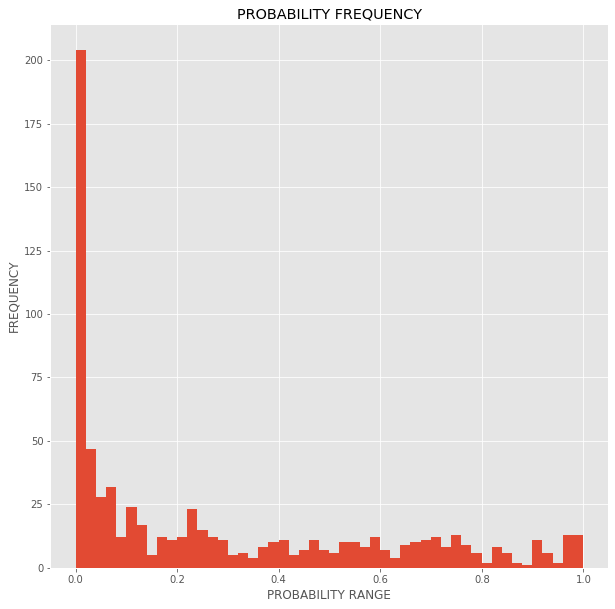

In [764]:
histogram(p_list, 50)

What error metric are you employing?Error
The skew is 1.0575107579041256
The mean is 2.024291279421264
The standard deviation is 1.7368919465052848
The data is very positively skewed


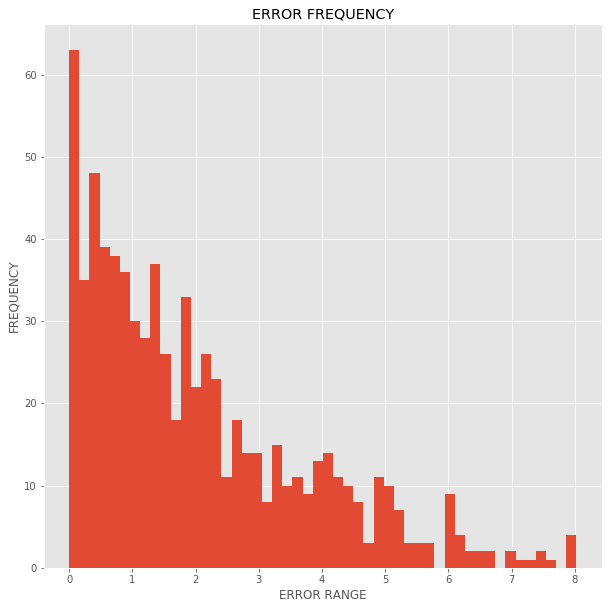

In [765]:
histogram(err_list, 50)

What error metric are you employing?Sample Size
The skew is 6.600414802622166
The mean is 10.113821138211382
The standard deviation is 16.79295415927089
The data is very positively skewed


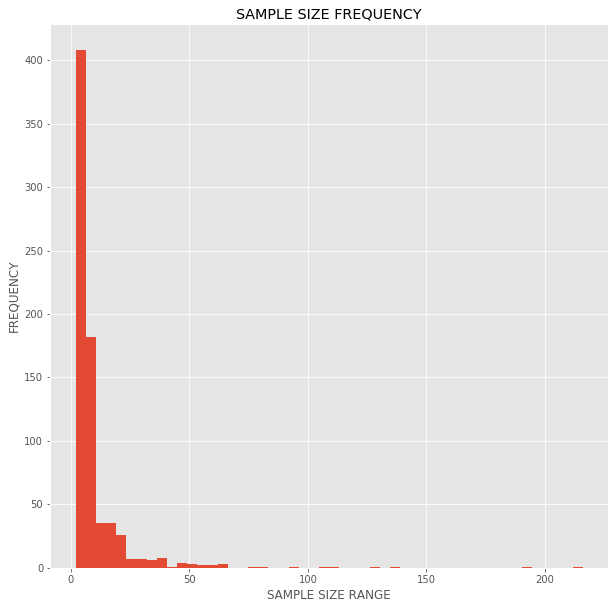

In [767]:
histogram(sample_list, 50)

# Normalize Error

explain here why normalization is necessarily --> see exponential shape of curve --> normalization key for linearity

In [744]:
def u_sub(sample_list):
    u_list = []
    for item in sample_list:
        if item > 0:
            u = math.log(1*item)
            u_list.append(u)
        else:
            u_list.append(-1000)
            #log(0) is essentially a very large negative number
    return u_list

In [741]:
sub_list = u_sub(sample_list) #use u_sub list in order to get a better approximation of linearity

In [745]:
sub_err = u_sub(err_list)

In [746]:
sub_err

[0.3483551218762181,
 -0.5188484619647831,
 -1.0297672168037684,
 0.6477782633237286,
 1.2814974127703715,
 0.7230071642975675,
 0.6154700336233968,
 -0.3806205753591132,
 1.8036342183775715,
 2.068153226286704,
 1.0837666211082413,
 0.4635265275794211,
 -1000,
 1.3244413423111767,
 1.7930459764374462,
 1.1031655831188167,
 1.9890229656518037,
 2.0825658148484334,
 -0.11106124448048733,
 0.0924571249882827,
 0.07936789384310265,
 0.8785492492729717,
 -2.3251010963217307,
 1.087539946906153,
 1.6214777945027927,
 0.34014458398708447,
 2.0663491149176796,
 1.1086870430045255,
 0.010019430180445724,
 0.7117176291997398,
 -0.8701370015097075,
 1.2006707909632115,
 -1.1311031475789308,
 -1.3911315488387284,
 1.0360575600947382,
 -1.0130293417138405,
 1.457840089068908,
 -0.9057954046682735,
 1.9642273300198136,
 -0.0052831648902787074,
 1.2689698616413978,
 -0.18071748589047118,
 -0.5162926235154198,
 -0.055324879974568975,
 0.7945432277427354,
 -0.12443121263462484,
 -1.3730579026558967,
 

# Linear Regression

_The purpose of linear regression is to provide a few key insights:_
1. Find the sample size, n, at which the probability of the two samples being different is less than alpha = .05. For this reason, the phase line for the probability linear regression should be drawn at .05.
2. Find the maximum error allowed in order to be statistically significant --> graph sample size versus average error and use the line in which n = the insight from the prior example, ie the minimum n needed to minimize the probability, to determine what line marks the maximum allowed error.

In [774]:
def linear_regression(error_list,  sample_size):
    #error_list could either be a list of errors or a list of probabilities
    err_type = input('Probability or Error?')
    
    Data = {'Sample Size': sample_size, err_type: error_list}
    dataframe = DataFrame(Data,columns=['Sample Size',err_type])
    X = dataframe.iloc[:, 0].values.reshape(-1, 1)  # values converts it into a numpy array
    Y = dataframe.iloc[:, 1].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column
    linear_regressor = LinearRegression()  # create object for the class
    model = linear_regressor.fit(X, Y)# perform linear regression
    det = model.score(X,Y)
    intercept = model.intercept_
    coef = model.coef_
    print('The coefficient of determination is:', model.score(X,Y))
    print('The intercept of the model is:', model.intercept_)
    print('The coefficient of the model is:', model.coef_)
    Y_pred = linear_regressor.predict(X)  # make predictions
    plt.figure(figsize=(10,10))
    plt.scatter(X, Y)
    plt.plot(X, Y_pred, color='red')
    plt.axvline(x=1)
    plt.title(str(err_type).upper() + ' ' + 'VERSUS LOG NORMALIZED SAMPLE SIZE')
    plt.xlabel("SAMPLE SIZE")
    plt.ylabel(err_type.upper())
    plt.show()
    
    lat = dataframe['Sample Size'].tolist()
    err = dataframe[err_type].tolist()
    x = pd.Series(lat)
    y = pd.Series(err)
    correlation = x.corr(y)
    print(correlation)
    if correlation == -1:
        print('There is a perfect negative correlation')
    else:
        if correlation < -.7:
            print('There is a strong negative correlation')
        else:
            if correlation < -.3:
                print('There is a moderate negative correlation')
            else:
                if correlation < 0:
                    print('There is a weak negative correlation')
                else:
                    if correlation == 0:
                        print('There is no correlation')
                    else:
                        if correlation < 0.3:
                            print('There is a weak positive correlation')
                        else:
                            if correlation < 0.7:
                                print('There is a moderate positive correlation')
                            else:
                                if correlation < 1:
                                    print('There is a strong positive correlation')
                                else:
                                    if correlation == 1:
                                        print('There is a perfect positive correlation')
    return intercept, coef

Probability or Error?Probability
The coefficient of determination is: 0.03855983996656709
The intercept of the model is: [0.32293299]
The coefficient of the model is: [[-0.00363201]]


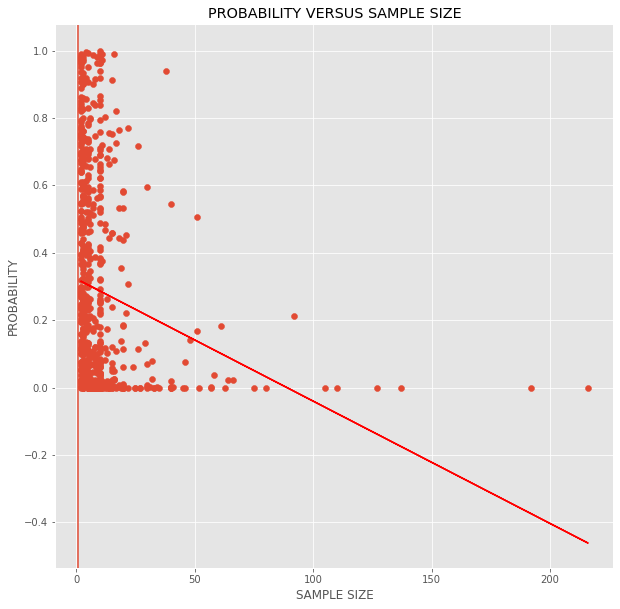

-0.1963665958521631
There is a weak negative correlation


In [752]:
p_intercept, p_coeff = linear_regression(p_list, sample_list)

In [ ]:
#need a function which finds the intercept between the sample size and the probability of .05
#Use this value to find the minimum threshold for n

Probability or Error?Error
The coefficient of determination is: 0.10114716728544848
The intercept of the model is: [2.35697981]
The coefficient of the model is: [[-0.03289444]]


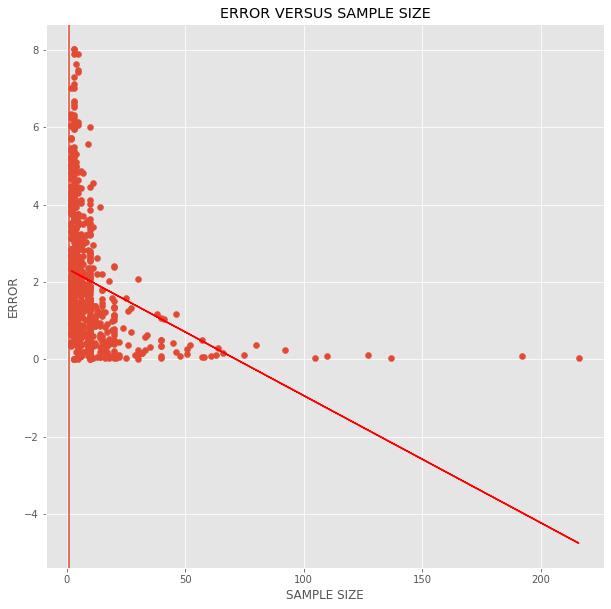

-0.3180364244633757
There is a moderate negative correlation


In [753]:
err_intercept, err_coeff = linear_regression(err_list, sample_list)

Probability or Error?Probability
The coefficient of determination is: 0.08178636067385536
The intercept of the model is: [0.46784688]
The coefficient of the model is: [[-0.10003735]]


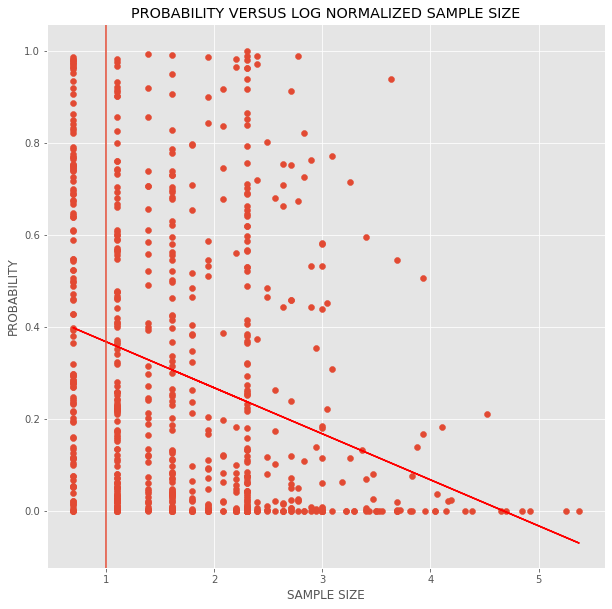

-0.28598314753470194
There is a weak negative correlation


In [775]:
p_intercept, p_coeff = linear_regression(p_list, sub_list)

Probability or Error?Error
The coefficient of determination is: 0.2432476644232662
The intercept of the model is: [3.7760704]
The coefficient of the model is: [[-0.96474459]]


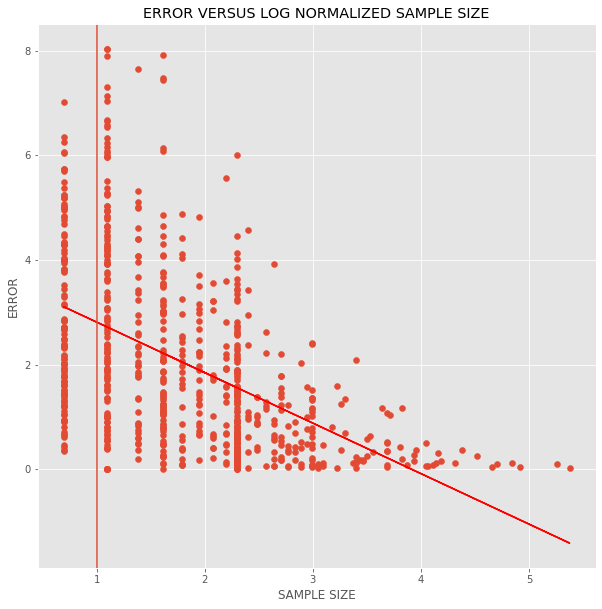

-0.4932014440604024
There is a moderate negative correlation


In [776]:
err_intercept, err_coeff = linear_regression(err_list, sub_list)

In [772]:
def prediction(err_cons, err_coeff, p_coeff, p_const):
    factor = (0.05 - p_const) / p_coeff
    factor = abs(factor)
    num_samples = math.exp(factor)
    avg_error = err_coeff*num_samples + err_cons
    print('The predicted number of samples needed to attain a statistically low error value is' + ' ' 
          + str(num_samples) + ' ' + 'samples')
    #print('Given a predicted number of samples, the error is bounded by' + ' ' + str(avg_error) + ' ' + 'meters')
    return num_samples

In [773]:
prediction(err_intercept, err_coeff, p_coeff, p_intercept)

The predicted number of samples needed to attain a statistically low error value is 65.16410460617932 samples


65.16410460617932

# K Means Algorithm

_Run a K-Means algorithm to investigate intrinsic clustering patterns between a tree height's geolocation and the approximate average error --> are certain regions prone to high or low error?_

In [777]:
def list_to_dataframe(err, key):
    lat_list = []
    long_list = []
    for item in key:
        lat = item[0]
        lat_list.append(lat)
        long = item[1]
        long_list.append(long)
    Data = {'X': lat_list , 'Y': long_list, 'Z': err}
    dataframe = DataFrame(Data,columns=['X','Y', 'Z'])
    return dataframe

In [778]:
err_df = list_to_dataframe(err_list, key_list)

In [779]:
def elbow_method(dataframe):
    wcss = []
    for i in range(1, 20):
        kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=500, n_init=20, random_state=0)
        kmeans.fit(dataframe)
        wcss.append(kmeans.inertia_)
    plt.plot(range(1, 20), wcss)
    plt.title('Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    return plt.show()

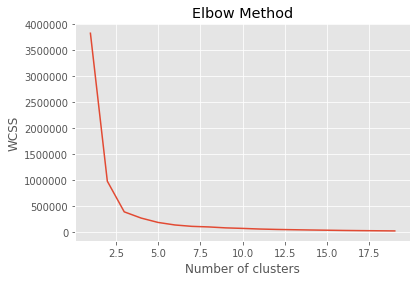

In [780]:
elbow_method(err_df)

In [785]:
def k_means_algorithm(dataframe):
    kmeans = KMeans(n_clusters=5).fit(dataframe)
    centroids = kmeans.cluster_centers_
    fig= plt.figure(figsize=(10,10))
    plt.scatter(dataframe['X'], dataframe['Y'],  c= kmeans.labels_.astype(float), s=200, alpha=0.5)
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s = 200)
    return plt.show(), centroids

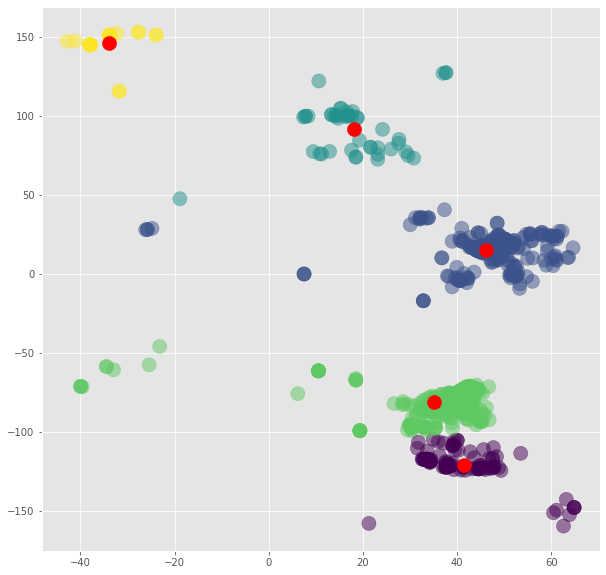

(None,
 array([[  41.56885417, -120.87041667,    2.35549978],
        [  46.24603922,   14.99235294,    1.79905199],
        [  18.1076087 ,   92.15673913,    2.12402424],
        [  35.05141066,  -81.07815047,    2.09357409],
        [ -33.95590909,  146.24954545,    1.97661272]]))

In [786]:
k_means_algorithm(err_df)

Employ geopandas to determine what cities / countries are the "centers" of these K-mean clusters. Which exhibit statistically high error? Which exhibit statistically low error?

Manually extract cities / countries that are the centers of the K-Means clusters

general framework:
1. convert centroids to a list format
2. extract lat, long information
key = (lat,long)
location = locator.reverse(key)
dictionary = location.raw
search dictionary for important information pertaining to country, city
fix nitty gritty when we get to it

# Map Geospatial Data